# Norman

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import rapids_singlecell as rsc
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: True


In [3]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [4]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    adata_file_path = os.path.join(tardis.config.io_directories["processed"], "cpa_Norman2019_prep_new.h5ad")
    assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
    adata = ad.read_h5ad(adata_file_path)
    adata.X = adata.layers["counts"].copy()
    del adata.layers
    gc.collect()
adata

AnnData object with n_obs × n_vars = 108497 × 5000
    obs: 'cov_drug_dose_name', 'dose_val', 'control', 'condition', 'guide_identity', 'drug_dose_name', 'cell_type', 'split', 'split1', 'split2', 'split3', 'split4', 'split5', 'split6', 'split7', 'split8', 'split9', 'split10', 'split11', 'split12', 'split13', 'split14', 'split15', 'split16', 'split17', 'split18', 'split19', 'split20', 'split21', 'split22', 'split23', 'split24', 'split25'
    var: 'gene_symbols', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'rank_genes_groups_cov'

## Train

In [5]:
warmup_epoch_range = [12, 48]
dtc_w1 = 400
dtc_w2 = 40

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "condition",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            )
        ]
    )
]

In [6]:
n_epochs_kl_warmup = 400

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(24 + 8 * len(disentenglement_targets_configurations)), 
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.1,
    include_auxillary_loss = True,
    encode_covariates=False
)

train_params = dict(
    max_epochs=1000,
    train_size=0.8,
    batch_size=512,
    check_val_every_n_epoch=10,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=True,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-3,
        weight_decay=1e-6,
        # optimizer="AdamW"
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

CUDA backend failed to initialize: Found cuDNN version 8700, but JAX was built against version 8907, which is newer. The copy of cuDNN that is installed must be at least as new as the version against which JAX was built. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: o5nxe79x
Name: gallant-breeze-617
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/o5nxe79x
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240507_115223-o5nxe79x/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
You are using a CUDA device ('NVIDIA A100-PCIE-40GB MIG 3g.20gb') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [MIG-5f1dabc9-296d-5f69-a212-e7de5c7586cb]


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/1000 [00:00<?, ?it/s]

Epoch 1/1000:   0%|          | 0/1000 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `training` set. Number of elements in each group: 219,391,444,179,393,292,541,147,457,366,411,371,239,290,52,209,453,294,264,530,240,276,147,54,317,142,108,293,101,88,183,205,57,337,237,164,268,147,92,192,375,455,336,946,144,384,171,191,278,321,227,148,375,271,269,369,303,639,304,299,237,588,243,144,253,332,276,713,359,354,255,379,360,354,130,227,221,157,59,123,197,510,319,270,326,224,143,235,376,164,144,108,264,405,156,162,448,79,148,306,169,379,101,240,179,218,336,137,149,285,280,109,105,358,336,367,253,38,46,205,226,270,73,200,329,254,200,237,290,196,977,285,194,515,293,148,524,349,494,471,208,467,470,267,382,239,345,246,290,304,265,243,265,401,413,252,238,196,152,618,251,237,137,145,165,162,542,241,386,204,261,391,607,416,302,263,232,230,182,176,215,193,207,246,606,354,328,375,369,7142,434,290,195,169,341,168,262,273,162,3

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `validation` set. Number of elements in each group: 57,90,114,53,102,87,146,28,125,97,122,93,62,68,7,55,109,71,84,133,66,59,41,10,93,42,26,71,25,19,47,40,7,75,49,47,63,33,22,45,93,111,79,273,35,91,44,50,77,77,58,30,95,57,60,109,84,148,78,67,53,143,54,39,69,93,78,192,82,91,69,80,91,91,29,57,56,34,12,28,50,120,63,75,100,48,49,60,103,52,31,22,65,89,36,38,104,17,45,62,46,84,25,63,58,56,74,30,34,83,69,31,36,87,91,77,74,16,13,61,52,59,23,54,66,57,37,61,71,67,220,52,47,132,82,44,99,83,132,110,53,104,109,71,69,61,99,56,73,62,74,59,54,99,84,61,60,41,40,152,59,56,39,41,50,40,125,74,94,65,84,121,143,97,70,59,52,61,36,46,49,43,48,59,157,80,84,71,94,1765,96,59,50,42,105,49,69,59,38,81,32,67,54,79,75,149,67,65,113,28,20,44,70,69,26,58,69,85,36,54,68,82,58,66,63,62,64,59,58,65,56,116,56,74,10,42,41,130,136,139,97,78,69,67,206,114,24,70,57,48

Epoch 1/1000:   0%|          | 1/1000 [00:20<5:44:29, 20.69s/it]

Epoch 1/1000:   0%|          | 1/1000 [00:20<5:44:29, 20.69s/it, v_num=9x_1, total_loss_train=1.45e+3, kl_local_train=134]

Epoch 2/1000:   0%|          | 1/1000 [00:20<5:44:29, 20.69s/it, v_num=9x_1, total_loss_train=1.45e+3, kl_local_train=134]

Epoch 2/1000:   0%|          | 2/1000 [00:29<3:46:28, 13.62s/it, v_num=9x_1, total_loss_train=1.45e+3, kl_local_train=134]

Epoch 2/1000:   0%|          | 2/1000 [00:29<3:46:28, 13.62s/it, v_num=9x_1, total_loss_train=1.31e+3, kl_local_train=61.7]

Epoch 3/1000:   0%|          | 2/1000 [00:29<3:46:28, 13.62s/it, v_num=9x_1, total_loss_train=1.31e+3, kl_local_train=61.7]

Epoch 3/1000:   0%|          | 3/1000 [00:37<3:08:23, 11.34s/it, v_num=9x_1, total_loss_train=1.31e+3, kl_local_train=61.7]

Epoch 3/1000:   0%|          | 3/1000 [00:37<3:08:23, 11.34s/it, v_num=9x_1, total_loss_train=1.3e+3, kl_local_train=4.96] 

Epoch 4/1000:   0%|          | 3/1000 [00:37<3:08:23, 11.34s/it, v_num=9x_1, total_loss_train=1.3e+3, kl_local_train=4.96]

Epoch 4/1000:   0%|          | 4/1000 [00:46<2:51:19, 10.32s/it, v_num=9x_1, total_loss_train=1.3e+3, kl_local_train=4.96]

Epoch 4/1000:   0%|          | 4/1000 [00:46<2:51:19, 10.32s/it, v_num=9x_1, total_loss_train=1.29e+3, kl_local_train=2.66]

Epoch 5/1000:   0%|          | 4/1000 [00:46<2:51:19, 10.32s/it, v_num=9x_1, total_loss_train=1.29e+3, kl_local_train=2.66]

Epoch 5/1000:   0%|          | 5/1000 [00:55<2:43:53,  9.88s/it, v_num=9x_1, total_loss_train=1.29e+3, kl_local_train=2.66]

Epoch 5/1000:   0%|          | 5/1000 [00:55<2:43:53,  9.88s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=36.7]

Epoch 6/1000:   0%|          | 5/1000 [00:55<2:43:53,  9.88s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=36.7]

Epoch 6/1000:   1%|          | 6/1000 [01:04<2:39:18,  9.62s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=36.7]

Epoch 6/1000:   1%|          | 6/1000 [01:04<2:39:18,  9.62s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=31.7]

Epoch 7/1000:   1%|          | 6/1000 [01:04<2:39:18,  9.62s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=31.7]

Epoch 7/1000:   1%|          | 7/1000 [01:14<2:37:18,  9.50s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=31.7]

Epoch 7/1000:   1%|          | 7/1000 [01:14<2:37:18,  9.50s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=33.1]

Epoch 8/1000:   1%|          | 7/1000 [01:14<2:37:18,  9.50s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=33.1]

Epoch 8/1000:   1%|          | 8/1000 [01:23<2:35:26,  9.40s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=33.1]

Epoch 8/1000:   1%|          | 8/1000 [01:23<2:35:26,  9.40s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 9/1000:   1%|          | 8/1000 [01:23<2:35:26,  9.40s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 9/1000:   1%|          | 9/1000 [01:32<2:32:41,  9.25s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 9/1000:   1%|          | 9/1000 [01:32<2:32:41,  9.25s/it, v_num=9x_1, total_loss_train=1.22e+3, kl_local_train=39.6]

Epoch 10/1000:   1%|          | 9/1000 [01:32<2:32:41,  9.25s/it, v_num=9x_1, total_loss_train=1.22e+3, kl_local_train=39.6]

Epoch 10/1000:   1%|          | 10/1000 [01:41<2:30:19,  9.11s/it, v_num=9x_1, total_loss_train=1.22e+3, kl_local_train=39.6]

Epoch 10/1000:   1%|          | 10/1000 [01:41<2:30:19,  9.11s/it, v_num=9x_1, total_loss_train=1.21e+3, kl_local_train=40.4]

Epoch 11/1000:   1%|          | 10/1000 [01:41<2:30:19,  9.11s/it, v_num=9x_1, total_loss_train=1.21e+3, kl_local_train=40.4]

Epoch 11/1000:   1%|          | 11/1000 [01:50<2:29:31,  9.07s/it, v_num=9x_1, total_loss_train=1.21e+3, kl_local_train=40.4]

Epoch 11/1000:   1%|          | 11/1000 [01:50<2:29:31,  9.07s/it, v_num=9x_1, total_loss_train=1.2e+3, kl_local_train=40.4] 

Epoch 12/1000:   1%|          | 11/1000 [01:50<2:29:31,  9.07s/it, v_num=9x_1, total_loss_train=1.2e+3, kl_local_train=40.4]

Epoch 12/1000:   1%|          | 12/1000 [01:58<2:27:17,  8.95s/it, v_num=9x_1, total_loss_train=1.2e+3, kl_local_train=40.4]

Epoch 12/1000:   1%|          | 12/1000 [01:58<2:27:17,  8.95s/it, v_num=9x_1, total_loss_train=1.19e+3, kl_local_train=40.7]

Epoch 13/1000:   1%|          | 12/1000 [01:58<2:27:17,  8.95s/it, v_num=9x_1, total_loss_train=1.19e+3, kl_local_train=40.7]

Epoch 13/1000:   1%|▏         | 13/1000 [02:07<2:27:11,  8.95s/it, v_num=9x_1, total_loss_train=1.19e+3, kl_local_train=40.7]

Epoch 13/1000:   1%|▏         | 13/1000 [02:07<2:27:11,  8.95s/it, v_num=9x_1, total_loss_train=1.19e+3, kl_local_train=41.9]

Epoch 14/1000:   1%|▏         | 13/1000 [02:07<2:27:11,  8.95s/it, v_num=9x_1, total_loss_train=1.19e+3, kl_local_train=41.9]

Epoch 14/1000:   1%|▏         | 14/1000 [02:16<2:27:55,  9.00s/it, v_num=9x_1, total_loss_train=1.19e+3, kl_local_train=41.9]

Epoch 14/1000:   1%|▏         | 14/1000 [02:16<2:27:55,  9.00s/it, v_num=9x_1, total_loss_train=1.18e+3, kl_local_train=46.3]

Epoch 15/1000:   1%|▏         | 14/1000 [02:16<2:27:55,  9.00s/it, v_num=9x_1, total_loss_train=1.18e+3, kl_local_train=46.3]

Epoch 15/1000:   2%|▏         | 15/1000 [02:25<2:25:31,  8.86s/it, v_num=9x_1, total_loss_train=1.18e+3, kl_local_train=46.3]

Epoch 15/1000:   2%|▏         | 15/1000 [02:25<2:25:31,  8.86s/it, v_num=9x_1, total_loss_train=1.18e+3, kl_local_train=53]  

Epoch 16/1000:   2%|▏         | 15/1000 [02:25<2:25:31,  8.86s/it, v_num=9x_1, total_loss_train=1.18e+3, kl_local_train=53]

Epoch 16/1000:   2%|▏         | 16/1000 [02:34<2:25:20,  8.86s/it, v_num=9x_1, total_loss_train=1.18e+3, kl_local_train=53]

Epoch 16/1000:   2%|▏         | 16/1000 [02:34<2:25:20,  8.86s/it, v_num=9x_1, total_loss_train=1.18e+3, kl_local_train=56.4]

Epoch 17/1000:   2%|▏         | 16/1000 [02:34<2:25:20,  8.86s/it, v_num=9x_1, total_loss_train=1.18e+3, kl_local_train=56.4]

Epoch 17/1000:   2%|▏         | 17/1000 [02:43<2:24:58,  8.85s/it, v_num=9x_1, total_loss_train=1.18e+3, kl_local_train=56.4]

Epoch 17/1000:   2%|▏         | 17/1000 [02:43<2:24:58,  8.85s/it, v_num=9x_1, total_loss_train=1.18e+3, kl_local_train=59.4]

Epoch 18/1000:   2%|▏         | 17/1000 [02:43<2:24:58,  8.85s/it, v_num=9x_1, total_loss_train=1.18e+3, kl_local_train=59.4]

Epoch 18/1000:   2%|▏         | 18/1000 [02:51<2:24:08,  8.81s/it, v_num=9x_1, total_loss_train=1.18e+3, kl_local_train=59.4]

Epoch 18/1000:   2%|▏         | 18/1000 [02:51<2:24:08,  8.81s/it, v_num=9x_1, total_loss_train=1.19e+3, kl_local_train=63.9]

Epoch 19/1000:   2%|▏         | 18/1000 [02:51<2:24:08,  8.81s/it, v_num=9x_1, total_loss_train=1.19e+3, kl_local_train=63.9]

Epoch 19/1000:   2%|▏         | 19/1000 [03:00<2:24:10,  8.82s/it, v_num=9x_1, total_loss_train=1.19e+3, kl_local_train=63.9]

Epoch 19/1000:   2%|▏         | 19/1000 [03:00<2:24:10,  8.82s/it, v_num=9x_1, total_loss_train=1.19e+3, kl_local_train=67]  

Epoch 20/1000:   2%|▏         | 19/1000 [03:00<2:24:10,  8.82s/it, v_num=9x_1, total_loss_train=1.19e+3, kl_local_train=67]

Epoch 20/1000:   2%|▏         | 20/1000 [03:09<2:26:07,  8.95s/it, v_num=9x_1, total_loss_train=1.19e+3, kl_local_train=67]

Epoch 20/1000:   2%|▏         | 20/1000 [03:09<2:26:07,  8.95s/it, v_num=9x_1, total_loss_train=1.19e+3, kl_local_train=69]

Epoch 21/1000:   2%|▏         | 20/1000 [03:09<2:26:07,  8.95s/it, v_num=9x_1, total_loss_train=1.19e+3, kl_local_train=69]

Epoch 21/1000:   2%|▏         | 21/1000 [03:18<2:26:50,  9.00s/it, v_num=9x_1, total_loss_train=1.19e+3, kl_local_train=69]

Epoch 21/1000:   2%|▏         | 21/1000 [03:18<2:26:50,  9.00s/it, v_num=9x_1, total_loss_train=1.19e+3, kl_local_train=72.2]

Epoch 22/1000:   2%|▏         | 21/1000 [03:18<2:26:50,  9.00s/it, v_num=9x_1, total_loss_train=1.19e+3, kl_local_train=72.2]

Epoch 22/1000:   2%|▏         | 22/1000 [03:27<2:24:17,  8.85s/it, v_num=9x_1, total_loss_train=1.19e+3, kl_local_train=72.2]

Epoch 22/1000:   2%|▏         | 22/1000 [03:27<2:24:17,  8.85s/it, v_num=9x_1, total_loss_train=1.19e+3, kl_local_train=77.5]

Epoch 23/1000:   2%|▏         | 22/1000 [03:27<2:24:17,  8.85s/it, v_num=9x_1, total_loss_train=1.19e+3, kl_local_train=77.5]

Epoch 23/1000:   2%|▏         | 23/1000 [03:35<2:21:37,  8.70s/it, v_num=9x_1, total_loss_train=1.19e+3, kl_local_train=77.5]

Epoch 23/1000:   2%|▏         | 23/1000 [03:35<2:21:37,  8.70s/it, v_num=9x_1, total_loss_train=1.19e+3, kl_local_train=77.6]

Epoch 24/1000:   2%|▏         | 23/1000 [03:35<2:21:37,  8.70s/it, v_num=9x_1, total_loss_train=1.19e+3, kl_local_train=77.6]

Epoch 24/1000:   2%|▏         | 24/1000 [03:44<2:22:04,  8.73s/it, v_num=9x_1, total_loss_train=1.19e+3, kl_local_train=77.6]

Epoch 24/1000:   2%|▏         | 24/1000 [03:44<2:22:04,  8.73s/it, v_num=9x_1, total_loss_train=1.2e+3, kl_local_train=82]   

Epoch 25/1000:   2%|▏         | 24/1000 [03:44<2:22:04,  8.73s/it, v_num=9x_1, total_loss_train=1.2e+3, kl_local_train=82]

Epoch 25/1000:   2%|▎         | 25/1000 [03:53<2:24:06,  8.87s/it, v_num=9x_1, total_loss_train=1.2e+3, kl_local_train=82]

Epoch 25/1000:   2%|▎         | 25/1000 [03:53<2:24:06,  8.87s/it, v_num=9x_1, total_loss_train=1.2e+3, kl_local_train=80.8]

Epoch 26/1000:   2%|▎         | 25/1000 [03:53<2:24:06,  8.87s/it, v_num=9x_1, total_loss_train=1.2e+3, kl_local_train=80.8]

Epoch 26/1000:   3%|▎         | 26/1000 [04:02<2:22:53,  8.80s/it, v_num=9x_1, total_loss_train=1.2e+3, kl_local_train=80.8]

Epoch 26/1000:   3%|▎         | 26/1000 [04:02<2:22:53,  8.80s/it, v_num=9x_1, total_loss_train=1.2e+3, kl_local_train=84.6]

Epoch 27/1000:   3%|▎         | 26/1000 [04:02<2:22:53,  8.80s/it, v_num=9x_1, total_loss_train=1.2e+3, kl_local_train=84.6]

Epoch 27/1000:   3%|▎         | 27/1000 [04:10<2:20:23,  8.66s/it, v_num=9x_1, total_loss_train=1.2e+3, kl_local_train=84.6]

Epoch 27/1000:   3%|▎         | 27/1000 [04:10<2:20:23,  8.66s/it, v_num=9x_1, total_loss_train=1.2e+3, kl_local_train=82.1]

Epoch 28/1000:   3%|▎         | 27/1000 [04:10<2:20:23,  8.66s/it, v_num=9x_1, total_loss_train=1.2e+3, kl_local_train=82.1]

Epoch 28/1000:   3%|▎         | 28/1000 [04:19<2:21:05,  8.71s/it, v_num=9x_1, total_loss_train=1.2e+3, kl_local_train=82.1]

Epoch 28/1000:   3%|▎         | 28/1000 [04:19<2:21:05,  8.71s/it, v_num=9x_1, total_loss_train=1.21e+3, kl_local_train=82.7]

Epoch 29/1000:   3%|▎         | 28/1000 [04:19<2:21:05,  8.71s/it, v_num=9x_1, total_loss_train=1.21e+3, kl_local_train=82.7]

Epoch 29/1000:   3%|▎         | 29/1000 [04:28<2:21:48,  8.76s/it, v_num=9x_1, total_loss_train=1.21e+3, kl_local_train=82.7]

Epoch 29/1000:   3%|▎         | 29/1000 [04:28<2:21:48,  8.76s/it, v_num=9x_1, total_loss_train=1.21e+3, kl_local_train=84.7]

Epoch 30/1000:   3%|▎         | 29/1000 [04:28<2:21:48,  8.76s/it, v_num=9x_1, total_loss_train=1.21e+3, kl_local_train=84.7]

Epoch 30/1000:   3%|▎         | 30/1000 [04:37<2:21:47,  8.77s/it, v_num=9x_1, total_loss_train=1.21e+3, kl_local_train=84.7]

Epoch 30/1000:   3%|▎         | 30/1000 [04:37<2:21:47,  8.77s/it, v_num=9x_1, total_loss_train=1.21e+3, kl_local_train=88.6]

Epoch 31/1000:   3%|▎         | 30/1000 [04:37<2:21:47,  8.77s/it, v_num=9x_1, total_loss_train=1.21e+3, kl_local_train=88.6]

Epoch 31/1000:   3%|▎         | 31/1000 [04:46<2:22:45,  8.84s/it, v_num=9x_1, total_loss_train=1.21e+3, kl_local_train=88.6]

Epoch 31/1000:   3%|▎         | 31/1000 [04:46<2:22:45,  8.84s/it, v_num=9x_1, total_loss_train=1.22e+3, kl_local_train=88.9]

Epoch 32/1000:   3%|▎         | 31/1000 [04:46<2:22:45,  8.84s/it, v_num=9x_1, total_loss_train=1.22e+3, kl_local_train=88.9]

Epoch 32/1000:   3%|▎         | 32/1000 [04:54<2:21:30,  8.77s/it, v_num=9x_1, total_loss_train=1.22e+3, kl_local_train=88.9]

Epoch 32/1000:   3%|▎         | 32/1000 [04:54<2:21:30,  8.77s/it, v_num=9x_1, total_loss_train=1.22e+3, kl_local_train=93.6]

Epoch 33/1000:   3%|▎         | 32/1000 [04:54<2:21:30,  8.77s/it, v_num=9x_1, total_loss_train=1.22e+3, kl_local_train=93.6]

Epoch 33/1000:   3%|▎         | 33/1000 [05:03<2:20:52,  8.74s/it, v_num=9x_1, total_loss_train=1.22e+3, kl_local_train=93.6]

Epoch 33/1000:   3%|▎         | 33/1000 [05:03<2:20:52,  8.74s/it, v_num=9x_1, total_loss_train=1.22e+3, kl_local_train=94.6]

Epoch 34/1000:   3%|▎         | 33/1000 [05:03<2:20:52,  8.74s/it, v_num=9x_1, total_loss_train=1.22e+3, kl_local_train=94.6]

Epoch 34/1000:   3%|▎         | 34/1000 [05:13<2:24:09,  8.95s/it, v_num=9x_1, total_loss_train=1.22e+3, kl_local_train=94.6]

Epoch 34/1000:   3%|▎         | 34/1000 [05:13<2:24:09,  8.95s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=92.4]

Epoch 35/1000:   3%|▎         | 34/1000 [05:13<2:24:09,  8.95s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=92.4]

Epoch 35/1000:   4%|▎         | 35/1000 [05:22<2:24:18,  8.97s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=92.4]

Epoch 35/1000:   4%|▎         | 35/1000 [05:22<2:24:18,  8.97s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=95.9]

Epoch 36/1000:   4%|▎         | 35/1000 [05:22<2:24:18,  8.97s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=95.9]

Epoch 36/1000:   4%|▎         | 36/1000 [05:30<2:22:15,  8.85s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=95.9]

Epoch 36/1000:   4%|▎         | 36/1000 [05:30<2:22:15,  8.85s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=94.4]

Epoch 37/1000:   4%|▎         | 36/1000 [05:30<2:22:15,  8.85s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=94.4]

Epoch 37/1000:   4%|▎         | 37/1000 [05:39<2:19:56,  8.72s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=94.4]

Epoch 37/1000:   4%|▎         | 37/1000 [05:39<2:19:56,  8.72s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=90.8]

Epoch 38/1000:   4%|▎         | 37/1000 [05:39<2:19:56,  8.72s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=90.8]

Epoch 38/1000:   4%|▍         | 38/1000 [05:47<2:19:03,  8.67s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=90.8]

Epoch 38/1000:   4%|▍         | 38/1000 [05:47<2:19:03,  8.67s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=94.5]

Epoch 39/1000:   4%|▍         | 38/1000 [05:47<2:19:03,  8.67s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=94.5]

Epoch 39/1000:   4%|▍         | 39/1000 [05:56<2:20:43,  8.79s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=94.5]

Epoch 39/1000:   4%|▍         | 39/1000 [05:56<2:20:43,  8.79s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=92.8]

Epoch 40/1000:   4%|▍         | 39/1000 [05:56<2:20:43,  8.79s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=92.8]

Epoch 40/1000:   4%|▍         | 40/1000 [06:05<2:21:23,  8.84s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=92.8]

Epoch 40/1000:   4%|▍         | 40/1000 [06:05<2:21:23,  8.84s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=102] 

Epoch 41/1000:   4%|▍         | 40/1000 [06:05<2:21:23,  8.84s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=102]

Epoch 41/1000:   4%|▍         | 41/1000 [06:14<2:22:13,  8.90s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=102]

Epoch 41/1000:   4%|▍         | 41/1000 [06:14<2:22:13,  8.90s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=97.3]

Epoch 42/1000:   4%|▍         | 41/1000 [06:14<2:22:13,  8.90s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=97.3]

Epoch 42/1000:   4%|▍         | 42/1000 [06:23<2:23:13,  8.97s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=97.3]

Epoch 42/1000:   4%|▍         | 42/1000 [06:23<2:23:13,  8.97s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=97.3]

Epoch 43/1000:   4%|▍         | 42/1000 [06:23<2:23:13,  8.97s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=97.3]

Epoch 43/1000:   4%|▍         | 43/1000 [06:32<2:22:05,  8.91s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=97.3]

Epoch 43/1000:   4%|▍         | 43/1000 [06:32<2:22:05,  8.91s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=102] 

Epoch 44/1000:   4%|▍         | 43/1000 [06:32<2:22:05,  8.91s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=102]

Epoch 44/1000:   4%|▍         | 44/1000 [06:41<2:21:04,  8.85s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=102]

Epoch 44/1000:   4%|▍         | 44/1000 [06:41<2:21:04,  8.85s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=97.2]

Epoch 45/1000:   4%|▍         | 44/1000 [06:41<2:21:04,  8.85s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=97.2]

Epoch 45/1000:   4%|▍         | 45/1000 [06:49<2:19:10,  8.74s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=97.2]

Epoch 45/1000:   4%|▍         | 45/1000 [06:49<2:19:10,  8.74s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=104] 

Epoch 46/1000:   4%|▍         | 45/1000 [06:49<2:19:10,  8.74s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=104]

Epoch 46/1000:   5%|▍         | 46/1000 [06:58<2:18:54,  8.74s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=104]

Epoch 46/1000:   5%|▍         | 46/1000 [06:58<2:18:54,  8.74s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=103]

Epoch 47/1000:   5%|▍         | 46/1000 [06:58<2:18:54,  8.74s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=103]

Epoch 47/1000:   5%|▍         | 47/1000 [07:07<2:19:31,  8.78s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=103]

Epoch 47/1000:   5%|▍         | 47/1000 [07:07<2:19:31,  8.78s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=106]

Epoch 48/1000:   5%|▍         | 47/1000 [07:07<2:19:31,  8.78s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=106]

Epoch 48/1000:   5%|▍         | 48/1000 [07:16<2:18:52,  8.75s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=106]

Epoch 48/1000:   5%|▍         | 48/1000 [07:16<2:18:52,  8.75s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=101]

Epoch 49/1000:   5%|▍         | 48/1000 [07:16<2:18:52,  8.75s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=101]

Epoch 49/1000:   5%|▍         | 49/1000 [07:24<2:18:22,  8.73s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=101]

Epoch 49/1000:   5%|▍         | 49/1000 [07:24<2:18:22,  8.73s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=97.8]

Epoch 50/1000:   5%|▍         | 49/1000 [07:24<2:18:22,  8.73s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=97.8]

Epoch 50/1000:   5%|▌         | 50/1000 [07:33<2:18:30,  8.75s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=97.8]

Epoch 50/1000:   5%|▌         | 50/1000 [07:33<2:18:30,  8.75s/it, v_num=9x_1, total_loss_train=1.29e+3, kl_local_train=96.5]

Epoch 51/1000:   5%|▌         | 50/1000 [07:33<2:18:30,  8.75s/it, v_num=9x_1, total_loss_train=1.29e+3, kl_local_train=96.5]

Epoch 51/1000:   5%|▌         | 51/1000 [07:42<2:18:50,  8.78s/it, v_num=9x_1, total_loss_train=1.29e+3, kl_local_train=96.5]

Epoch 51/1000:   5%|▌         | 51/1000 [07:42<2:18:50,  8.78s/it, v_num=9x_1, total_loss_train=1.29e+3, kl_local_train=98.1]

Epoch 52/1000:   5%|▌         | 51/1000 [07:42<2:18:50,  8.78s/it, v_num=9x_1, total_loss_train=1.29e+3, kl_local_train=98.1]

Epoch 52/1000:   5%|▌         | 52/1000 [07:51<2:19:56,  8.86s/it, v_num=9x_1, total_loss_train=1.29e+3, kl_local_train=98.1]

Epoch 52/1000:   5%|▌         | 52/1000 [07:51<2:19:56,  8.86s/it, v_num=9x_1, total_loss_train=1.29e+3, kl_local_train=99.6]

Epoch 53/1000:   5%|▌         | 52/1000 [07:51<2:19:56,  8.86s/it, v_num=9x_1, total_loss_train=1.29e+3, kl_local_train=99.6]

Epoch 53/1000:   5%|▌         | 53/1000 [08:00<2:21:40,  8.98s/it, v_num=9x_1, total_loss_train=1.29e+3, kl_local_train=99.6]

Epoch 53/1000:   5%|▌         | 53/1000 [08:00<2:21:40,  8.98s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=96.1]

Epoch 54/1000:   5%|▌         | 53/1000 [08:00<2:21:40,  8.98s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=96.1]

Epoch 54/1000:   5%|▌         | 54/1000 [08:09<2:21:06,  8.95s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=96.1]

Epoch 54/1000:   5%|▌         | 54/1000 [08:09<2:21:06,  8.95s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=95]  

Epoch 55/1000:   5%|▌         | 54/1000 [08:09<2:21:06,  8.95s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=95]

Epoch 55/1000:   6%|▌         | 55/1000 [08:18<2:21:10,  8.96s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=95]

Epoch 55/1000:   6%|▌         | 55/1000 [08:18<2:21:10,  8.96s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=101]

Epoch 56/1000:   6%|▌         | 55/1000 [08:18<2:21:10,  8.96s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=101]

Epoch 56/1000:   6%|▌         | 56/1000 [08:27<2:19:03,  8.84s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=101]

Epoch 56/1000:   6%|▌         | 56/1000 [08:27<2:19:03,  8.84s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=92.3]

Epoch 57/1000:   6%|▌         | 56/1000 [08:27<2:19:03,  8.84s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=92.3]

Epoch 57/1000:   6%|▌         | 57/1000 [08:36<2:19:25,  8.87s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=92.3]

Epoch 57/1000:   6%|▌         | 57/1000 [08:36<2:19:25,  8.87s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=86.3]

Epoch 58/1000:   6%|▌         | 57/1000 [08:36<2:19:25,  8.87s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=86.3]

Epoch 58/1000:   6%|▌         | 58/1000 [08:45<2:20:04,  8.92s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=86.3]

Epoch 58/1000:   6%|▌         | 58/1000 [08:45<2:20:04,  8.92s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=85.3]

Epoch 59/1000:   6%|▌         | 58/1000 [08:45<2:20:04,  8.92s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=85.3]

Epoch 59/1000:   6%|▌         | 59/1000 [08:53<2:17:46,  8.79s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=85.3]

Epoch 59/1000:   6%|▌         | 59/1000 [08:53<2:17:46,  8.79s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=87.4]

Epoch 60/1000:   6%|▌         | 59/1000 [08:53<2:17:46,  8.79s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=87.4]

Epoch 60/1000:   6%|▌         | 60/1000 [09:02<2:18:01,  8.81s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=87.4]

Epoch 60/1000:   6%|▌         | 60/1000 [09:02<2:18:01,  8.81s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=86.2]

Epoch 61/1000:   6%|▌         | 60/1000 [09:02<2:18:01,  8.81s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=86.2]

Epoch 61/1000:   6%|▌         | 61/1000 [09:11<2:19:24,  8.91s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=86.2]

Epoch 61/1000:   6%|▌         | 61/1000 [09:11<2:19:24,  8.91s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=83]  

Epoch 62/1000:   6%|▌         | 61/1000 [09:11<2:19:24,  8.91s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=83]

Epoch 62/1000:   6%|▌         | 62/1000 [09:20<2:18:48,  8.88s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=83]

Epoch 62/1000:   6%|▌         | 62/1000 [09:20<2:18:48,  8.88s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=82.1]

Epoch 63/1000:   6%|▌         | 62/1000 [09:20<2:18:48,  8.88s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=82.1]

Epoch 63/1000:   6%|▋         | 63/1000 [09:29<2:17:53,  8.83s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=82.1]

Epoch 63/1000:   6%|▋         | 63/1000 [09:29<2:17:53,  8.83s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=83.4]

Epoch 64/1000:   6%|▋         | 63/1000 [09:29<2:17:53,  8.83s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=83.4]

Epoch 64/1000:   6%|▋         | 64/1000 [09:38<2:19:04,  8.92s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=83.4]

Epoch 64/1000:   6%|▋         | 64/1000 [09:38<2:19:04,  8.92s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=82.4]

Epoch 65/1000:   6%|▋         | 64/1000 [09:38<2:19:04,  8.92s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=82.4]

Epoch 65/1000:   6%|▋         | 65/1000 [09:47<2:20:40,  9.03s/it, v_num=9x_1, total_loss_train=1.28e+3, kl_local_train=82.4]

Epoch 65/1000:   6%|▋         | 65/1000 [09:47<2:20:40,  9.03s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=76.9]

Epoch 66/1000:   6%|▋         | 65/1000 [09:47<2:20:40,  9.03s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=76.9]

Epoch 66/1000:   7%|▋         | 66/1000 [09:56<2:20:16,  9.01s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=76.9]

Epoch 66/1000:   7%|▋         | 66/1000 [09:56<2:20:16,  9.01s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=76.9]

Epoch 67/1000:   7%|▋         | 66/1000 [09:56<2:20:16,  9.01s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=76.9]

Epoch 67/1000:   7%|▋         | 67/1000 [10:05<2:19:46,  8.99s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=76.9]

Epoch 67/1000:   7%|▋         | 67/1000 [10:05<2:19:46,  8.99s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=75.8]

Epoch 68/1000:   7%|▋         | 67/1000 [10:05<2:19:46,  8.99s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=75.8]

Epoch 68/1000:   7%|▋         | 68/1000 [10:14<2:20:04,  9.02s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=75.8]

Epoch 68/1000:   7%|▋         | 68/1000 [10:14<2:20:04,  9.02s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=77.9]

Epoch 69/1000:   7%|▋         | 68/1000 [10:14<2:20:04,  9.02s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=77.9]

Epoch 69/1000:   7%|▋         | 69/1000 [10:23<2:20:10,  9.03s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=77.9]

Epoch 69/1000:   7%|▋         | 69/1000 [10:23<2:20:10,  9.03s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=76]  

Epoch 70/1000:   7%|▋         | 69/1000 [10:23<2:20:10,  9.03s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=76]

Epoch 70/1000:   7%|▋         | 70/1000 [10:32<2:18:23,  8.93s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=76]

Epoch 70/1000:   7%|▋         | 70/1000 [10:32<2:18:23,  8.93s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=76.2]

Epoch 71/1000:   7%|▋         | 70/1000 [10:32<2:18:23,  8.93s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=76.2]

Epoch 71/1000:   7%|▋         | 71/1000 [10:41<2:18:29,  8.95s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=76.2]

Epoch 71/1000:   7%|▋         | 71/1000 [10:41<2:18:29,  8.95s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=74.8]

Epoch 72/1000:   7%|▋         | 71/1000 [10:41<2:18:29,  8.95s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=74.8]

Epoch 72/1000:   7%|▋         | 72/1000 [10:50<2:18:12,  8.94s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=74.8]

Epoch 72/1000:   7%|▋         | 72/1000 [10:50<2:18:12,  8.94s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=74.2]

Epoch 73/1000:   7%|▋         | 72/1000 [10:50<2:18:12,  8.94s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=74.2]

Epoch 73/1000:   7%|▋         | 73/1000 [10:58<2:16:57,  8.86s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=74.2]

Epoch 73/1000:   7%|▋         | 73/1000 [10:58<2:16:57,  8.86s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=74.2]

Epoch 74/1000:   7%|▋         | 73/1000 [10:58<2:16:57,  8.86s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=74.2]

Epoch 74/1000:   7%|▋         | 74/1000 [11:07<2:16:32,  8.85s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=74.2]

Epoch 74/1000:   7%|▋         | 74/1000 [11:07<2:16:32,  8.85s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=71.4]

Epoch 75/1000:   7%|▋         | 74/1000 [11:07<2:16:32,  8.85s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=71.4]

Epoch 75/1000:   8%|▊         | 75/1000 [11:17<2:19:36,  9.06s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=71.4]

Epoch 75/1000:   8%|▊         | 75/1000 [11:17<2:19:36,  9.06s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=74.4]

Epoch 76/1000:   8%|▊         | 75/1000 [11:17<2:19:36,  9.06s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=74.4]

Epoch 76/1000:   8%|▊         | 76/1000 [11:26<2:19:39,  9.07s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=74.4]

Epoch 76/1000:   8%|▊         | 76/1000 [11:26<2:19:39,  9.07s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=71.6]

Epoch 77/1000:   8%|▊         | 76/1000 [11:26<2:19:39,  9.07s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=71.6]

Epoch 77/1000:   8%|▊         | 77/1000 [11:35<2:18:26,  9.00s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=71.6]

Epoch 77/1000:   8%|▊         | 77/1000 [11:35<2:18:26,  9.00s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=69.3]

Epoch 78/1000:   8%|▊         | 77/1000 [11:35<2:18:26,  9.00s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=69.3]

Epoch 78/1000:   8%|▊         | 78/1000 [11:43<2:16:42,  8.90s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=69.3]

Epoch 78/1000:   8%|▊         | 78/1000 [11:43<2:16:42,  8.90s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=69]  

Epoch 79/1000:   8%|▊         | 78/1000 [11:43<2:16:42,  8.90s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=69]

Epoch 79/1000:   8%|▊         | 79/1000 [11:52<2:17:48,  8.98s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=69]

Epoch 79/1000:   8%|▊         | 79/1000 [11:52<2:17:48,  8.98s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=71]

Epoch 80/1000:   8%|▊         | 79/1000 [11:52<2:17:48,  8.98s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=71]

Epoch 80/1000:   8%|▊         | 80/1000 [12:02<2:18:14,  9.02s/it, v_num=9x_1, total_loss_train=1.27e+3, kl_local_train=71]

Epoch 80/1000:   8%|▊         | 80/1000 [12:02<2:18:14,  9.02s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=68.4]

Epoch 81/1000:   8%|▊         | 80/1000 [12:02<2:18:14,  9.02s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=68.4]

Epoch 81/1000:   8%|▊         | 81/1000 [12:10<2:16:35,  8.92s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=68.4]

Epoch 81/1000:   8%|▊         | 81/1000 [12:10<2:16:35,  8.92s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=68.3]

Epoch 82/1000:   8%|▊         | 81/1000 [12:10<2:16:35,  8.92s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=68.3]

Epoch 82/1000:   8%|▊         | 82/1000 [12:19<2:15:53,  8.88s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=68.3]

Epoch 82/1000:   8%|▊         | 82/1000 [12:19<2:15:53,  8.88s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=67.1]

Epoch 83/1000:   8%|▊         | 82/1000 [12:19<2:15:53,  8.88s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=67.1]

Epoch 83/1000:   8%|▊         | 83/1000 [12:28<2:15:24,  8.86s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=67.1]

Epoch 83/1000:   8%|▊         | 83/1000 [12:28<2:15:24,  8.86s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=66.3]

Epoch 84/1000:   8%|▊         | 83/1000 [12:28<2:15:24,  8.86s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=66.3]

Epoch 84/1000:   8%|▊         | 84/1000 [12:36<2:14:01,  8.78s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=66.3]

Epoch 84/1000:   8%|▊         | 84/1000 [12:36<2:14:01,  8.78s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=68]  

Epoch 85/1000:   8%|▊         | 84/1000 [12:36<2:14:01,  8.78s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=68]

Epoch 85/1000:   8%|▊         | 85/1000 [12:46<2:15:31,  8.89s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=68]

Epoch 85/1000:   8%|▊         | 85/1000 [12:46<2:15:31,  8.89s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=67]

Epoch 86/1000:   8%|▊         | 85/1000 [12:46<2:15:31,  8.89s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=67]

Epoch 86/1000:   9%|▊         | 86/1000 [12:55<2:18:22,  9.08s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=67]

Epoch 86/1000:   9%|▊         | 86/1000 [12:55<2:18:22,  9.08s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=65]

Epoch 87/1000:   9%|▊         | 86/1000 [12:55<2:18:22,  9.08s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=65]

Epoch 87/1000:   9%|▊         | 87/1000 [13:04<2:16:46,  8.99s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=65]

Epoch 87/1000:   9%|▊         | 87/1000 [13:04<2:16:46,  8.99s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=65.5]

Epoch 88/1000:   9%|▊         | 87/1000 [13:04<2:16:46,  8.99s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=65.5]

Epoch 88/1000:   9%|▉         | 88/1000 [13:12<2:14:52,  8.87s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=65.5]

Epoch 88/1000:   9%|▉         | 88/1000 [13:12<2:14:52,  8.87s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=68.3]

Epoch 89/1000:   9%|▉         | 88/1000 [13:12<2:14:52,  8.87s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=68.3]

Epoch 89/1000:   9%|▉         | 89/1000 [13:21<2:15:00,  8.89s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=68.3]

Epoch 89/1000:   9%|▉         | 89/1000 [13:21<2:15:00,  8.89s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=67.6]

Epoch 90/1000:   9%|▉         | 89/1000 [13:21<2:15:00,  8.89s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=67.6]

Epoch 90/1000:   9%|▉         | 90/1000 [13:30<2:14:00,  8.84s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=67.6]

Epoch 90/1000:   9%|▉         | 90/1000 [13:30<2:14:00,  8.84s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=64.3]

Epoch 91/1000:   9%|▉         | 90/1000 [13:30<2:14:00,  8.84s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=64.3]

Epoch 91/1000:   9%|▉         | 91/1000 [13:39<2:14:38,  8.89s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=64.3]

Epoch 91/1000:   9%|▉         | 91/1000 [13:39<2:14:38,  8.89s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=66.5]

Epoch 92/1000:   9%|▉         | 91/1000 [13:39<2:14:38,  8.89s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=66.5]

Epoch 92/1000:   9%|▉         | 92/1000 [13:48<2:13:26,  8.82s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=66.5]

Epoch 92/1000:   9%|▉         | 92/1000 [13:48<2:13:26,  8.82s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=65.4]

Epoch 93/1000:   9%|▉         | 92/1000 [13:48<2:13:26,  8.82s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=65.4]

Epoch 93/1000:   9%|▉         | 93/1000 [13:57<2:13:05,  8.80s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=65.4]

Epoch 93/1000:   9%|▉         | 93/1000 [13:57<2:13:05,  8.80s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=64.1]

Epoch 94/1000:   9%|▉         | 93/1000 [13:57<2:13:05,  8.80s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=64.1]

Epoch 94/1000:   9%|▉         | 94/1000 [14:05<2:11:47,  8.73s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=64.1]

Epoch 94/1000:   9%|▉         | 94/1000 [14:05<2:11:47,  8.73s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=63.9]

Epoch 95/1000:   9%|▉         | 94/1000 [14:05<2:11:47,  8.73s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=63.9]

Epoch 95/1000:  10%|▉         | 95/1000 [14:14<2:10:58,  8.68s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=63.9]

Epoch 95/1000:  10%|▉         | 95/1000 [14:14<2:10:58,  8.68s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=65.1]

Epoch 96/1000:  10%|▉         | 95/1000 [14:14<2:10:58,  8.68s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=65.1]

Epoch 96/1000:  10%|▉         | 96/1000 [14:23<2:14:23,  8.92s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=65.1]

Epoch 96/1000:  10%|▉         | 96/1000 [14:23<2:14:23,  8.92s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=63.1]

Epoch 97/1000:  10%|▉         | 96/1000 [14:23<2:14:23,  8.92s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=63.1]

Epoch 97/1000:  10%|▉         | 97/1000 [14:32<2:13:59,  8.90s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=63.1]

Epoch 97/1000:  10%|▉         | 97/1000 [14:32<2:13:59,  8.90s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=63]  

Epoch 98/1000:  10%|▉         | 97/1000 [14:32<2:13:59,  8.90s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=63]

Epoch 98/1000:  10%|▉         | 98/1000 [14:41<2:12:54,  8.84s/it, v_num=9x_1, total_loss_train=1.26e+3, kl_local_train=63]

Epoch 98/1000:  10%|▉         | 98/1000 [14:41<2:12:54,  8.84s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=61.6]

Epoch 99/1000:  10%|▉         | 98/1000 [14:41<2:12:54,  8.84s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=61.6]

Epoch 99/1000:  10%|▉         | 99/1000 [14:50<2:14:57,  8.99s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=61.6]

Epoch 99/1000:  10%|▉         | 99/1000 [14:50<2:14:57,  8.99s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=63.3]

Epoch 100/1000:  10%|▉         | 99/1000 [14:50<2:14:57,  8.99s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=63.3]

Epoch 100/1000:  10%|█         | 100/1000 [14:59<2:13:52,  8.92s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=63.3]

Epoch 100/1000:  10%|█         | 100/1000 [14:59<2:13:52,  8.92s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=63.1]

Epoch 101/1000:  10%|█         | 100/1000 [14:59<2:13:52,  8.92s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=63.1]

Epoch 101/1000:  10%|█         | 101/1000 [15:07<2:12:10,  8.82s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=63.1]

Epoch 101/1000:  10%|█         | 101/1000 [15:07<2:12:10,  8.82s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=62.8]

Epoch 102/1000:  10%|█         | 101/1000 [15:07<2:12:10,  8.82s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=62.8]

Epoch 102/1000:  10%|█         | 102/1000 [15:16<2:11:56,  8.82s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=62.8]

Epoch 102/1000:  10%|█         | 102/1000 [15:16<2:11:56,  8.82s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=63.7]

Epoch 103/1000:  10%|█         | 102/1000 [15:16<2:11:56,  8.82s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=63.7]

Epoch 103/1000:  10%|█         | 103/1000 [15:25<2:11:58,  8.83s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=63.7]

Epoch 103/1000:  10%|█         | 103/1000 [15:25<2:11:58,  8.83s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=62.6]

Epoch 104/1000:  10%|█         | 103/1000 [15:25<2:11:58,  8.83s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=62.6]

Epoch 104/1000:  10%|█         | 104/1000 [15:34<2:12:46,  8.89s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=62.6]

Epoch 104/1000:  10%|█         | 104/1000 [15:34<2:12:46,  8.89s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=62.2]

Epoch 105/1000:  10%|█         | 104/1000 [15:34<2:12:46,  8.89s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=62.2]

Epoch 105/1000:  10%|█         | 105/1000 [15:43<2:13:42,  8.96s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=62.2]

Epoch 105/1000:  10%|█         | 105/1000 [15:43<2:13:42,  8.96s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=61.1]

Epoch 106/1000:  10%|█         | 105/1000 [15:43<2:13:42,  8.96s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=61.1]

Epoch 106/1000:  11%|█         | 106/1000 [15:52<2:12:16,  8.88s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=61.1]

Epoch 106/1000:  11%|█         | 106/1000 [15:52<2:12:16,  8.88s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=59.9]

Epoch 107/1000:  11%|█         | 106/1000 [15:52<2:12:16,  8.88s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=59.9]

Epoch 107/1000:  11%|█         | 107/1000 [16:01<2:12:10,  8.88s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=59.9]

Epoch 107/1000:  11%|█         | 107/1000 [16:01<2:12:10,  8.88s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=61.9]

Epoch 108/1000:  11%|█         | 107/1000 [16:01<2:12:10,  8.88s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=61.9]

Epoch 108/1000:  11%|█         | 108/1000 [16:09<2:10:52,  8.80s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=61.9]

Epoch 108/1000:  11%|█         | 108/1000 [16:09<2:10:52,  8.80s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=60.6]

Epoch 109/1000:  11%|█         | 108/1000 [16:09<2:10:52,  8.80s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=60.6]

Epoch 109/1000:  11%|█         | 109/1000 [16:18<2:11:38,  8.86s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=60.6]

Epoch 109/1000:  11%|█         | 109/1000 [16:18<2:11:38,  8.86s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=61.3]

Epoch 110/1000:  11%|█         | 109/1000 [16:18<2:11:38,  8.86s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=61.3]

Epoch 110/1000:  11%|█         | 110/1000 [16:28<2:15:09,  9.11s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=61.3]

Epoch 110/1000:  11%|█         | 110/1000 [16:28<2:15:09,  9.11s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=61.3]

Epoch 111/1000:  11%|█         | 110/1000 [16:28<2:15:09,  9.11s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=61.3]

Epoch 111/1000:  11%|█         | 111/1000 [16:37<2:12:31,  8.94s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=61.3]

Epoch 111/1000:  11%|█         | 111/1000 [16:37<2:12:31,  8.94s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=60.9]

Epoch 112/1000:  11%|█         | 111/1000 [16:37<2:12:31,  8.94s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=60.9]

Epoch 112/1000:  11%|█         | 112/1000 [16:46<2:12:39,  8.96s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=60.9]

Epoch 112/1000:  11%|█         | 112/1000 [16:46<2:12:39,  8.96s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=61.2]

Epoch 113/1000:  11%|█         | 112/1000 [16:46<2:12:39,  8.96s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=61.2]

Epoch 113/1000:  11%|█▏        | 113/1000 [16:54<2:11:40,  8.91s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=61.2]

Epoch 113/1000:  11%|█▏        | 113/1000 [16:54<2:11:40,  8.91s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=61.2]

Epoch 114/1000:  11%|█▏        | 113/1000 [16:54<2:11:40,  8.91s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=61.2]

Epoch 114/1000:  11%|█▏        | 114/1000 [17:04<2:13:25,  9.04s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=61.2]

Epoch 114/1000:  11%|█▏        | 114/1000 [17:04<2:13:25,  9.04s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=61.1]

Epoch 115/1000:  11%|█▏        | 114/1000 [17:04<2:13:25,  9.04s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=61.1]

Epoch 115/1000:  12%|█▏        | 115/1000 [17:13<2:12:53,  9.01s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=61.1]

Epoch 115/1000:  12%|█▏        | 115/1000 [17:13<2:12:53,  9.01s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=60.4]

Epoch 116/1000:  12%|█▏        | 115/1000 [17:13<2:12:53,  9.01s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=60.4]

Epoch 116/1000:  12%|█▏        | 116/1000 [17:21<2:10:18,  8.84s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=60.4]

Epoch 116/1000:  12%|█▏        | 116/1000 [17:21<2:10:18,  8.84s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=60.7]

Epoch 117/1000:  12%|█▏        | 116/1000 [17:21<2:10:18,  8.84s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=60.7]

Epoch 117/1000:  12%|█▏        | 117/1000 [17:31<2:12:17,  8.99s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=60.7]

Epoch 117/1000:  12%|█▏        | 117/1000 [17:31<2:12:17,  8.99s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=60.7]

Epoch 118/1000:  12%|█▏        | 117/1000 [17:31<2:12:17,  8.99s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=60.7]

Epoch 118/1000:  12%|█▏        | 118/1000 [17:39<2:10:13,  8.86s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=60.7]

Epoch 118/1000:  12%|█▏        | 118/1000 [17:39<2:10:13,  8.86s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=60.5]

Epoch 119/1000:  12%|█▏        | 118/1000 [17:39<2:10:13,  8.86s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=60.5]

Epoch 119/1000:  12%|█▏        | 119/1000 [17:48<2:11:12,  8.94s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=60.5]

Epoch 119/1000:  12%|█▏        | 119/1000 [17:48<2:11:12,  8.94s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=59.2]

Epoch 120/1000:  12%|█▏        | 119/1000 [17:48<2:11:12,  8.94s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=59.2]

Epoch 120/1000:  12%|█▏        | 120/1000 [17:58<2:12:55,  9.06s/it, v_num=9x_1, total_loss_train=1.25e+3, kl_local_train=59.2]

Epoch 120/1000:  12%|█▏        | 120/1000 [17:58<2:12:55,  9.06s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=58.8]

Epoch 121/1000:  12%|█▏        | 120/1000 [17:58<2:12:55,  9.06s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=58.8]

Epoch 121/1000:  12%|█▏        | 121/1000 [18:07<2:13:13,  9.09s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=58.8]

Epoch 121/1000:  12%|█▏        | 121/1000 [18:07<2:13:13,  9.09s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=60.4]

Epoch 122/1000:  12%|█▏        | 121/1000 [18:07<2:13:13,  9.09s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=60.4]

Epoch 122/1000:  12%|█▏        | 122/1000 [18:16<2:15:29,  9.26s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=60.4]

Epoch 122/1000:  12%|█▏        | 122/1000 [18:16<2:15:29,  9.26s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=59.7]

Epoch 123/1000:  12%|█▏        | 122/1000 [18:16<2:15:29,  9.26s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=59.7]

Epoch 123/1000:  12%|█▏        | 123/1000 [18:25<2:11:48,  9.02s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=59.7]

Epoch 123/1000:  12%|█▏        | 123/1000 [18:25<2:11:48,  9.02s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=59.6]

Epoch 124/1000:  12%|█▏        | 123/1000 [18:25<2:11:48,  9.02s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=59.6]

Epoch 124/1000:  12%|█▏        | 124/1000 [18:34<2:11:18,  8.99s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=59.6]

Epoch 124/1000:  12%|█▏        | 124/1000 [18:34<2:11:18,  8.99s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=60]  

Epoch 125/1000:  12%|█▏        | 124/1000 [18:34<2:11:18,  8.99s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=60]

Epoch 125/1000:  12%|█▎        | 125/1000 [18:43<2:11:00,  8.98s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=60]

Epoch 125/1000:  12%|█▎        | 125/1000 [18:43<2:11:00,  8.98s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=58.8]

Epoch 126/1000:  12%|█▎        | 125/1000 [18:43<2:11:00,  8.98s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=58.8]

Epoch 126/1000:  13%|█▎        | 126/1000 [18:52<2:11:59,  9.06s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=58.8]

Epoch 126/1000:  13%|█▎        | 126/1000 [18:52<2:11:59,  9.06s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=59]  

Epoch 127/1000:  13%|█▎        | 126/1000 [18:52<2:11:59,  9.06s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=59]

Epoch 127/1000:  13%|█▎        | 127/1000 [19:01<2:11:17,  9.02s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=59]

Epoch 127/1000:  13%|█▎        | 127/1000 [19:01<2:11:17,  9.02s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=58.6]

Epoch 128/1000:  13%|█▎        | 127/1000 [19:01<2:11:17,  9.02s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=58.6]

Epoch 128/1000:  13%|█▎        | 128/1000 [19:11<2:14:07,  9.23s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=58.6]

Epoch 128/1000:  13%|█▎        | 128/1000 [19:11<2:14:07,  9.23s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=59.1]

Epoch 129/1000:  13%|█▎        | 128/1000 [19:11<2:14:07,  9.23s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=59.1]

Epoch 129/1000:  13%|█▎        | 129/1000 [19:20<2:14:27,  9.26s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=59.1]

Epoch 129/1000:  13%|█▎        | 129/1000 [19:20<2:14:27,  9.26s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=59.2]

Epoch 130/1000:  13%|█▎        | 129/1000 [19:20<2:14:27,  9.26s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=59.2]

Epoch 130/1000:  13%|█▎        | 130/1000 [19:29<2:12:13,  9.12s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=59.2]

Epoch 130/1000:  13%|█▎        | 130/1000 [19:29<2:12:13,  9.12s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=59.2]

Epoch 131/1000:  13%|█▎        | 130/1000 [19:29<2:12:13,  9.12s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=59.2]

Epoch 131/1000:  13%|█▎        | 131/1000 [19:38<2:13:47,  9.24s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=59.2]

Epoch 131/1000:  13%|█▎        | 131/1000 [19:38<2:13:47,  9.24s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=58.1]

Epoch 132/1000:  13%|█▎        | 131/1000 [19:38<2:13:47,  9.24s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=58.1]

Epoch 132/1000:  13%|█▎        | 132/1000 [19:47<2:10:30,  9.02s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=58.1]

Epoch 132/1000:  13%|█▎        | 132/1000 [19:47<2:10:30,  9.02s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=59.2]

Epoch 133/1000:  13%|█▎        | 132/1000 [19:47<2:10:30,  9.02s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=59.2]

Epoch 133/1000:  13%|█▎        | 133/1000 [19:56<2:12:21,  9.16s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=59.2]

Epoch 133/1000:  13%|█▎        | 133/1000 [19:56<2:12:21,  9.16s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=58.8]

Epoch 134/1000:  13%|█▎        | 133/1000 [19:56<2:12:21,  9.16s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=58.8]

Epoch 134/1000:  13%|█▎        | 134/1000 [20:05<2:11:06,  9.08s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=58.8]

Epoch 134/1000:  13%|█▎        | 134/1000 [20:05<2:11:06,  9.08s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=58.7]

Epoch 135/1000:  13%|█▎        | 134/1000 [20:05<2:11:06,  9.08s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=58.7]

Epoch 135/1000:  14%|█▎        | 135/1000 [20:14<2:08:57,  8.94s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=58.7]

Epoch 135/1000:  14%|█▎        | 135/1000 [20:14<2:08:57,  8.94s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=58.5]

Epoch 136/1000:  14%|█▎        | 135/1000 [20:14<2:08:57,  8.94s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=58.5]

Epoch 136/1000:  14%|█▎        | 136/1000 [20:22<2:07:38,  8.86s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=58.5]

Epoch 136/1000:  14%|█▎        | 136/1000 [20:22<2:07:38,  8.86s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=58.6]

Epoch 137/1000:  14%|█▎        | 136/1000 [20:22<2:07:38,  8.86s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=58.6]

Epoch 137/1000:  14%|█▎        | 137/1000 [20:31<2:06:46,  8.81s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=58.6]

Epoch 137/1000:  14%|█▎        | 137/1000 [20:31<2:06:46,  8.81s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=58.5]

Epoch 138/1000:  14%|█▎        | 137/1000 [20:31<2:06:46,  8.81s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=58.5]

Epoch 138/1000:  14%|█▍        | 138/1000 [20:40<2:06:55,  8.84s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=58.5]

Epoch 138/1000:  14%|█▍        | 138/1000 [20:40<2:06:55,  8.84s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=57.6]

Epoch 139/1000:  14%|█▍        | 138/1000 [20:40<2:06:55,  8.84s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=57.6]

Epoch 139/1000:  14%|█▍        | 139/1000 [20:48<2:05:00,  8.71s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=57.6]

Epoch 139/1000:  14%|█▍        | 139/1000 [20:48<2:05:00,  8.71s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=57.1]

Epoch 140/1000:  14%|█▍        | 139/1000 [20:48<2:05:00,  8.71s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=57.1]

Epoch 140/1000:  14%|█▍        | 140/1000 [20:57<2:04:45,  8.70s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=57.1]

Epoch 140/1000:  14%|█▍        | 140/1000 [20:57<2:04:45,  8.70s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=58]  

Epoch 141/1000:  14%|█▍        | 140/1000 [20:57<2:04:45,  8.70s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=58]

Epoch 141/1000:  14%|█▍        | 141/1000 [21:06<2:06:31,  8.84s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=58]

Epoch 141/1000:  14%|█▍        | 141/1000 [21:06<2:06:31,  8.84s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=57.6]

Epoch 142/1000:  14%|█▍        | 141/1000 [21:06<2:06:31,  8.84s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=57.6]

Epoch 142/1000:  14%|█▍        | 142/1000 [21:15<2:04:44,  8.72s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=57.6]

Epoch 142/1000:  14%|█▍        | 142/1000 [21:15<2:04:44,  8.72s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=57.8]

Epoch 143/1000:  14%|█▍        | 142/1000 [21:15<2:04:44,  8.72s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=57.8]

Epoch 143/1000:  14%|█▍        | 143/1000 [21:24<2:07:32,  8.93s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=57.8]

Epoch 143/1000:  14%|█▍        | 143/1000 [21:24<2:07:32,  8.93s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=57.6]

Epoch 144/1000:  14%|█▍        | 143/1000 [21:24<2:07:32,  8.93s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=57.6]

Epoch 144/1000:  14%|█▍        | 144/1000 [21:33<2:07:42,  8.95s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=57.6]

Epoch 144/1000:  14%|█▍        | 144/1000 [21:33<2:07:42,  8.95s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=57.9]

Epoch 145/1000:  14%|█▍        | 144/1000 [21:33<2:07:42,  8.95s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=57.9]

Epoch 145/1000:  14%|█▍        | 145/1000 [21:42<2:06:50,  8.90s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=57.9]

Epoch 145/1000:  14%|█▍        | 145/1000 [21:42<2:06:50,  8.90s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=57.5]

Epoch 146/1000:  14%|█▍        | 145/1000 [21:42<2:06:50,  8.90s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=57.5]

Epoch 146/1000:  15%|█▍        | 146/1000 [21:51<2:08:17,  9.01s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=57.5]

Epoch 146/1000:  15%|█▍        | 146/1000 [21:51<2:08:17,  9.01s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=57.7]

Epoch 147/1000:  15%|█▍        | 146/1000 [21:51<2:08:17,  9.01s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=57.7]

Epoch 147/1000:  15%|█▍        | 147/1000 [22:00<2:08:39,  9.05s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=57.7]

Epoch 147/1000:  15%|█▍        | 147/1000 [22:00<2:08:39,  9.05s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=56.9]

Epoch 148/1000:  15%|█▍        | 147/1000 [22:00<2:08:39,  9.05s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=56.9]

Epoch 148/1000:  15%|█▍        | 148/1000 [22:09<2:07:06,  8.95s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=56.9]

Epoch 148/1000:  15%|█▍        | 148/1000 [22:09<2:07:06,  8.95s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=56.8]

Epoch 149/1000:  15%|█▍        | 148/1000 [22:09<2:07:06,  8.95s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=56.8]

Epoch 149/1000:  15%|█▍        | 149/1000 [22:18<2:07:33,  8.99s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=56.8]

Epoch 149/1000:  15%|█▍        | 149/1000 [22:18<2:07:33,  8.99s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=56.4]

Epoch 150/1000:  15%|█▍        | 149/1000 [22:18<2:07:33,  8.99s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=56.4]

Epoch 150/1000:  15%|█▌        | 150/1000 [22:27<2:07:05,  8.97s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=56.4]

Epoch 150/1000:  15%|█▌        | 150/1000 [22:27<2:07:05,  8.97s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=56.1]

Epoch 151/1000:  15%|█▌        | 150/1000 [22:27<2:07:05,  8.97s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=56.1]

Epoch 151/1000:  15%|█▌        | 151/1000 [22:36<2:05:58,  8.90s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=56.1]

Epoch 151/1000:  15%|█▌        | 151/1000 [22:36<2:05:58,  8.90s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=56.6]

Epoch 152/1000:  15%|█▌        | 151/1000 [22:36<2:05:58,  8.90s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=56.6]

Epoch 152/1000:  15%|█▌        | 152/1000 [22:45<2:05:22,  8.87s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=56.6]

Epoch 152/1000:  15%|█▌        | 152/1000 [22:45<2:05:22,  8.87s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=56.6]

Epoch 153/1000:  15%|█▌        | 152/1000 [22:45<2:05:22,  8.87s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=56.6]

Epoch 153/1000:  15%|█▌        | 153/1000 [22:53<2:04:27,  8.82s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=56.6]

Epoch 153/1000:  15%|█▌        | 153/1000 [22:53<2:04:27,  8.82s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=56.7]

Epoch 154/1000:  15%|█▌        | 153/1000 [22:53<2:04:27,  8.82s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=56.7]

Epoch 154/1000:  15%|█▌        | 154/1000 [23:02<2:05:50,  8.92s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=56.7]

Epoch 154/1000:  15%|█▌        | 154/1000 [23:02<2:05:50,  8.92s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=56.7]

Epoch 155/1000:  15%|█▌        | 154/1000 [23:03<2:05:50,  8.92s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=56.7]

Epoch 155/1000:  16%|█▌        | 155/1000 [23:12<2:07:36,  9.06s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=56.7]

Epoch 155/1000:  16%|█▌        | 155/1000 [23:12<2:07:36,  9.06s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=55.8]

Epoch 156/1000:  16%|█▌        | 155/1000 [23:12<2:07:36,  9.06s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=55.8]

Epoch 156/1000:  16%|█▌        | 156/1000 [23:21<2:07:38,  9.07s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=55.8]

Epoch 156/1000:  16%|█▌        | 156/1000 [23:21<2:07:38,  9.07s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=56.3]

Epoch 157/1000:  16%|█▌        | 156/1000 [23:21<2:07:38,  9.07s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=56.3]

Epoch 157/1000:  16%|█▌        | 157/1000 [23:30<2:06:02,  8.97s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=56.3]

Epoch 157/1000:  16%|█▌        | 157/1000 [23:30<2:06:02,  8.97s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=55.9]

Epoch 158/1000:  16%|█▌        | 157/1000 [23:30<2:06:02,  8.97s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=55.9]

Epoch 158/1000:  16%|█▌        | 158/1000 [23:39<2:07:32,  9.09s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=55.9]

Epoch 158/1000:  16%|█▌        | 158/1000 [23:39<2:07:32,  9.09s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=55.7]

Epoch 159/1000:  16%|█▌        | 158/1000 [23:39<2:07:32,  9.09s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=55.7]

Epoch 159/1000:  16%|█▌        | 159/1000 [23:48<2:07:52,  9.12s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=55.7]

Epoch 159/1000:  16%|█▌        | 159/1000 [23:48<2:07:52,  9.12s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=55.5]

Epoch 160/1000:  16%|█▌        | 159/1000 [23:48<2:07:52,  9.12s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=55.5]

Epoch 160/1000:  16%|█▌        | 160/1000 [23:57<2:07:05,  9.08s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=55.5]

Epoch 160/1000:  16%|█▌        | 160/1000 [23:57<2:07:05,  9.08s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=55.7]

Epoch 161/1000:  16%|█▌        | 160/1000 [23:57<2:07:05,  9.08s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=55.7]

Epoch 161/1000:  16%|█▌        | 161/1000 [24:06<2:06:44,  9.06s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=55.7]

Epoch 161/1000:  16%|█▌        | 161/1000 [24:06<2:06:44,  9.06s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=55.5]

Epoch 162/1000:  16%|█▌        | 161/1000 [24:06<2:06:44,  9.06s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=55.5]

Epoch 162/1000:  16%|█▌        | 162/1000 [24:16<2:07:39,  9.14s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=55.5]

Epoch 162/1000:  16%|█▌        | 162/1000 [24:16<2:07:39,  9.14s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=55.8]

Epoch 163/1000:  16%|█▌        | 162/1000 [24:16<2:07:39,  9.14s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=55.8]

Epoch 163/1000:  16%|█▋        | 163/1000 [24:25<2:07:29,  9.14s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=55.8]

Epoch 163/1000:  16%|█▋        | 163/1000 [24:25<2:07:29,  9.14s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=55.8]

Epoch 164/1000:  16%|█▋        | 163/1000 [24:25<2:07:29,  9.14s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=55.8]

Epoch 164/1000:  16%|█▋        | 164/1000 [24:34<2:05:53,  9.03s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=55.8]

Epoch 164/1000:  16%|█▋        | 164/1000 [24:34<2:05:53,  9.03s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=55.3]

Epoch 165/1000:  16%|█▋        | 164/1000 [24:34<2:05:53,  9.03s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=55.3]

Epoch 165/1000:  16%|█▋        | 165/1000 [24:43<2:08:40,  9.25s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=55.3]

Epoch 165/1000:  16%|█▋        | 165/1000 [24:43<2:08:40,  9.25s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=54.7]

Epoch 166/1000:  16%|█▋        | 165/1000 [24:43<2:08:40,  9.25s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=54.7]

Epoch 166/1000:  17%|█▋        | 166/1000 [24:53<2:10:38,  9.40s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=54.7]

Epoch 166/1000:  17%|█▋        | 166/1000 [24:53<2:10:38,  9.40s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=54.9]

Epoch 167/1000:  17%|█▋        | 166/1000 [24:53<2:10:38,  9.40s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=54.9]

Epoch 167/1000:  17%|█▋        | 167/1000 [25:03<2:11:55,  9.50s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=54.9]

Epoch 167/1000:  17%|█▋        | 167/1000 [25:03<2:11:55,  9.50s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=55.4]

Epoch 168/1000:  17%|█▋        | 167/1000 [25:03<2:11:55,  9.50s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=55.4]

Epoch 168/1000:  17%|█▋        | 168/1000 [25:13<2:13:01,  9.59s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=55.4]

Epoch 168/1000:  17%|█▋        | 168/1000 [25:13<2:13:01,  9.59s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=55.1]

Epoch 169/1000:  17%|█▋        | 168/1000 [25:13<2:13:01,  9.59s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=55.1]

Epoch 169/1000:  17%|█▋        | 169/1000 [25:22<2:10:38,  9.43s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=55.1]

Epoch 169/1000:  17%|█▋        | 169/1000 [25:22<2:10:38,  9.43s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=55.6]

Epoch 170/1000:  17%|█▋        | 169/1000 [25:22<2:10:38,  9.43s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=55.6]

Epoch 170/1000:  17%|█▋        | 170/1000 [25:31<2:12:03,  9.55s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=55.6]

Epoch 170/1000:  17%|█▋        | 170/1000 [25:31<2:12:03,  9.55s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=55.2]

Epoch 171/1000:  17%|█▋        | 170/1000 [25:31<2:12:03,  9.55s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=55.2]

Epoch 171/1000:  17%|█▋        | 171/1000 [25:41<2:11:48,  9.54s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=55.2]

Epoch 171/1000:  17%|█▋        | 171/1000 [25:41<2:11:48,  9.54s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=54.3]

Epoch 172/1000:  17%|█▋        | 171/1000 [25:41<2:11:48,  9.54s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=54.3]

Epoch 172/1000:  17%|█▋        | 172/1000 [25:51<2:11:41,  9.54s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=54.3]

Epoch 172/1000:  17%|█▋        | 172/1000 [25:51<2:11:41,  9.54s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=55.1]

Epoch 173/1000:  17%|█▋        | 172/1000 [25:51<2:11:41,  9.54s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=55.1]

Epoch 173/1000:  17%|█▋        | 173/1000 [26:00<2:12:59,  9.65s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=55.1]

Epoch 173/1000:  17%|█▋        | 173/1000 [26:00<2:12:59,  9.65s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=54.7]

Epoch 174/1000:  17%|█▋        | 173/1000 [26:00<2:12:59,  9.65s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=54.7]

Epoch 174/1000:  17%|█▋        | 174/1000 [26:10<2:12:09,  9.60s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=54.7]

Epoch 174/1000:  17%|█▋        | 174/1000 [26:10<2:12:09,  9.60s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=54.3]

Epoch 175/1000:  17%|█▋        | 174/1000 [26:10<2:12:09,  9.60s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=54.3]

Epoch 175/1000:  18%|█▊        | 175/1000 [26:19<2:10:56,  9.52s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=54.3]

Epoch 175/1000:  18%|█▊        | 175/1000 [26:19<2:10:56,  9.52s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=54.8]

Epoch 176/1000:  18%|█▊        | 175/1000 [26:19<2:10:56,  9.52s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=54.8]

Epoch 176/1000:  18%|█▊        | 176/1000 [26:30<2:14:04,  9.76s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=54.8]

Epoch 176/1000:  18%|█▊        | 176/1000 [26:30<2:14:04,  9.76s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=54.6]

Epoch 177/1000:  18%|█▊        | 176/1000 [26:30<2:14:04,  9.76s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=54.6]

Epoch 177/1000:  18%|█▊        | 177/1000 [26:39<2:11:57,  9.62s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=54.6]

Epoch 177/1000:  18%|█▊        | 177/1000 [26:39<2:11:57,  9.62s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=53.8]

Epoch 178/1000:  18%|█▊        | 177/1000 [26:39<2:11:57,  9.62s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=53.8]

Epoch 178/1000:  18%|█▊        | 178/1000 [26:49<2:12:05,  9.64s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=53.8]

Epoch 178/1000:  18%|█▊        | 178/1000 [26:49<2:12:05,  9.64s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=54.2]

Epoch 179/1000:  18%|█▊        | 178/1000 [26:49<2:12:05,  9.64s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=54.2]

Epoch 179/1000:  18%|█▊        | 179/1000 [26:58<2:09:37,  9.47s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=54.2]

Epoch 179/1000:  18%|█▊        | 179/1000 [26:58<2:09:37,  9.47s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=54.2]

Epoch 180/1000:  18%|█▊        | 179/1000 [26:58<2:09:37,  9.47s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=54.2]

Epoch 180/1000:  18%|█▊        | 180/1000 [27:07<2:09:47,  9.50s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=54.2]

Epoch 180/1000:  18%|█▊        | 180/1000 [27:07<2:09:47,  9.50s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=54.2]

Epoch 181/1000:  18%|█▊        | 180/1000 [27:07<2:09:47,  9.50s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=54.2]

Epoch 181/1000:  18%|█▊        | 181/1000 [27:17<2:09:30,  9.49s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=54.2]

Epoch 181/1000:  18%|█▊        | 181/1000 [27:17<2:09:30,  9.49s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=53.9]

Epoch 182/1000:  18%|█▊        | 181/1000 [27:17<2:09:30,  9.49s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=53.9]

Epoch 182/1000:  18%|█▊        | 182/1000 [27:26<2:09:16,  9.48s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=53.9]

Epoch 182/1000:  18%|█▊        | 182/1000 [27:26<2:09:16,  9.48s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=53.7]

Epoch 183/1000:  18%|█▊        | 182/1000 [27:26<2:09:16,  9.48s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=53.7]

Epoch 183/1000:  18%|█▊        | 183/1000 [27:36<2:10:10,  9.56s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=53.7]

Epoch 183/1000:  18%|█▊        | 183/1000 [27:36<2:10:10,  9.56s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=53.6]

Epoch 184/1000:  18%|█▊        | 183/1000 [27:36<2:10:10,  9.56s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=53.6]

Epoch 184/1000:  18%|█▊        | 184/1000 [27:45<2:09:20,  9.51s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=53.6]

Epoch 184/1000:  18%|█▊        | 184/1000 [27:45<2:09:20,  9.51s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=53.9]

Epoch 185/1000:  18%|█▊        | 184/1000 [27:45<2:09:20,  9.51s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=53.9]

Epoch 185/1000:  18%|█▊        | 185/1000 [27:54<2:07:45,  9.41s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=53.9]

Epoch 185/1000:  18%|█▊        | 185/1000 [27:54<2:07:45,  9.41s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=53.5]

Epoch 186/1000:  18%|█▊        | 185/1000 [27:54<2:07:45,  9.41s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=53.5]

Epoch 186/1000:  19%|█▊        | 186/1000 [28:04<2:08:47,  9.49s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=53.5]

Epoch 186/1000:  19%|█▊        | 186/1000 [28:04<2:08:47,  9.49s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=53]  

Epoch 187/1000:  19%|█▊        | 186/1000 [28:04<2:08:47,  9.49s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=53]

Epoch 187/1000:  19%|█▊        | 187/1000 [28:14<2:09:36,  9.57s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=53]

Epoch 187/1000:  19%|█▊        | 187/1000 [28:14<2:09:36,  9.57s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=53]

Epoch 188/1000:  19%|█▊        | 187/1000 [28:14<2:09:36,  9.57s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=53]

Epoch 188/1000:  19%|█▉        | 188/1000 [28:23<2:06:52,  9.38s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=53]

Epoch 188/1000:  19%|█▉        | 188/1000 [28:23<2:06:52,  9.38s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=53.1]

Epoch 189/1000:  19%|█▉        | 188/1000 [28:23<2:06:52,  9.38s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=53.1]

Epoch 189/1000:  19%|█▉        | 189/1000 [28:32<2:06:51,  9.38s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=53.1]

Epoch 189/1000:  19%|█▉        | 189/1000 [28:32<2:06:51,  9.38s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=53.4]

Epoch 190/1000:  19%|█▉        | 189/1000 [28:32<2:06:51,  9.38s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=53.4]

Epoch 190/1000:  19%|█▉        | 190/1000 [28:42<2:09:22,  9.58s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=53.4]

Epoch 190/1000:  19%|█▉        | 190/1000 [28:42<2:09:22,  9.58s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=53.4]

Epoch 191/1000:  19%|█▉        | 190/1000 [28:42<2:09:22,  9.58s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=53.4]

Epoch 191/1000:  19%|█▉        | 191/1000 [28:52<2:08:25,  9.52s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=53.4]

Epoch 191/1000:  19%|█▉        | 191/1000 [28:52<2:08:25,  9.52s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=53.2]

Epoch 192/1000:  19%|█▉        | 191/1000 [28:52<2:08:25,  9.52s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=53.2]

Epoch 192/1000:  19%|█▉        | 192/1000 [29:01<2:07:20,  9.46s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=53.2]

Epoch 192/1000:  19%|█▉        | 192/1000 [29:01<2:07:20,  9.46s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=53.2]

Epoch 193/1000:  19%|█▉        | 192/1000 [29:01<2:07:20,  9.46s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=53.2]

Epoch 193/1000:  19%|█▉        | 193/1000 [29:10<2:06:56,  9.44s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=53.2]

Epoch 193/1000:  19%|█▉        | 193/1000 [29:10<2:06:56,  9.44s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=52.8]

Epoch 194/1000:  19%|█▉        | 193/1000 [29:10<2:06:56,  9.44s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=52.8]

Epoch 194/1000:  19%|█▉        | 194/1000 [29:20<2:07:07,  9.46s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=52.8]

Epoch 194/1000:  19%|█▉        | 194/1000 [29:20<2:07:07,  9.46s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=52.6]

Epoch 195/1000:  19%|█▉        | 194/1000 [29:20<2:07:07,  9.46s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=52.6]

Epoch 195/1000:  20%|█▉        | 195/1000 [29:29<2:06:06,  9.40s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=52.6]

Epoch 195/1000:  20%|█▉        | 195/1000 [29:29<2:06:06,  9.40s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=52.6]

Epoch 196/1000:  20%|█▉        | 195/1000 [29:29<2:06:06,  9.40s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=52.6]

Epoch 196/1000:  20%|█▉        | 196/1000 [29:38<2:05:10,  9.34s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=52.6]

Epoch 196/1000:  20%|█▉        | 196/1000 [29:38<2:05:10,  9.34s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=52.5]

Epoch 197/1000:  20%|█▉        | 196/1000 [29:38<2:05:10,  9.34s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=52.5]

Epoch 197/1000:  20%|█▉        | 197/1000 [29:48<2:06:31,  9.45s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=52.5]

Epoch 197/1000:  20%|█▉        | 197/1000 [29:48<2:06:31,  9.45s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=52.4]

Epoch 198/1000:  20%|█▉        | 197/1000 [29:48<2:06:31,  9.45s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=52.4]

Epoch 198/1000:  20%|█▉        | 198/1000 [29:58<2:06:54,  9.49s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=52.4]

Epoch 198/1000:  20%|█▉        | 198/1000 [29:58<2:06:54,  9.49s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=52.4]

Epoch 199/1000:  20%|█▉        | 198/1000 [29:58<2:06:54,  9.49s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=52.4]

Epoch 199/1000:  20%|█▉        | 199/1000 [30:08<2:08:47,  9.65s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=52.4]

Epoch 199/1000:  20%|█▉        | 199/1000 [30:08<2:08:47,  9.65s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=52.6]

Epoch 200/1000:  20%|█▉        | 199/1000 [30:08<2:08:47,  9.65s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=52.6]

Epoch 200/1000:  20%|██        | 200/1000 [30:18<2:09:45,  9.73s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=52.6]

Epoch 200/1000:  20%|██        | 200/1000 [30:18<2:09:45,  9.73s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=52.1]

Epoch 201/1000:  20%|██        | 200/1000 [30:18<2:09:45,  9.73s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=52.1]

Epoch 201/1000:  20%|██        | 201/1000 [30:27<2:09:59,  9.76s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=52.1]

Epoch 201/1000:  20%|██        | 201/1000 [30:27<2:09:59,  9.76s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=52.4]

Epoch 202/1000:  20%|██        | 201/1000 [30:27<2:09:59,  9.76s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=52.4]

Epoch 202/1000:  20%|██        | 202/1000 [30:37<2:08:54,  9.69s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=52.4]

Epoch 202/1000:  20%|██        | 202/1000 [30:37<2:08:54,  9.69s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=51.7]

Epoch 203/1000:  20%|██        | 202/1000 [30:37<2:08:54,  9.69s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=51.7]

Epoch 203/1000:  20%|██        | 203/1000 [30:47<2:10:15,  9.81s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=51.7]

Epoch 203/1000:  20%|██        | 203/1000 [30:47<2:10:15,  9.81s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=51.8]

Epoch 204/1000:  20%|██        | 203/1000 [30:47<2:10:15,  9.81s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=51.8]

Epoch 204/1000:  20%|██        | 204/1000 [30:57<2:11:48,  9.94s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=51.8]

Epoch 204/1000:  20%|██        | 204/1000 [30:57<2:11:48,  9.94s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=52.4]

Epoch 205/1000:  20%|██        | 204/1000 [30:57<2:11:48,  9.94s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=52.4]

Epoch 205/1000:  20%|██        | 205/1000 [31:07<2:11:54,  9.96s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=52.4]

Epoch 205/1000:  20%|██        | 205/1000 [31:07<2:11:54,  9.96s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=51.9]

Epoch 206/1000:  20%|██        | 205/1000 [31:07<2:11:54,  9.96s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=51.9]

Epoch 206/1000:  21%|██        | 206/1000 [31:17<2:11:08,  9.91s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=51.9]

Epoch 206/1000:  21%|██        | 206/1000 [31:17<2:11:08,  9.91s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=52]  

Epoch 207/1000:  21%|██        | 206/1000 [31:17<2:11:08,  9.91s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=52]

Epoch 207/1000:  21%|██        | 207/1000 [31:27<2:09:33,  9.80s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=52]

Epoch 207/1000:  21%|██        | 207/1000 [31:27<2:09:33,  9.80s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=51.5]

Epoch 208/1000:  21%|██        | 207/1000 [31:27<2:09:33,  9.80s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=51.5]

Epoch 208/1000:  21%|██        | 208/1000 [31:36<2:08:55,  9.77s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=51.5]

Epoch 208/1000:  21%|██        | 208/1000 [31:36<2:08:55,  9.77s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=52]  

Epoch 209/1000:  21%|██        | 208/1000 [31:36<2:08:55,  9.77s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=52]

Epoch 209/1000:  21%|██        | 209/1000 [31:46<2:09:24,  9.82s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=52]

Epoch 209/1000:  21%|██        | 209/1000 [31:46<2:09:24,  9.82s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=51.6]

Epoch 210/1000:  21%|██        | 209/1000 [31:46<2:09:24,  9.82s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=51.6]

Epoch 210/1000:  21%|██        | 210/1000 [31:56<2:10:48,  9.93s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=51.6]

Epoch 210/1000:  21%|██        | 210/1000 [31:56<2:10:48,  9.93s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=51.5]

Epoch 211/1000:  21%|██        | 210/1000 [31:56<2:10:48,  9.93s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=51.5]

Epoch 211/1000:  21%|██        | 211/1000 [32:06<2:10:30,  9.92s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=51.5]

Epoch 211/1000:  21%|██        | 211/1000 [32:06<2:10:30,  9.92s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=51.3]

Epoch 212/1000:  21%|██        | 211/1000 [32:06<2:10:30,  9.92s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=51.3]

Epoch 212/1000:  21%|██        | 212/1000 [32:16<2:10:27,  9.93s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=51.3]

Epoch 212/1000:  21%|██        | 212/1000 [32:16<2:10:27,  9.93s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=51.3]

Epoch 213/1000:  21%|██        | 212/1000 [32:16<2:10:27,  9.93s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=51.3]

Epoch 213/1000:  21%|██▏       | 213/1000 [32:26<2:09:17,  9.86s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=51.3]

Epoch 213/1000:  21%|██▏       | 213/1000 [32:26<2:09:17,  9.86s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=51.2]

Epoch 214/1000:  21%|██▏       | 213/1000 [32:26<2:09:17,  9.86s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=51.2]

Epoch 214/1000:  21%|██▏       | 214/1000 [32:35<2:06:58,  9.69s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=51.2]

Epoch 214/1000:  21%|██▏       | 214/1000 [32:35<2:06:58,  9.69s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=51]  

Epoch 215/1000:  21%|██▏       | 214/1000 [32:35<2:06:58,  9.69s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=51]

Epoch 215/1000:  22%|██▏       | 215/1000 [32:45<2:06:59,  9.71s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=51]

Epoch 215/1000:  22%|██▏       | 215/1000 [32:45<2:06:59,  9.71s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=51]

Epoch 216/1000:  22%|██▏       | 215/1000 [32:45<2:06:59,  9.71s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=51]

Epoch 216/1000:  22%|██▏       | 216/1000 [32:54<2:05:33,  9.61s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=51]

Epoch 216/1000:  22%|██▏       | 216/1000 [32:54<2:05:33,  9.61s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=51.1]

Epoch 217/1000:  22%|██▏       | 216/1000 [32:54<2:05:33,  9.61s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=51.1]

Epoch 217/1000:  22%|██▏       | 217/1000 [33:04<2:04:36,  9.55s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=51.1]

Epoch 217/1000:  22%|██▏       | 217/1000 [33:04<2:04:36,  9.55s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=50.7]

Epoch 218/1000:  22%|██▏       | 217/1000 [33:04<2:04:36,  9.55s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=50.7]

Epoch 218/1000:  22%|██▏       | 218/1000 [33:14<2:06:23,  9.70s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=50.7]

Epoch 218/1000:  22%|██▏       | 218/1000 [33:14<2:06:23,  9.70s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=50.8]

Epoch 219/1000:  22%|██▏       | 218/1000 [33:14<2:06:23,  9.70s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=50.8]

Epoch 219/1000:  22%|██▏       | 219/1000 [33:23<2:05:42,  9.66s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=50.8]

Epoch 219/1000:  22%|██▏       | 219/1000 [33:23<2:05:42,  9.66s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=51]  

Epoch 220/1000:  22%|██▏       | 219/1000 [33:23<2:05:42,  9.66s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=51]

Epoch 220/1000:  22%|██▏       | 220/1000 [33:33<2:05:21,  9.64s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=51]

Epoch 220/1000:  22%|██▏       | 220/1000 [33:33<2:05:21,  9.64s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=50.7]

Epoch 221/1000:  22%|██▏       | 220/1000 [33:33<2:05:21,  9.64s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=50.7]

Epoch 221/1000:  22%|██▏       | 221/1000 [33:43<2:07:41,  9.83s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=50.7]

Epoch 221/1000:  22%|██▏       | 221/1000 [33:43<2:07:41,  9.83s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=50.7]

Epoch 222/1000:  22%|██▏       | 221/1000 [33:43<2:07:41,  9.83s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=50.7]

Epoch 222/1000:  22%|██▏       | 222/1000 [33:53<2:08:12,  9.89s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=50.7]

Epoch 222/1000:  22%|██▏       | 222/1000 [33:53<2:08:12,  9.89s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=50.6]

Epoch 223/1000:  22%|██▏       | 222/1000 [33:53<2:08:12,  9.89s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=50.6]

Epoch 223/1000:  22%|██▏       | 223/1000 [34:03<2:07:52,  9.87s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=50.6]

Epoch 223/1000:  22%|██▏       | 223/1000 [34:03<2:07:52,  9.87s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=50.4]

Epoch 224/1000:  22%|██▏       | 223/1000 [34:03<2:07:52,  9.87s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=50.4]

Epoch 224/1000:  22%|██▏       | 224/1000 [34:13<2:07:25,  9.85s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=50.4]

Epoch 224/1000:  22%|██▏       | 224/1000 [34:13<2:07:25,  9.85s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=50.3]

Epoch 225/1000:  22%|██▏       | 224/1000 [34:13<2:07:25,  9.85s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=50.3]

Epoch 225/1000:  22%|██▎       | 225/1000 [34:23<2:07:03,  9.84s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=50.3]

Epoch 225/1000:  22%|██▎       | 225/1000 [34:23<2:07:03,  9.84s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=50.3]

Epoch 226/1000:  22%|██▎       | 225/1000 [34:23<2:07:03,  9.84s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=50.3]

Epoch 226/1000:  23%|██▎       | 226/1000 [34:32<2:04:30,  9.65s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=50.3]

Epoch 226/1000:  23%|██▎       | 226/1000 [34:32<2:04:30,  9.65s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=50.1]

Epoch 227/1000:  23%|██▎       | 226/1000 [34:32<2:04:30,  9.65s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=50.1]

Epoch 227/1000:  23%|██▎       | 227/1000 [34:42<2:07:35,  9.90s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=50.1]

Epoch 227/1000:  23%|██▎       | 227/1000 [34:42<2:07:35,  9.90s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=50.3]

Epoch 228/1000:  23%|██▎       | 227/1000 [34:42<2:07:35,  9.90s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=50.3]

Epoch 228/1000:  23%|██▎       | 228/1000 [34:52<2:06:33,  9.84s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=50.3]

Epoch 228/1000:  23%|██▎       | 228/1000 [34:52<2:06:33,  9.84s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=50.2]

Epoch 229/1000:  23%|██▎       | 228/1000 [34:52<2:06:33,  9.84s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=50.2]

Epoch 229/1000:  23%|██▎       | 229/1000 [35:01<2:04:17,  9.67s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=50.2]

Epoch 229/1000:  23%|██▎       | 229/1000 [35:01<2:04:17,  9.67s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=50]  

Epoch 230/1000:  23%|██▎       | 229/1000 [35:01<2:04:17,  9.67s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=50]

Epoch 230/1000:  23%|██▎       | 230/1000 [35:12<2:07:11,  9.91s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=50]

Epoch 230/1000:  23%|██▎       | 230/1000 [35:12<2:07:11,  9.91s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=49.6]

Epoch 231/1000:  23%|██▎       | 230/1000 [35:12<2:07:11,  9.91s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=49.6]

Epoch 231/1000:  23%|██▎       | 231/1000 [35:21<2:05:10,  9.77s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=49.6]

Epoch 231/1000:  23%|██▎       | 231/1000 [35:21<2:05:10,  9.77s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=49.9]

Epoch 232/1000:  23%|██▎       | 231/1000 [35:21<2:05:10,  9.77s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=49.9]

Epoch 232/1000:  23%|██▎       | 232/1000 [35:31<2:04:09,  9.70s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=49.9]

Epoch 232/1000:  23%|██▎       | 232/1000 [35:31<2:04:09,  9.70s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=49.6]

Epoch 233/1000:  23%|██▎       | 232/1000 [35:31<2:04:09,  9.70s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=49.6]

Epoch 233/1000:  23%|██▎       | 233/1000 [35:41<2:04:31,  9.74s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=49.6]

Epoch 233/1000:  23%|██▎       | 233/1000 [35:41<2:04:31,  9.74s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=49.7]

Epoch 234/1000:  23%|██▎       | 233/1000 [35:41<2:04:31,  9.74s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=49.7]

Epoch 234/1000:  23%|██▎       | 234/1000 [35:51<2:06:12,  9.89s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=49.7]

Epoch 234/1000:  23%|██▎       | 234/1000 [35:51<2:06:12,  9.89s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=49.5]

Epoch 235/1000:  23%|██▎       | 234/1000 [35:51<2:06:12,  9.89s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=49.5]

Epoch 235/1000:  24%|██▎       | 235/1000 [36:00<2:04:39,  9.78s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=49.5]

Epoch 235/1000:  24%|██▎       | 235/1000 [36:00<2:04:39,  9.78s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=49.5]

Epoch 236/1000:  24%|██▎       | 235/1000 [36:00<2:04:39,  9.78s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=49.5]

Epoch 236/1000:  24%|██▎       | 236/1000 [36:11<2:06:26,  9.93s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=49.5]

Epoch 236/1000:  24%|██▎       | 236/1000 [36:11<2:06:26,  9.93s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=49.6]

Epoch 237/1000:  24%|██▎       | 236/1000 [36:11<2:06:26,  9.93s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=49.6]

Epoch 237/1000:  24%|██▎       | 237/1000 [36:20<2:04:54,  9.82s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=49.6]

Epoch 237/1000:  24%|██▎       | 237/1000 [36:20<2:04:54,  9.82s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=49.5]

Epoch 238/1000:  24%|██▎       | 237/1000 [36:20<2:04:54,  9.82s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=49.5]

Epoch 238/1000:  24%|██▍       | 238/1000 [36:30<2:05:13,  9.86s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=49.5]

Epoch 238/1000:  24%|██▍       | 238/1000 [36:30<2:05:13,  9.86s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=49.3]

Epoch 239/1000:  24%|██▍       | 238/1000 [36:30<2:05:13,  9.86s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=49.3]

Epoch 239/1000:  24%|██▍       | 239/1000 [36:39<2:01:25,  9.57s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=49.3]

Epoch 239/1000:  24%|██▍       | 239/1000 [36:39<2:01:25,  9.57s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.9]

Epoch 240/1000:  24%|██▍       | 239/1000 [36:39<2:01:25,  9.57s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.9]

Epoch 240/1000:  24%|██▍       | 240/1000 [36:49<2:00:40,  9.53s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.9]

Epoch 240/1000:  24%|██▍       | 240/1000 [36:49<2:00:40,  9.53s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=49.1]

Epoch 241/1000:  24%|██▍       | 240/1000 [36:49<2:00:40,  9.53s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=49.1]

Epoch 241/1000:  24%|██▍       | 241/1000 [36:58<2:01:11,  9.58s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=49.1]

Epoch 241/1000:  24%|██▍       | 241/1000 [36:58<2:01:11,  9.58s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=49.2]

Epoch 242/1000:  24%|██▍       | 241/1000 [36:58<2:01:11,  9.58s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=49.2]

Epoch 242/1000:  24%|██▍       | 242/1000 [37:07<1:58:42,  9.40s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=49.2]

Epoch 242/1000:  24%|██▍       | 242/1000 [37:07<1:58:42,  9.40s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.6]

Epoch 243/1000:  24%|██▍       | 242/1000 [37:07<1:58:42,  9.40s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.6]

Epoch 243/1000:  24%|██▍       | 243/1000 [37:17<1:58:32,  9.40s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.6]

Epoch 243/1000:  24%|██▍       | 243/1000 [37:17<1:58:32,  9.40s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.9]

Epoch 244/1000:  24%|██▍       | 243/1000 [37:17<1:58:32,  9.40s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.9]

Epoch 244/1000:  24%|██▍       | 244/1000 [37:26<1:59:01,  9.45s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.9]

Epoch 244/1000:  24%|██▍       | 244/1000 [37:26<1:59:01,  9.45s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.8]

Epoch 245/1000:  24%|██▍       | 244/1000 [37:26<1:59:01,  9.45s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.8]

Epoch 245/1000:  24%|██▍       | 245/1000 [37:35<1:58:12,  9.39s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.8]

Epoch 245/1000:  24%|██▍       | 245/1000 [37:35<1:58:12,  9.39s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.8]

Epoch 246/1000:  24%|██▍       | 245/1000 [37:35<1:58:12,  9.39s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.8]

Epoch 246/1000:  25%|██▍       | 246/1000 [37:45<1:58:35,  9.44s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.8]

Epoch 246/1000:  25%|██▍       | 246/1000 [37:45<1:58:35,  9.44s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.6]

Epoch 247/1000:  25%|██▍       | 246/1000 [37:45<1:58:35,  9.44s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.6]

Epoch 247/1000:  25%|██▍       | 247/1000 [37:55<1:58:48,  9.47s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.6]

Epoch 247/1000:  25%|██▍       | 247/1000 [37:55<1:58:48,  9.47s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.6]

Epoch 248/1000:  25%|██▍       | 247/1000 [37:55<1:58:48,  9.47s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.6]

Epoch 248/1000:  25%|██▍       | 248/1000 [38:04<2:00:25,  9.61s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.6]

Epoch 248/1000:  25%|██▍       | 248/1000 [38:04<2:00:25,  9.61s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.6]

Epoch 249/1000:  25%|██▍       | 248/1000 [38:04<2:00:25,  9.61s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.6]

Epoch 249/1000:  25%|██▍       | 249/1000 [38:14<2:01:39,  9.72s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.6]

Epoch 249/1000:  25%|██▍       | 249/1000 [38:14<2:01:39,  9.72s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.5]

Epoch 250/1000:  25%|██▍       | 249/1000 [38:14<2:01:39,  9.72s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.5]

Epoch 250/1000:  25%|██▌       | 250/1000 [38:24<2:01:06,  9.69s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.5]

Epoch 250/1000:  25%|██▌       | 250/1000 [38:24<2:01:06,  9.69s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.5]

Epoch 251/1000:  25%|██▌       | 250/1000 [38:24<2:01:06,  9.69s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.5]

Epoch 251/1000:  25%|██▌       | 251/1000 [38:34<2:00:16,  9.63s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.5]

Epoch 251/1000:  25%|██▌       | 251/1000 [38:34<2:00:16,  9.63s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.3]

Epoch 252/1000:  25%|██▌       | 251/1000 [38:34<2:00:16,  9.63s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.3]

Epoch 252/1000:  25%|██▌       | 252/1000 [38:43<1:59:47,  9.61s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.3]

Epoch 252/1000:  25%|██▌       | 252/1000 [38:43<1:59:47,  9.61s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.3]

Epoch 253/1000:  25%|██▌       | 252/1000 [38:43<1:59:47,  9.61s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.3]

Epoch 253/1000:  25%|██▌       | 253/1000 [38:53<2:00:04,  9.65s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.3]

Epoch 253/1000:  25%|██▌       | 253/1000 [38:53<2:00:04,  9.65s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=47.9]

Epoch 254/1000:  25%|██▌       | 253/1000 [38:53<2:00:04,  9.65s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=47.9]

Epoch 254/1000:  25%|██▌       | 254/1000 [39:02<1:59:25,  9.61s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=47.9]

Epoch 254/1000:  25%|██▌       | 254/1000 [39:02<1:59:25,  9.61s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48]  

Epoch 255/1000:  25%|██▌       | 254/1000 [39:02<1:59:25,  9.61s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48]

Epoch 255/1000:  26%|██▌       | 255/1000 [39:13<2:01:19,  9.77s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48]

Epoch 255/1000:  26%|██▌       | 255/1000 [39:13<2:01:19,  9.77s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=47.8]

Epoch 256/1000:  26%|██▌       | 255/1000 [39:13<2:01:19,  9.77s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=47.8]

Epoch 256/1000:  26%|██▌       | 256/1000 [39:22<2:00:30,  9.72s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=47.8]

Epoch 256/1000:  26%|██▌       | 256/1000 [39:22<2:00:30,  9.72s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.2]

Epoch 257/1000:  26%|██▌       | 256/1000 [39:22<2:00:30,  9.72s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.2]

Epoch 257/1000:  26%|██▌       | 257/1000 [39:32<2:00:56,  9.77s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.2]

Epoch 257/1000:  26%|██▌       | 257/1000 [39:32<2:00:56,  9.77s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.1]

Epoch 258/1000:  26%|██▌       | 257/1000 [39:32<2:00:56,  9.77s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.1]

Epoch 258/1000:  26%|██▌       | 258/1000 [39:42<2:01:38,  9.84s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48.1]

Epoch 258/1000:  26%|██▌       | 258/1000 [39:42<2:01:38,  9.84s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=47.7]

Epoch 259/1000:  26%|██▌       | 258/1000 [39:42<2:01:38,  9.84s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=47.7]

Epoch 259/1000:  26%|██▌       | 259/1000 [39:52<2:02:24,  9.91s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=47.7]

Epoch 259/1000:  26%|██▌       | 259/1000 [39:52<2:02:24,  9.91s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48]  

Epoch 260/1000:  26%|██▌       | 259/1000 [39:52<2:02:24,  9.91s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48]

Epoch 260/1000:  26%|██▌       | 260/1000 [40:02<2:02:36,  9.94s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=48]

Epoch 260/1000:  26%|██▌       | 260/1000 [40:02<2:02:36,  9.94s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=47.7]

Epoch 261/1000:  26%|██▌       | 260/1000 [40:02<2:02:36,  9.94s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=47.7]

Epoch 261/1000:  26%|██▌       | 261/1000 [40:12<2:01:03,  9.83s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=47.7]

Epoch 261/1000:  26%|██▌       | 261/1000 [40:12<2:01:03,  9.83s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=47.5]

Epoch 262/1000:  26%|██▌       | 261/1000 [40:12<2:01:03,  9.83s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=47.5]

Epoch 262/1000:  26%|██▌       | 262/1000 [40:22<2:01:58,  9.92s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=47.5]

Epoch 262/1000:  26%|██▌       | 262/1000 [40:22<2:01:58,  9.92s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=47.5]

Epoch 263/1000:  26%|██▌       | 262/1000 [40:22<2:01:58,  9.92s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=47.5]

Epoch 263/1000:  26%|██▋       | 263/1000 [40:32<2:03:21, 10.04s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=47.5]

Epoch 263/1000:  26%|██▋       | 263/1000 [40:32<2:03:21, 10.04s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=47.5]

Epoch 264/1000:  26%|██▋       | 263/1000 [40:32<2:03:21, 10.04s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=47.5]

Epoch 264/1000:  26%|██▋       | 264/1000 [40:42<2:02:15,  9.97s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=47.5]

Epoch 264/1000:  26%|██▋       | 264/1000 [40:42<2:02:15,  9.97s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=47.4]

Epoch 265/1000:  26%|██▋       | 264/1000 [40:42<2:02:15,  9.97s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=47.4]

Epoch 265/1000:  26%|██▋       | 265/1000 [40:53<2:04:29, 10.16s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=47.4]

Epoch 265/1000:  26%|██▋       | 265/1000 [40:53<2:04:29, 10.16s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=47.5]

Epoch 266/1000:  26%|██▋       | 265/1000 [40:53<2:04:29, 10.16s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=47.5]

Epoch 266/1000:  27%|██▋       | 266/1000 [41:03<2:05:50, 10.29s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=47.5]

Epoch 266/1000:  27%|██▋       | 266/1000 [41:03<2:05:50, 10.29s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=47.1]

Epoch 267/1000:  27%|██▋       | 266/1000 [41:03<2:05:50, 10.29s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=47.1]

Epoch 267/1000:  27%|██▋       | 267/1000 [41:13<2:04:09, 10.16s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=47.1]

Epoch 267/1000:  27%|██▋       | 267/1000 [41:13<2:04:09, 10.16s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.9]

Epoch 268/1000:  27%|██▋       | 267/1000 [41:13<2:04:09, 10.16s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.9]

Epoch 268/1000:  27%|██▋       | 268/1000 [41:24<2:07:54, 10.48s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.9]

Epoch 268/1000:  27%|██▋       | 268/1000 [41:24<2:07:54, 10.48s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=47]  

Epoch 269/1000:  27%|██▋       | 268/1000 [41:24<2:07:54, 10.48s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=47]

Epoch 269/1000:  27%|██▋       | 269/1000 [41:34<2:03:55, 10.17s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=47]

Epoch 269/1000:  27%|██▋       | 269/1000 [41:34<2:03:55, 10.17s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.8]

Epoch 270/1000:  27%|██▋       | 269/1000 [41:34<2:03:55, 10.17s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.8]

Epoch 270/1000:  27%|██▋       | 270/1000 [41:45<2:06:59, 10.44s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.8]

Epoch 270/1000:  27%|██▋       | 270/1000 [41:45<2:06:59, 10.44s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.9]

Epoch 271/1000:  27%|██▋       | 270/1000 [41:45<2:06:59, 10.44s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.9]

Epoch 271/1000:  27%|██▋       | 271/1000 [41:54<2:03:37, 10.17s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.9]

Epoch 271/1000:  27%|██▋       | 271/1000 [41:54<2:03:37, 10.17s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=47.1]

Epoch 272/1000:  27%|██▋       | 271/1000 [41:54<2:03:37, 10.17s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=47.1]

Epoch 272/1000:  27%|██▋       | 272/1000 [42:05<2:04:09, 10.23s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=47.1]

Epoch 272/1000:  27%|██▋       | 272/1000 [42:05<2:04:09, 10.23s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=47]  

Epoch 273/1000:  27%|██▋       | 272/1000 [42:05<2:04:09, 10.23s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=47]

Epoch 273/1000:  27%|██▋       | 273/1000 [42:15<2:04:06, 10.24s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=47]

Epoch 273/1000:  27%|██▋       | 273/1000 [42:15<2:04:06, 10.24s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.7]

Epoch 274/1000:  27%|██▋       | 273/1000 [42:15<2:04:06, 10.24s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.7]

Epoch 274/1000:  27%|██▋       | 274/1000 [42:26<2:05:39, 10.38s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.7]

Epoch 274/1000:  27%|██▋       | 274/1000 [42:26<2:05:39, 10.38s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.7]

Epoch 275/1000:  27%|██▋       | 274/1000 [42:26<2:05:39, 10.38s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.7]

Epoch 275/1000:  28%|██▊       | 275/1000 [42:36<2:05:26, 10.38s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.7]

Epoch 275/1000:  28%|██▊       | 275/1000 [42:36<2:05:26, 10.38s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.6]

Epoch 276/1000:  28%|██▊       | 275/1000 [42:36<2:05:26, 10.38s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.6]

Epoch 276/1000:  28%|██▊       | 276/1000 [42:46<2:02:42, 10.17s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.6]

Epoch 276/1000:  28%|██▊       | 276/1000 [42:46<2:02:42, 10.17s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.4]

Epoch 277/1000:  28%|██▊       | 276/1000 [42:46<2:02:42, 10.17s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.4]

Epoch 277/1000:  28%|██▊       | 277/1000 [42:56<2:04:33, 10.34s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.4]

Epoch 277/1000:  28%|██▊       | 277/1000 [42:56<2:04:33, 10.34s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.6]

Epoch 278/1000:  28%|██▊       | 277/1000 [42:56<2:04:33, 10.34s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.6]

Epoch 278/1000:  28%|██▊       | 278/1000 [43:07<2:06:23, 10.50s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.6]

Epoch 278/1000:  28%|██▊       | 278/1000 [43:07<2:06:23, 10.50s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.2]

Epoch 279/1000:  28%|██▊       | 278/1000 [43:07<2:06:23, 10.50s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.2]

Epoch 279/1000:  28%|██▊       | 279/1000 [43:17<2:04:17, 10.34s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.2]

Epoch 279/1000:  28%|██▊       | 279/1000 [43:17<2:04:17, 10.34s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.3]

Epoch 280/1000:  28%|██▊       | 279/1000 [43:17<2:04:17, 10.34s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.3]

Epoch 280/1000:  28%|██▊       | 280/1000 [43:29<2:08:26, 10.70s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.3]

Epoch 280/1000:  28%|██▊       | 280/1000 [43:29<2:08:26, 10.70s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.3]

Epoch 281/1000:  28%|██▊       | 280/1000 [43:29<2:08:26, 10.70s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.3]

Epoch 281/1000:  28%|██▊       | 281/1000 [43:38<2:03:47, 10.33s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.3]

Epoch 281/1000:  28%|██▊       | 281/1000 [43:38<2:03:47, 10.33s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 282/1000:  28%|██▊       | 281/1000 [43:38<2:03:47, 10.33s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 282/1000:  28%|██▊       | 282/1000 [43:48<2:01:58, 10.19s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 282/1000:  28%|██▊       | 282/1000 [43:48<2:01:58, 10.19s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 283/1000:  28%|██▊       | 282/1000 [43:48<2:01:58, 10.19s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 283/1000:  28%|██▊       | 283/1000 [43:59<2:03:24, 10.33s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 283/1000:  28%|██▊       | 283/1000 [43:59<2:03:24, 10.33s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45.9]

Epoch 284/1000:  28%|██▊       | 283/1000 [43:59<2:03:24, 10.33s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45.9]

Epoch 284/1000:  28%|██▊       | 284/1000 [44:10<2:05:40, 10.53s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45.9]

Epoch 284/1000:  28%|██▊       | 284/1000 [44:10<2:05:40, 10.53s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 285/1000:  28%|██▊       | 284/1000 [44:10<2:05:40, 10.53s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 285/1000:  28%|██▊       | 285/1000 [44:19<2:02:06, 10.25s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 285/1000:  28%|██▊       | 285/1000 [44:19<2:02:06, 10.25s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45.7]

Epoch 286/1000:  28%|██▊       | 285/1000 [44:19<2:02:06, 10.25s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45.7]

Epoch 286/1000:  29%|██▊       | 286/1000 [44:30<2:02:52, 10.33s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45.7]

Epoch 286/1000:  29%|██▊       | 286/1000 [44:30<2:02:52, 10.33s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45.8]

Epoch 287/1000:  29%|██▊       | 286/1000 [44:30<2:02:52, 10.33s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45.8]

Epoch 287/1000:  29%|██▊       | 287/1000 [44:41<2:06:15, 10.62s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45.8]

Epoch 287/1000:  29%|██▊       | 287/1000 [44:41<2:06:15, 10.62s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45.7]

Epoch 288/1000:  29%|██▊       | 287/1000 [44:41<2:06:15, 10.62s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45.7]

Epoch 288/1000:  29%|██▉       | 288/1000 [44:51<2:01:32, 10.24s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45.7]

Epoch 288/1000:  29%|██▉       | 288/1000 [44:51<2:01:32, 10.24s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45.7]

Epoch 289/1000:  29%|██▉       | 288/1000 [44:51<2:01:32, 10.24s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45.7]

Epoch 289/1000:  29%|██▉       | 289/1000 [45:01<2:00:49, 10.20s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45.7]

Epoch 289/1000:  29%|██▉       | 289/1000 [45:01<2:00:49, 10.20s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45.5]

Epoch 290/1000:  29%|██▉       | 289/1000 [45:01<2:00:49, 10.20s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45.5]

Epoch 290/1000:  29%|██▉       | 290/1000 [45:11<2:02:45, 10.37s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45.5]

Epoch 290/1000:  29%|██▉       | 290/1000 [45:11<2:02:45, 10.37s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45.4]

Epoch 291/1000:  29%|██▉       | 290/1000 [45:11<2:02:45, 10.37s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45.4]

Epoch 291/1000:  29%|██▉       | 291/1000 [45:23<2:07:28, 10.79s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45.4]

Epoch 291/1000:  29%|██▉       | 291/1000 [45:23<2:07:28, 10.79s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45.6]

Epoch 292/1000:  29%|██▉       | 291/1000 [45:23<2:07:28, 10.79s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45.6]

Epoch 292/1000:  29%|██▉       | 292/1000 [45:33<2:02:48, 10.41s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45.6]

Epoch 292/1000:  29%|██▉       | 292/1000 [45:33<2:02:48, 10.41s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45.7]

Epoch 293/1000:  29%|██▉       | 292/1000 [45:33<2:02:48, 10.41s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45.7]

Epoch 293/1000:  29%|██▉       | 293/1000 [45:42<1:58:58, 10.10s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45.7]

Epoch 293/1000:  29%|██▉       | 293/1000 [45:42<1:58:58, 10.10s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45.3]

Epoch 294/1000:  29%|██▉       | 293/1000 [45:42<1:58:58, 10.10s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45.3]

Epoch 294/1000:  29%|██▉       | 294/1000 [45:54<2:03:46, 10.52s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45.3]

Epoch 294/1000:  29%|██▉       | 294/1000 [45:54<2:03:46, 10.52s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=45.2]

Epoch 295/1000:  29%|██▉       | 294/1000 [45:54<2:03:46, 10.52s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=45.2]

Epoch 295/1000:  30%|██▉       | 295/1000 [46:04<2:04:30, 10.60s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=45.2]

Epoch 295/1000:  30%|██▉       | 295/1000 [46:04<2:04:30, 10.60s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45.2]

Epoch 296/1000:  30%|██▉       | 295/1000 [46:04<2:04:30, 10.60s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45.2]

Epoch 296/1000:  30%|██▉       | 296/1000 [46:14<1:59:28, 10.18s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45.2]

Epoch 296/1000:  30%|██▉       | 296/1000 [46:14<1:59:28, 10.18s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45.3]

Epoch 297/1000:  30%|██▉       | 296/1000 [46:14<1:59:28, 10.18s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45.3]

Epoch 297/1000:  30%|██▉       | 297/1000 [46:24<1:58:42, 10.13s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45.3]

Epoch 297/1000:  30%|██▉       | 297/1000 [46:24<1:58:42, 10.13s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45]  

Epoch 298/1000:  30%|██▉       | 297/1000 [46:24<1:58:42, 10.13s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45]

Epoch 298/1000:  30%|██▉       | 298/1000 [46:34<1:58:32, 10.13s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45]

Epoch 298/1000:  30%|██▉       | 298/1000 [46:34<1:58:32, 10.13s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45.2]

Epoch 299/1000:  30%|██▉       | 298/1000 [46:34<1:58:32, 10.13s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45.2]

Epoch 299/1000:  30%|██▉       | 299/1000 [46:45<2:04:04, 10.62s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=45.2]

Epoch 299/1000:  30%|██▉       | 299/1000 [46:45<2:04:04, 10.62s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=44.9]

Epoch 300/1000:  30%|██▉       | 299/1000 [46:45<2:04:04, 10.62s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=44.9]

Epoch 300/1000:  30%|███       | 300/1000 [46:56<2:03:47, 10.61s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=44.9]

Epoch 300/1000:  30%|███       | 300/1000 [46:56<2:03:47, 10.61s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=44.8]

Epoch 301/1000:  30%|███       | 300/1000 [46:56<2:03:47, 10.61s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=44.8]

Epoch 301/1000:  30%|███       | 301/1000 [47:05<1:59:24, 10.25s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=44.8]

Epoch 301/1000:  30%|███       | 301/1000 [47:05<1:59:24, 10.25s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=44.8]

Epoch 302/1000:  30%|███       | 301/1000 [47:05<1:59:24, 10.25s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=44.8]

Epoch 302/1000:  30%|███       | 302/1000 [47:15<1:57:03, 10.06s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=44.8]

Epoch 302/1000:  30%|███       | 302/1000 [47:15<1:57:03, 10.06s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=44.9]

Epoch 303/1000:  30%|███       | 302/1000 [47:15<1:57:03, 10.06s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=44.9]

Epoch 303/1000:  30%|███       | 303/1000 [47:26<2:01:36, 10.47s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=44.9]

Epoch 303/1000:  30%|███       | 303/1000 [47:26<2:01:36, 10.47s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=44.4]

Epoch 304/1000:  30%|███       | 303/1000 [47:27<2:01:36, 10.47s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=44.4]

Epoch 304/1000:  30%|███       | 304/1000 [47:38<2:03:48, 10.67s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=44.4]

Epoch 304/1000:  30%|███       | 304/1000 [47:38<2:03:48, 10.67s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=44.9]

Epoch 305/1000:  30%|███       | 304/1000 [47:38<2:03:48, 10.67s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=44.9]

Epoch 305/1000:  30%|███       | 305/1000 [47:47<1:59:40, 10.33s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=44.9]

Epoch 305/1000:  30%|███       | 305/1000 [47:47<1:59:40, 10.33s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=44.7]

Epoch 306/1000:  30%|███       | 305/1000 [47:47<1:59:40, 10.33s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=44.7]

Epoch 306/1000:  31%|███       | 306/1000 [47:57<1:57:45, 10.18s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=44.7]

Epoch 306/1000:  31%|███       | 306/1000 [47:57<1:57:45, 10.18s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=44.4]

Epoch 307/1000:  31%|███       | 306/1000 [47:57<1:57:45, 10.18s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=44.4]

Epoch 307/1000:  31%|███       | 307/1000 [48:07<1:57:20, 10.16s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=44.4]

Epoch 307/1000:  31%|███       | 307/1000 [48:07<1:57:20, 10.16s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=44.5]

Epoch 308/1000:  31%|███       | 307/1000 [48:07<1:57:20, 10.16s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=44.5]

Epoch 308/1000:  31%|███       | 308/1000 [48:19<2:01:49, 10.56s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=44.5]

Epoch 308/1000:  31%|███       | 308/1000 [48:19<2:01:49, 10.56s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=44.7]

Epoch 309/1000:  31%|███       | 308/1000 [48:19<2:01:49, 10.56s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=44.7]

Epoch 309/1000:  31%|███       | 309/1000 [48:31<2:07:46, 11.10s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=44.7]

Epoch 309/1000:  31%|███       | 309/1000 [48:31<2:07:46, 11.10s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=44.3]

Epoch 310/1000:  31%|███       | 309/1000 [48:31<2:07:46, 11.10s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=44.3]

Epoch 310/1000:  31%|███       | 310/1000 [48:42<2:06:21, 10.99s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=44.3]

Epoch 310/1000:  31%|███       | 310/1000 [48:42<2:06:21, 10.99s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=44.3]

Epoch 311/1000:  31%|███       | 310/1000 [48:42<2:06:21, 10.99s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=44.3]

Epoch 311/1000:  31%|███       | 311/1000 [48:52<2:02:28, 10.66s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=44.3]

Epoch 311/1000:  31%|███       | 311/1000 [48:52<2:02:28, 10.66s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=44.4]

Epoch 312/1000:  31%|███       | 311/1000 [48:52<2:02:28, 10.66s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=44.4]

Epoch 312/1000:  31%|███       | 312/1000 [49:02<2:03:01, 10.73s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=44.4]

Epoch 312/1000:  31%|███       | 312/1000 [49:02<2:03:01, 10.73s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=44.1]

Epoch 313/1000:  31%|███       | 312/1000 [49:03<2:03:01, 10.73s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=44.1]

Epoch 313/1000:  31%|███▏      | 313/1000 [49:15<2:08:03, 11.18s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=44.1]

Epoch 313/1000:  31%|███▏      | 313/1000 [49:15<2:08:03, 11.18s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=44.2]

Epoch 314/1000:  31%|███▏      | 313/1000 [49:15<2:08:03, 11.18s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=44.2]

Epoch 314/1000:  31%|███▏      | 314/1000 [49:26<2:08:08, 11.21s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=44.2]

Epoch 314/1000:  31%|███▏      | 314/1000 [49:26<2:08:08, 11.21s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=44.1]

Epoch 315/1000:  31%|███▏      | 314/1000 [49:26<2:08:08, 11.21s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=44.1]

Epoch 315/1000:  32%|███▏      | 315/1000 [49:35<2:01:58, 10.68s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=44.1]

Epoch 315/1000:  32%|███▏      | 315/1000 [49:35<2:01:58, 10.68s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.8]

Epoch 316/1000:  32%|███▏      | 315/1000 [49:35<2:01:58, 10.68s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.8]

Epoch 316/1000:  32%|███▏      | 316/1000 [49:45<1:58:08, 10.36s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.8]

Epoch 316/1000:  32%|███▏      | 316/1000 [49:45<1:58:08, 10.36s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=44.1]

Epoch 317/1000:  32%|███▏      | 316/1000 [49:45<1:58:08, 10.36s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=44.1]

Epoch 317/1000:  32%|███▏      | 317/1000 [49:55<1:55:00, 10.10s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=44.1]

Epoch 317/1000:  32%|███▏      | 317/1000 [49:55<1:55:00, 10.10s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.7]

Epoch 318/1000:  32%|███▏      | 317/1000 [49:55<1:55:00, 10.10s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.7]

Epoch 318/1000:  32%|███▏      | 318/1000 [50:04<1:52:19,  9.88s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.7]

Epoch 318/1000:  32%|███▏      | 318/1000 [50:04<1:52:19,  9.88s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.7]

Epoch 319/1000:  32%|███▏      | 318/1000 [50:04<1:52:19,  9.88s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.7]

Epoch 319/1000:  32%|███▏      | 319/1000 [50:15<1:57:45, 10.38s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.7]

Epoch 319/1000:  32%|███▏      | 319/1000 [50:15<1:57:45, 10.38s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.7]

Epoch 320/1000:  32%|███▏      | 319/1000 [50:15<1:57:45, 10.38s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.7]

Epoch 320/1000:  32%|███▏      | 320/1000 [50:27<2:02:03, 10.77s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.7]

Epoch 320/1000:  32%|███▏      | 320/1000 [50:27<2:02:03, 10.77s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.6]

Epoch 321/1000:  32%|███▏      | 320/1000 [50:27<2:02:03, 10.77s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.6]

Epoch 321/1000:  32%|███▏      | 321/1000 [50:37<1:59:40, 10.58s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.6]

Epoch 321/1000:  32%|███▏      | 321/1000 [50:37<1:59:40, 10.58s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.6]

Epoch 322/1000:  32%|███▏      | 321/1000 [50:37<1:59:40, 10.58s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.6]

Epoch 322/1000:  32%|███▏      | 322/1000 [50:46<1:54:23, 10.12s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.6]

Epoch 322/1000:  32%|███▏      | 322/1000 [50:46<1:54:23, 10.12s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.8]

Epoch 323/1000:  32%|███▏      | 322/1000 [50:46<1:54:23, 10.12s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.8]

Epoch 323/1000:  32%|███▏      | 323/1000 [50:56<1:52:03,  9.93s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.8]

Epoch 323/1000:  32%|███▏      | 323/1000 [50:56<1:52:03,  9.93s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.3]

Epoch 324/1000:  32%|███▏      | 323/1000 [50:56<1:52:03,  9.93s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.3]

Epoch 324/1000:  32%|███▏      | 324/1000 [51:07<1:55:49, 10.28s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.3]

Epoch 324/1000:  32%|███▏      | 324/1000 [51:07<1:55:49, 10.28s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.4]

Epoch 325/1000:  32%|███▏      | 324/1000 [51:07<1:55:49, 10.28s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.4]

Epoch 325/1000:  32%|███▎      | 325/1000 [51:19<2:01:17, 10.78s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.4]

Epoch 325/1000:  32%|███▎      | 325/1000 [51:19<2:01:17, 10.78s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.6]

Epoch 326/1000:  32%|███▎      | 325/1000 [51:19<2:01:17, 10.78s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.6]

Epoch 326/1000:  33%|███▎      | 326/1000 [51:30<2:01:47, 10.84s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.6]

Epoch 326/1000:  33%|███▎      | 326/1000 [51:30<2:01:47, 10.84s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.2]

Epoch 327/1000:  33%|███▎      | 326/1000 [51:30<2:01:47, 10.84s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.2]

Epoch 327/1000:  33%|███▎      | 327/1000 [51:39<1:55:55, 10.34s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.2]

Epoch 327/1000:  33%|███▎      | 327/1000 [51:39<1:55:55, 10.34s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.2]

Epoch 328/1000:  33%|███▎      | 327/1000 [51:39<1:55:55, 10.34s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.2]

Epoch 328/1000:  33%|███▎      | 328/1000 [51:49<1:53:50, 10.16s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.2]

Epoch 328/1000:  33%|███▎      | 328/1000 [51:49<1:53:50, 10.16s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43]  

Epoch 329/1000:  33%|███▎      | 328/1000 [51:49<1:53:50, 10.16s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43]

Epoch 329/1000:  33%|███▎      | 329/1000 [51:59<1:52:41, 10.08s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43]

Epoch 329/1000:  33%|███▎      | 329/1000 [51:59<1:52:41, 10.08s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.1]

Epoch 330/1000:  33%|███▎      | 329/1000 [51:59<1:52:41, 10.08s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.1]

Epoch 330/1000:  33%|███▎      | 330/1000 [52:08<1:49:46,  9.83s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.1]

Epoch 330/1000:  33%|███▎      | 330/1000 [52:08<1:49:46,  9.83s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42.9]

Epoch 331/1000:  33%|███▎      | 330/1000 [52:08<1:49:46,  9.83s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42.9]

Epoch 331/1000:  33%|███▎      | 331/1000 [52:18<1:51:14,  9.98s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42.9]

Epoch 331/1000:  33%|███▎      | 331/1000 [52:18<1:51:14,  9.98s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43]  

Epoch 332/1000:  33%|███▎      | 331/1000 [52:18<1:51:14,  9.98s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43]

Epoch 332/1000:  33%|███▎      | 332/1000 [52:30<1:56:20, 10.45s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43]

Epoch 332/1000:  33%|███▎      | 332/1000 [52:30<1:56:20, 10.45s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.1]

Epoch 333/1000:  33%|███▎      | 332/1000 [52:30<1:56:20, 10.45s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.1]

Epoch 333/1000:  33%|███▎      | 333/1000 [52:41<1:57:50, 10.60s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=43.1]

Epoch 333/1000:  33%|███▎      | 333/1000 [52:41<1:57:50, 10.60s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42.9]

Epoch 334/1000:  33%|███▎      | 333/1000 [52:41<1:57:50, 10.60s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42.9]

Epoch 334/1000:  33%|███▎      | 334/1000 [52:51<1:55:11, 10.38s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42.9]

Epoch 334/1000:  33%|███▎      | 334/1000 [52:51<1:55:11, 10.38s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42.6]

Epoch 335/1000:  33%|███▎      | 334/1000 [52:51<1:55:11, 10.38s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42.6]

Epoch 335/1000:  34%|███▎      | 335/1000 [53:00<1:52:23, 10.14s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42.6]

Epoch 335/1000:  34%|███▎      | 335/1000 [53:00<1:52:23, 10.14s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42.5]

Epoch 336/1000:  34%|███▎      | 335/1000 [53:00<1:52:23, 10.14s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42.5]

Epoch 336/1000:  34%|███▎      | 336/1000 [53:10<1:49:41,  9.91s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42.5]

Epoch 336/1000:  34%|███▎      | 336/1000 [53:10<1:49:41,  9.91s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42.7]

Epoch 337/1000:  34%|███▎      | 336/1000 [53:10<1:49:41,  9.91s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42.7]

Epoch 337/1000:  34%|███▎      | 337/1000 [53:20<1:51:20, 10.08s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42.7]

Epoch 337/1000:  34%|███▎      | 337/1000 [53:20<1:51:20, 10.08s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42.6]

Epoch 338/1000:  34%|███▎      | 337/1000 [53:20<1:51:20, 10.08s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42.6]

Epoch 338/1000:  34%|███▍      | 338/1000 [53:32<1:57:20, 10.63s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42.6]

Epoch 338/1000:  34%|███▍      | 338/1000 [53:32<1:57:20, 10.63s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42.7]

Epoch 339/1000:  34%|███▍      | 338/1000 [53:32<1:57:20, 10.63s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42.7]

Epoch 339/1000:  34%|███▍      | 339/1000 [53:44<2:00:14, 10.92s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42.7]

Epoch 339/1000:  34%|███▍      | 339/1000 [53:44<2:00:14, 10.92s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42.4]

Epoch 340/1000:  34%|███▍      | 339/1000 [53:44<2:00:14, 10.92s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42.4]

Epoch 340/1000:  34%|███▍      | 340/1000 [53:54<1:58:28, 10.77s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42.4]

Epoch 340/1000:  34%|███▍      | 340/1000 [53:54<1:58:28, 10.77s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42.4]

Epoch 341/1000:  34%|███▍      | 340/1000 [53:54<1:58:28, 10.77s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42.4]

Epoch 341/1000:  34%|███▍      | 341/1000 [54:04<1:54:24, 10.42s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42.4]

Epoch 341/1000:  34%|███▍      | 341/1000 [54:04<1:54:24, 10.42s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42.4]

Epoch 342/1000:  34%|███▍      | 341/1000 [54:04<1:54:24, 10.42s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42.4]

Epoch 342/1000:  34%|███▍      | 342/1000 [54:14<1:53:23, 10.34s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42.4]

Epoch 342/1000:  34%|███▍      | 342/1000 [54:14<1:53:23, 10.34s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42.3]

Epoch 343/1000:  34%|███▍      | 342/1000 [54:14<1:53:23, 10.34s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42.3]

Epoch 343/1000:  34%|███▍      | 343/1000 [54:23<1:51:07, 10.15s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42.3]

Epoch 343/1000:  34%|███▍      | 343/1000 [54:23<1:51:07, 10.15s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42.3]

Epoch 344/1000:  34%|███▍      | 343/1000 [54:23<1:51:07, 10.15s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42.3]

Epoch 344/1000:  34%|███▍      | 344/1000 [54:33<1:47:50,  9.86s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42.3]

Epoch 344/1000:  34%|███▍      | 344/1000 [54:33<1:47:50,  9.86s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42.3]

Epoch 345/1000:  34%|███▍      | 344/1000 [54:33<1:47:50,  9.86s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42.3]

Epoch 345/1000:  34%|███▍      | 345/1000 [54:43<1:48:57,  9.98s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42.3]

Epoch 345/1000:  34%|███▍      | 345/1000 [54:43<1:48:57,  9.98s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42]  

Epoch 346/1000:  34%|███▍      | 345/1000 [54:43<1:48:57,  9.98s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42]

Epoch 346/1000:  35%|███▍      | 346/1000 [54:55<1:55:16, 10.58s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42]

Epoch 346/1000:  35%|███▍      | 346/1000 [54:55<1:55:16, 10.58s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42]

Epoch 347/1000:  35%|███▍      | 346/1000 [54:55<1:55:16, 10.58s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42]

Epoch 347/1000:  35%|███▍      | 347/1000 [55:07<1:59:15, 10.96s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42]

Epoch 347/1000:  35%|███▍      | 347/1000 [55:07<1:59:15, 10.96s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42]

Epoch 348/1000:  35%|███▍      | 347/1000 [55:07<1:59:15, 10.96s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42]

Epoch 348/1000:  35%|███▍      | 348/1000 [55:18<1:58:56, 10.95s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=42]

Epoch 348/1000:  35%|███▍      | 348/1000 [55:18<1:58:56, 10.95s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.9]

Epoch 349/1000:  35%|███▍      | 348/1000 [55:18<1:58:56, 10.95s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.9]

Epoch 349/1000:  35%|███▍      | 349/1000 [55:27<1:54:52, 10.59s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.9]

Epoch 349/1000:  35%|███▍      | 349/1000 [55:27<1:54:52, 10.59s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.9]

Epoch 350/1000:  35%|███▍      | 349/1000 [55:27<1:54:52, 10.59s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.9]

Epoch 350/1000:  35%|███▌      | 350/1000 [55:37<1:50:07, 10.17s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.9]

Epoch 350/1000:  35%|███▌      | 350/1000 [55:37<1:50:07, 10.17s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.7]

Epoch 351/1000:  35%|███▌      | 350/1000 [55:37<1:50:07, 10.17s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.7]

Epoch 351/1000:  35%|███▌      | 351/1000 [55:46<1:47:22,  9.93s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.7]

Epoch 351/1000:  35%|███▌      | 351/1000 [55:46<1:47:22,  9.93s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.8]

Epoch 352/1000:  35%|███▌      | 351/1000 [55:46<1:47:22,  9.93s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.8]

Epoch 352/1000:  35%|███▌      | 352/1000 [55:56<1:48:58, 10.09s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.8]

Epoch 352/1000:  35%|███▌      | 352/1000 [55:56<1:48:58, 10.09s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.7]

Epoch 353/1000:  35%|███▌      | 352/1000 [55:56<1:48:58, 10.09s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.7]

Epoch 353/1000:  35%|███▌      | 353/1000 [56:08<1:54:33, 10.62s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.7]

Epoch 353/1000:  35%|███▌      | 353/1000 [56:08<1:54:33, 10.62s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.8]

Epoch 354/1000:  35%|███▌      | 353/1000 [56:08<1:54:33, 10.62s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.8]

Epoch 354/1000:  35%|███▌      | 354/1000 [56:20<1:59:07, 11.06s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.8]

Epoch 354/1000:  35%|███▌      | 354/1000 [56:20<1:59:07, 11.06s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.6]

Epoch 355/1000:  35%|███▌      | 354/1000 [56:20<1:59:07, 11.06s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.6]

Epoch 355/1000:  36%|███▌      | 355/1000 [56:31<1:58:48, 11.05s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.6]

Epoch 355/1000:  36%|███▌      | 355/1000 [56:31<1:58:48, 11.05s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.5]

Epoch 356/1000:  36%|███▌      | 355/1000 [56:31<1:58:48, 11.05s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.5]

Epoch 356/1000:  36%|███▌      | 356/1000 [56:41<1:53:33, 10.58s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.5]

Epoch 356/1000:  36%|███▌      | 356/1000 [56:41<1:53:33, 10.58s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.4]

Epoch 357/1000:  36%|███▌      | 356/1000 [56:41<1:53:33, 10.58s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.4]

Epoch 357/1000:  36%|███▌      | 357/1000 [56:50<1:48:30, 10.12s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.4]

Epoch 357/1000:  36%|███▌      | 357/1000 [56:50<1:48:30, 10.12s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.4]

Epoch 358/1000:  36%|███▌      | 357/1000 [56:50<1:48:30, 10.12s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.4]

Epoch 358/1000:  36%|███▌      | 358/1000 [57:00<1:48:22, 10.13s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.4]

Epoch 358/1000:  36%|███▌      | 358/1000 [57:00<1:48:22, 10.13s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.4]

Epoch 359/1000:  36%|███▌      | 358/1000 [57:00<1:48:22, 10.13s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.4]

Epoch 359/1000:  36%|███▌      | 359/1000 [57:10<1:46:48, 10.00s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.4]

Epoch 359/1000:  36%|███▌      | 359/1000 [57:10<1:46:48, 10.00s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.2]

Epoch 360/1000:  36%|███▌      | 359/1000 [57:10<1:46:48, 10.00s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.2]

Epoch 360/1000:  36%|███▌      | 360/1000 [57:19<1:45:15,  9.87s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.2]

Epoch 360/1000:  36%|███▌      | 360/1000 [57:19<1:45:15,  9.87s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.3]

Epoch 361/1000:  36%|███▌      | 360/1000 [57:19<1:45:15,  9.87s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.3]

Epoch 361/1000:  36%|███▌      | 361/1000 [57:30<1:48:36, 10.20s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.3]

Epoch 361/1000:  36%|███▌      | 361/1000 [57:30<1:48:36, 10.20s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.3]

Epoch 362/1000:  36%|███▌      | 361/1000 [57:30<1:48:36, 10.20s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.3]

Epoch 362/1000:  36%|███▌      | 362/1000 [57:42<1:53:29, 10.67s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.3]

Epoch 362/1000:  36%|███▌      | 362/1000 [57:42<1:53:29, 10.67s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.3]

Epoch 363/1000:  36%|███▌      | 362/1000 [57:42<1:53:29, 10.67s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.3]

Epoch 363/1000:  36%|███▋      | 363/1000 [57:54<1:56:18, 10.96s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.3]

Epoch 363/1000:  36%|███▋      | 363/1000 [57:54<1:56:18, 10.96s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.3]

Epoch 364/1000:  36%|███▋      | 363/1000 [57:54<1:56:18, 10.96s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.3]

Epoch 364/1000:  36%|███▋      | 364/1000 [58:05<1:58:33, 11.18s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.3]

Epoch 364/1000:  36%|███▋      | 364/1000 [58:05<1:58:33, 11.18s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.1]

Epoch 365/1000:  36%|███▋      | 364/1000 [58:05<1:58:33, 11.18s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.1]

Epoch 365/1000:  36%|███▋      | 365/1000 [58:16<1:56:20, 10.99s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.1]

Epoch 365/1000:  36%|███▋      | 365/1000 [58:16<1:56:20, 10.99s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.1]

Epoch 366/1000:  36%|███▋      | 365/1000 [58:16<1:56:20, 10.99s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.1]

Epoch 366/1000:  37%|███▋      | 366/1000 [58:25<1:50:33, 10.46s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.1]

Epoch 366/1000:  37%|███▋      | 366/1000 [58:25<1:50:33, 10.46s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.8]

Epoch 367/1000:  37%|███▋      | 366/1000 [58:25<1:50:33, 10.46s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.8]

Epoch 367/1000:  37%|███▋      | 367/1000 [58:34<1:46:24, 10.09s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.8]

Epoch 367/1000:  37%|███▋      | 367/1000 [58:34<1:46:24, 10.09s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.9]

Epoch 368/1000:  37%|███▋      | 367/1000 [58:34<1:46:24, 10.09s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.9]

Epoch 368/1000:  37%|███▋      | 368/1000 [58:44<1:44:23,  9.91s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.9]

Epoch 368/1000:  37%|███▋      | 368/1000 [58:44<1:44:23,  9.91s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.8]

Epoch 369/1000:  37%|███▋      | 368/1000 [58:44<1:44:23,  9.91s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.8]

Epoch 369/1000:  37%|███▋      | 369/1000 [58:55<1:48:48, 10.35s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.8]

Epoch 369/1000:  37%|███▋      | 369/1000 [58:55<1:48:48, 10.35s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.1]

Epoch 370/1000:  37%|███▋      | 369/1000 [58:55<1:48:48, 10.35s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.1]

Epoch 370/1000:  37%|███▋      | 370/1000 [59:07<1:52:10, 10.68s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=41.1]

Epoch 370/1000:  37%|███▋      | 370/1000 [59:07<1:52:10, 10.68s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.6]

Epoch 371/1000:  37%|███▋      | 370/1000 [59:07<1:52:10, 10.68s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.6]

Epoch 371/1000:  37%|███▋      | 371/1000 [59:19<1:57:17, 11.19s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.6]

Epoch 371/1000:  37%|███▋      | 371/1000 [59:19<1:57:17, 11.19s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.6]

Epoch 372/1000:  37%|███▋      | 371/1000 [59:19<1:57:17, 11.19s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.6]

Epoch 372/1000:  37%|███▋      | 372/1000 [59:30<1:55:51, 11.07s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.6]

Epoch 372/1000:  37%|███▋      | 372/1000 [59:30<1:55:51, 11.07s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.6]

Epoch 373/1000:  37%|███▋      | 372/1000 [59:30<1:55:51, 11.07s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.6]

Epoch 373/1000:  37%|███▋      | 373/1000 [59:39<1:50:33, 10.58s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.6]

Epoch 373/1000:  37%|███▋      | 373/1000 [59:39<1:50:33, 10.58s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.4]

Epoch 374/1000:  37%|███▋      | 373/1000 [59:39<1:50:33, 10.58s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.4]

Epoch 374/1000:  37%|███▋      | 374/1000 [59:48<1:45:52, 10.15s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.4]

Epoch 374/1000:  37%|███▋      | 374/1000 [59:48<1:45:52, 10.15s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.4]

Epoch 375/1000:  37%|███▋      | 374/1000 [59:48<1:45:52, 10.15s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.4]

Epoch 375/1000:  38%|███▊      | 375/1000 [59:58<1:44:29, 10.03s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.4]

Epoch 375/1000:  38%|███▊      | 375/1000 [59:58<1:44:29, 10.03s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.3]

Epoch 376/1000:  38%|███▊      | 375/1000 [59:58<1:44:29, 10.03s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.3]

Epoch 376/1000:  38%|███▊      | 376/1000 [1:00:08<1:43:06,  9.91s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.3]

Epoch 376/1000:  38%|███▊      | 376/1000 [1:00:08<1:43:06,  9.91s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.2]

Epoch 377/1000:  38%|███▊      | 376/1000 [1:00:08<1:43:06,  9.91s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.2]

Epoch 377/1000:  38%|███▊      | 377/1000 [1:00:18<1:43:37,  9.98s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.2]

Epoch 377/1000:  38%|███▊      | 377/1000 [1:00:18<1:43:37,  9.98s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.4]

Epoch 378/1000:  38%|███▊      | 377/1000 [1:00:18<1:43:37,  9.98s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.4]

Epoch 378/1000:  38%|███▊      | 378/1000 [1:00:27<1:41:02,  9.75s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.4]

Epoch 378/1000:  38%|███▊      | 378/1000 [1:00:27<1:41:02,  9.75s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.4]

Epoch 379/1000:  38%|███▊      | 378/1000 [1:00:27<1:41:02,  9.75s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.4]

Epoch 379/1000:  38%|███▊      | 379/1000 [1:00:38<1:44:34, 10.10s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.4]

Epoch 379/1000:  38%|███▊      | 379/1000 [1:00:38<1:44:34, 10.10s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.2]

Epoch 380/1000:  38%|███▊      | 379/1000 [1:00:38<1:44:34, 10.10s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.2]

Epoch 380/1000:  38%|███▊      | 380/1000 [1:00:50<1:49:25, 10.59s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.2]

Epoch 380/1000:  38%|███▊      | 380/1000 [1:00:50<1:49:25, 10.59s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.2]

Epoch 381/1000:  38%|███▊      | 380/1000 [1:00:50<1:49:25, 10.59s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.2]

Epoch 381/1000:  38%|███▊      | 381/1000 [1:01:02<1:53:00, 10.95s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40.2]

Epoch 381/1000:  38%|███▊      | 381/1000 [1:01:02<1:53:00, 10.95s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40]  

Epoch 382/1000:  38%|███▊      | 381/1000 [1:01:02<1:53:00, 10.95s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40]

Epoch 382/1000:  38%|███▊      | 382/1000 [1:01:13<1:54:54, 11.16s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40]

Epoch 382/1000:  38%|███▊      | 382/1000 [1:01:13<1:54:54, 11.16s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40]

Epoch 383/1000:  38%|███▊      | 382/1000 [1:01:13<1:54:54, 11.16s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40]

Epoch 383/1000:  38%|███▊      | 383/1000 [1:01:24<1:52:28, 10.94s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40]

Epoch 383/1000:  38%|███▊      | 383/1000 [1:01:24<1:52:28, 10.94s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40]

Epoch 384/1000:  38%|███▊      | 383/1000 [1:01:24<1:52:28, 10.94s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40]

Epoch 384/1000:  38%|███▊      | 384/1000 [1:01:33<1:47:21, 10.46s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=40]

Epoch 384/1000:  38%|███▊      | 384/1000 [1:01:33<1:47:21, 10.46s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.9]

Epoch 385/1000:  38%|███▊      | 384/1000 [1:01:33<1:47:21, 10.46s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.9]

Epoch 385/1000:  38%|███▊      | 385/1000 [1:01:43<1:44:42, 10.21s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.9]

Epoch 385/1000:  38%|███▊      | 385/1000 [1:01:43<1:44:42, 10.21s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.9]

Epoch 386/1000:  38%|███▊      | 385/1000 [1:01:43<1:44:42, 10.21s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.9]

Epoch 386/1000:  39%|███▊      | 386/1000 [1:01:52<1:42:17, 10.00s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.9]

Epoch 386/1000:  39%|███▊      | 386/1000 [1:01:52<1:42:17, 10.00s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.7]

Epoch 387/1000:  39%|███▊      | 386/1000 [1:01:52<1:42:17, 10.00s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.7]

Epoch 387/1000:  39%|███▊      | 387/1000 [1:02:02<1:41:29,  9.93s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.7]

Epoch 387/1000:  39%|███▊      | 387/1000 [1:02:02<1:41:29,  9.93s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.7]

Epoch 388/1000:  39%|███▊      | 387/1000 [1:02:02<1:41:29,  9.93s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.7]

Epoch 388/1000:  39%|███▉      | 388/1000 [1:02:14<1:47:40, 10.56s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.7]

Epoch 388/1000:  39%|███▉      | 388/1000 [1:02:14<1:47:40, 10.56s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.7]

Epoch 389/1000:  39%|███▉      | 388/1000 [1:02:14<1:47:40, 10.56s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.7]

Epoch 389/1000:  39%|███▉      | 389/1000 [1:02:25<1:50:24, 10.84s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.7]

Epoch 389/1000:  39%|███▉      | 389/1000 [1:02:25<1:50:24, 10.84s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 390/1000:  39%|███▉      | 389/1000 [1:02:25<1:50:24, 10.84s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 390/1000:  39%|███▉      | 390/1000 [1:02:37<1:53:23, 11.15s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 390/1000:  39%|███▉      | 390/1000 [1:02:37<1:53:23, 11.15s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.6]

Epoch 391/1000:  39%|███▉      | 390/1000 [1:02:37<1:53:23, 11.15s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.6]

Epoch 391/1000:  39%|███▉      | 391/1000 [1:02:49<1:53:36, 11.19s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.6]

Epoch 391/1000:  39%|███▉      | 391/1000 [1:02:49<1:53:36, 11.19s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 392/1000:  39%|███▉      | 391/1000 [1:02:49<1:53:36, 11.19s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 392/1000:  39%|███▉      | 392/1000 [1:02:59<1:50:12, 10.88s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 392/1000:  39%|███▉      | 392/1000 [1:02:59<1:50:12, 10.88s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 393/1000:  39%|███▉      | 392/1000 [1:02:59<1:50:12, 10.88s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 393/1000:  39%|███▉      | 393/1000 [1:03:09<1:46:42, 10.55s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 393/1000:  39%|███▉      | 393/1000 [1:03:09<1:46:42, 10.55s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 394/1000:  39%|███▉      | 393/1000 [1:03:09<1:46:42, 10.55s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 394/1000:  39%|███▉      | 394/1000 [1:03:18<1:44:38, 10.36s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 394/1000:  39%|███▉      | 394/1000 [1:03:18<1:44:38, 10.36s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 395/1000:  39%|███▉      | 394/1000 [1:03:18<1:44:38, 10.36s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 395/1000:  40%|███▉      | 395/1000 [1:03:28<1:43:28, 10.26s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 395/1000:  40%|███▉      | 395/1000 [1:03:28<1:43:28, 10.26s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 396/1000:  40%|███▉      | 395/1000 [1:03:28<1:43:28, 10.26s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 396/1000:  40%|███▉      | 396/1000 [1:03:38<1:40:56, 10.03s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 396/1000:  40%|███▉      | 396/1000 [1:03:38<1:40:56, 10.03s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 397/1000:  40%|███▉      | 396/1000 [1:03:38<1:40:56, 10.03s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 397/1000:  40%|███▉      | 397/1000 [1:03:47<1:38:11,  9.77s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 397/1000:  40%|███▉      | 397/1000 [1:03:47<1:38:11,  9.77s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 398/1000:  40%|███▉      | 397/1000 [1:03:47<1:38:11,  9.77s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 398/1000:  40%|███▉      | 398/1000 [1:03:56<1:36:12,  9.59s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 398/1000:  40%|███▉      | 398/1000 [1:03:56<1:36:12,  9.59s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 399/1000:  40%|███▉      | 398/1000 [1:03:56<1:36:12,  9.59s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 399/1000:  40%|███▉      | 399/1000 [1:04:08<1:41:28, 10.13s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 399/1000:  40%|███▉      | 399/1000 [1:04:08<1:41:28, 10.13s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 400/1000:  40%|███▉      | 399/1000 [1:04:08<1:41:28, 10.13s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 400/1000:  40%|████      | 400/1000 [1:04:20<1:46:27, 10.65s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 400/1000:  40%|████      | 400/1000 [1:04:20<1:46:27, 10.65s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 401/1000:  40%|████      | 400/1000 [1:04:20<1:46:27, 10.65s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 401/1000:  40%|████      | 401/1000 [1:04:32<1:50:51, 11.10s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 401/1000:  40%|████      | 401/1000 [1:04:32<1:50:51, 11.10s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 402/1000:  40%|████      | 401/1000 [1:04:32<1:50:51, 11.10s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 402/1000:  40%|████      | 402/1000 [1:04:43<1:52:42, 11.31s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 402/1000:  40%|████      | 402/1000 [1:04:44<1:52:42, 11.31s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 403/1000:  40%|████      | 402/1000 [1:04:44<1:52:42, 11.31s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 403/1000:  40%|████      | 403/1000 [1:04:54<1:51:31, 11.21s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 403/1000:  40%|████      | 403/1000 [1:04:54<1:51:31, 11.21s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 404/1000:  40%|████      | 403/1000 [1:04:54<1:51:31, 11.21s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 404/1000:  40%|████      | 404/1000 [1:05:04<1:47:40, 10.84s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 404/1000:  40%|████      | 404/1000 [1:05:04<1:47:40, 10.84s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 405/1000:  40%|████      | 404/1000 [1:05:04<1:47:40, 10.84s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 405/1000:  40%|████      | 405/1000 [1:05:14<1:42:43, 10.36s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 405/1000:  40%|████      | 405/1000 [1:05:14<1:42:43, 10.36s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 406/1000:  40%|████      | 405/1000 [1:05:14<1:42:43, 10.36s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 406/1000:  41%|████      | 406/1000 [1:05:23<1:40:13, 10.12s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 406/1000:  41%|████      | 406/1000 [1:05:23<1:40:13, 10.12s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 407/1000:  41%|████      | 406/1000 [1:05:23<1:40:13, 10.12s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 407/1000:  41%|████      | 407/1000 [1:05:33<1:37:53,  9.91s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 407/1000:  41%|████      | 407/1000 [1:05:33<1:37:53,  9.91s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 408/1000:  41%|████      | 407/1000 [1:05:33<1:37:53,  9.91s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 408/1000:  41%|████      | 408/1000 [1:05:43<1:39:18, 10.07s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 408/1000:  41%|████      | 408/1000 [1:05:43<1:39:18, 10.07s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 409/1000:  41%|████      | 408/1000 [1:05:43<1:39:18, 10.07s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 409/1000:  41%|████      | 409/1000 [1:05:55<1:43:50, 10.54s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 409/1000:  41%|████      | 409/1000 [1:05:55<1:43:50, 10.54s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 410/1000:  41%|████      | 409/1000 [1:05:55<1:43:50, 10.54s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 410/1000:  41%|████      | 410/1000 [1:06:06<1:46:42, 10.85s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 410/1000:  41%|████      | 410/1000 [1:06:06<1:46:42, 10.85s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 411/1000:  41%|████      | 410/1000 [1:06:06<1:46:42, 10.85s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 411/1000:  41%|████      | 411/1000 [1:06:18<1:49:27, 11.15s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 411/1000:  41%|████      | 411/1000 [1:06:18<1:49:27, 11.15s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 412/1000:  41%|████      | 411/1000 [1:06:18<1:49:27, 11.15s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 412/1000:  41%|████      | 412/1000 [1:06:30<1:49:50, 11.21s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 412/1000:  41%|████      | 412/1000 [1:06:30<1:49:50, 11.21s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 413/1000:  41%|████      | 412/1000 [1:06:30<1:49:50, 11.21s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 413/1000:  41%|████▏     | 413/1000 [1:06:39<1:45:56, 10.83s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 413/1000:  41%|████▏     | 413/1000 [1:06:39<1:45:56, 10.83s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 414/1000:  41%|████▏     | 413/1000 [1:06:39<1:45:56, 10.83s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 414/1000:  41%|████▏     | 414/1000 [1:06:50<1:43:43, 10.62s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 414/1000:  41%|████▏     | 414/1000 [1:06:50<1:43:43, 10.62s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 415/1000:  41%|████▏     | 414/1000 [1:06:50<1:43:43, 10.62s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 415/1000:  42%|████▏     | 415/1000 [1:06:59<1:40:40, 10.33s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 415/1000:  42%|████▏     | 415/1000 [1:06:59<1:40:40, 10.33s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 416/1000:  42%|████▏     | 415/1000 [1:06:59<1:40:40, 10.33s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 416/1000:  42%|████▏     | 416/1000 [1:07:09<1:37:41, 10.04s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 416/1000:  42%|████▏     | 416/1000 [1:07:09<1:37:41, 10.04s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 417/1000:  42%|████▏     | 416/1000 [1:07:09<1:37:41, 10.04s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 417/1000:  42%|████▏     | 417/1000 [1:07:18<1:36:49,  9.97s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 417/1000:  42%|████▏     | 417/1000 [1:07:18<1:36:49,  9.97s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 418/1000:  42%|████▏     | 417/1000 [1:07:18<1:36:49,  9.97s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 418/1000:  42%|████▏     | 418/1000 [1:07:28<1:34:50,  9.78s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 418/1000:  42%|████▏     | 418/1000 [1:07:28<1:34:50,  9.78s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 419/1000:  42%|████▏     | 418/1000 [1:07:28<1:34:50,  9.78s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 419/1000:  42%|████▏     | 419/1000 [1:07:37<1:33:55,  9.70s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 419/1000:  42%|████▏     | 419/1000 [1:07:37<1:33:55,  9.70s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 420/1000:  42%|████▏     | 419/1000 [1:07:37<1:33:55,  9.70s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 420/1000:  42%|████▏     | 420/1000 [1:07:47<1:32:30,  9.57s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 420/1000:  42%|████▏     | 420/1000 [1:07:47<1:32:30,  9.57s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 421/1000:  42%|████▏     | 420/1000 [1:07:47<1:32:30,  9.57s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 421/1000:  42%|████▏     | 421/1000 [1:07:58<1:37:08, 10.07s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 421/1000:  42%|████▏     | 421/1000 [1:07:58<1:37:08, 10.07s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 422/1000:  42%|████▏     | 421/1000 [1:07:58<1:37:08, 10.07s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 422/1000:  42%|████▏     | 422/1000 [1:08:09<1:41:45, 10.56s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 422/1000:  42%|████▏     | 422/1000 [1:08:09<1:41:45, 10.56s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 423/1000:  42%|████▏     | 422/1000 [1:08:09<1:41:45, 10.56s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 423/1000:  42%|████▏     | 423/1000 [1:08:21<1:44:37, 10.88s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 423/1000:  42%|████▏     | 423/1000 [1:08:21<1:44:37, 10.88s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 424/1000:  42%|████▏     | 423/1000 [1:08:21<1:44:37, 10.88s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 424/1000:  42%|████▏     | 424/1000 [1:08:33<1:46:12, 11.06s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 424/1000:  42%|████▏     | 424/1000 [1:08:33<1:46:12, 11.06s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 425/1000:  42%|████▏     | 424/1000 [1:08:33<1:46:12, 11.06s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 425/1000:  42%|████▎     | 425/1000 [1:08:45<1:48:33, 11.33s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 425/1000:  42%|████▎     | 425/1000 [1:08:45<1:48:33, 11.33s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 426/1000:  42%|████▎     | 425/1000 [1:08:45<1:48:33, 11.33s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 426/1000:  43%|████▎     | 426/1000 [1:08:55<1:45:39, 11.05s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 426/1000:  43%|████▎     | 426/1000 [1:08:55<1:45:39, 11.05s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 427/1000:  43%|████▎     | 426/1000 [1:08:55<1:45:39, 11.05s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 427/1000:  43%|████▎     | 427/1000 [1:09:05<1:41:32, 10.63s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 427/1000:  43%|████▎     | 427/1000 [1:09:05<1:41:32, 10.63s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 428/1000:  43%|████▎     | 427/1000 [1:09:05<1:41:32, 10.63s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 428/1000:  43%|████▎     | 428/1000 [1:09:14<1:37:51, 10.26s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 428/1000:  43%|████▎     | 428/1000 [1:09:14<1:37:51, 10.26s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 429/1000:  43%|████▎     | 428/1000 [1:09:14<1:37:51, 10.26s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 429/1000:  43%|████▎     | 429/1000 [1:09:24<1:35:45, 10.06s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 429/1000:  43%|████▎     | 429/1000 [1:09:24<1:35:45, 10.06s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 430/1000:  43%|████▎     | 429/1000 [1:09:24<1:35:45, 10.06s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 430/1000:  43%|████▎     | 430/1000 [1:09:33<1:34:18,  9.93s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 430/1000:  43%|████▎     | 430/1000 [1:09:33<1:34:18,  9.93s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 431/1000:  43%|████▎     | 430/1000 [1:09:33<1:34:18,  9.93s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 431/1000:  43%|████▎     | 431/1000 [1:09:43<1:32:48,  9.79s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 431/1000:  43%|████▎     | 431/1000 [1:09:43<1:32:48,  9.79s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 432/1000:  43%|████▎     | 431/1000 [1:09:43<1:32:48,  9.79s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 432/1000:  43%|████▎     | 432/1000 [1:09:55<1:39:29, 10.51s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 432/1000:  43%|████▎     | 432/1000 [1:09:55<1:39:29, 10.51s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 433/1000:  43%|████▎     | 432/1000 [1:09:55<1:39:29, 10.51s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 433/1000:  43%|████▎     | 433/1000 [1:10:07<1:43:26, 10.95s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 433/1000:  43%|████▎     | 433/1000 [1:10:07<1:43:26, 10.95s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 434/1000:  43%|████▎     | 433/1000 [1:10:07<1:43:26, 10.95s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 434/1000:  43%|████▎     | 434/1000 [1:10:18<1:45:06, 11.14s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 434/1000:  43%|████▎     | 434/1000 [1:10:18<1:45:06, 11.14s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 435/1000:  43%|████▎     | 434/1000 [1:10:18<1:45:06, 11.14s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 435/1000:  44%|████▎     | 435/1000 [1:10:30<1:46:24, 11.30s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 435/1000:  44%|████▎     | 435/1000 [1:10:30<1:46:24, 11.30s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 436/1000:  44%|████▎     | 435/1000 [1:10:30<1:46:24, 11.30s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 436/1000:  44%|████▎     | 436/1000 [1:10:42<1:46:55, 11.37s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 436/1000:  44%|████▎     | 436/1000 [1:10:42<1:46:55, 11.37s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 437/1000:  44%|████▎     | 436/1000 [1:10:42<1:46:55, 11.37s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 437/1000:  44%|████▎     | 437/1000 [1:10:52<1:43:33, 11.04s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 437/1000:  44%|████▎     | 437/1000 [1:10:52<1:43:33, 11.04s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 438/1000:  44%|████▎     | 437/1000 [1:10:52<1:43:33, 11.04s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 438/1000:  44%|████▍     | 438/1000 [1:11:01<1:39:15, 10.60s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 438/1000:  44%|████▍     | 438/1000 [1:11:01<1:39:15, 10.60s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 439/1000:  44%|████▍     | 438/1000 [1:11:01<1:39:15, 10.60s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 439/1000:  44%|████▍     | 439/1000 [1:11:11<1:35:43, 10.24s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 439/1000:  44%|████▍     | 439/1000 [1:11:11<1:35:43, 10.24s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 440/1000:  44%|████▍     | 439/1000 [1:11:11<1:35:43, 10.24s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 440/1000:  44%|████▍     | 440/1000 [1:11:20<1:33:04,  9.97s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 440/1000:  44%|████▍     | 440/1000 [1:11:20<1:33:04,  9.97s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 441/1000:  44%|████▍     | 440/1000 [1:11:20<1:33:04,  9.97s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 441/1000:  44%|████▍     | 441/1000 [1:11:30<1:33:12, 10.00s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 441/1000:  44%|████▍     | 441/1000 [1:11:30<1:33:12, 10.00s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 442/1000:  44%|████▍     | 441/1000 [1:11:30<1:33:12, 10.00s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 442/1000:  44%|████▍     | 442/1000 [1:11:40<1:31:50,  9.88s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 442/1000:  44%|████▍     | 442/1000 [1:11:40<1:31:50,  9.88s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 443/1000:  44%|████▍     | 442/1000 [1:11:40<1:31:50,  9.88s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 443/1000:  44%|████▍     | 443/1000 [1:11:50<1:31:37,  9.87s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 443/1000:  44%|████▍     | 443/1000 [1:11:50<1:31:37,  9.87s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 444/1000:  44%|████▍     | 443/1000 [1:11:50<1:31:37,  9.87s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 444/1000:  44%|████▍     | 444/1000 [1:11:59<1:30:50,  9.80s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 444/1000:  44%|████▍     | 444/1000 [1:11:59<1:30:50,  9.80s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 445/1000:  44%|████▍     | 444/1000 [1:11:59<1:30:50,  9.80s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 445/1000:  44%|████▍     | 445/1000 [1:12:09<1:29:43,  9.70s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 445/1000:  44%|████▍     | 445/1000 [1:12:09<1:29:43,  9.70s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 446/1000:  44%|████▍     | 445/1000 [1:12:09<1:29:43,  9.70s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 446/1000:  45%|████▍     | 446/1000 [1:12:21<1:35:57, 10.39s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 446/1000:  45%|████▍     | 446/1000 [1:12:21<1:35:57, 10.39s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 447/1000:  45%|████▍     | 446/1000 [1:12:21<1:35:57, 10.39s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 447/1000:  45%|████▍     | 447/1000 [1:12:32<1:39:12, 10.76s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 447/1000:  45%|████▍     | 447/1000 [1:12:32<1:39:12, 10.76s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 448/1000:  45%|████▍     | 447/1000 [1:12:32<1:39:12, 10.76s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 448/1000:  45%|████▍     | 448/1000 [1:12:44<1:42:32, 11.15s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 448/1000:  45%|████▍     | 448/1000 [1:12:44<1:42:32, 11.15s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 449/1000:  45%|████▍     | 448/1000 [1:12:45<1:42:32, 11.15s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 449/1000:  45%|████▍     | 449/1000 [1:12:57<1:44:57, 11.43s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 449/1000:  45%|████▍     | 449/1000 [1:12:57<1:44:57, 11.43s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 450/1000:  45%|████▍     | 449/1000 [1:12:57<1:44:57, 11.43s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 450/1000:  45%|████▌     | 450/1000 [1:13:08<1:45:26, 11.50s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 450/1000:  45%|████▌     | 450/1000 [1:13:08<1:45:26, 11.50s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 451/1000:  45%|████▌     | 450/1000 [1:13:08<1:45:26, 11.50s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 451/1000:  45%|████▌     | 451/1000 [1:13:19<1:44:08, 11.38s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 451/1000:  45%|████▌     | 451/1000 [1:13:19<1:44:08, 11.38s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 452/1000:  45%|████▌     | 451/1000 [1:13:19<1:44:08, 11.38s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 452/1000:  45%|████▌     | 452/1000 [1:13:29<1:39:47, 10.93s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 452/1000:  45%|████▌     | 452/1000 [1:13:29<1:39:47, 10.93s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 453/1000:  45%|████▌     | 452/1000 [1:13:29<1:39:47, 10.93s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 453/1000:  45%|████▌     | 453/1000 [1:13:38<1:34:26, 10.36s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 453/1000:  45%|████▌     | 453/1000 [1:13:38<1:34:26, 10.36s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 454/1000:  45%|████▌     | 453/1000 [1:13:38<1:34:26, 10.36s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 454/1000:  45%|████▌     | 454/1000 [1:13:48<1:32:27, 10.16s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 454/1000:  45%|████▌     | 454/1000 [1:13:48<1:32:27, 10.16s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 455/1000:  45%|████▌     | 454/1000 [1:13:48<1:32:27, 10.16s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 455/1000:  46%|████▌     | 455/1000 [1:13:58<1:30:56, 10.01s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 455/1000:  46%|████▌     | 455/1000 [1:13:58<1:30:56, 10.01s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 456/1000:  46%|████▌     | 455/1000 [1:13:58<1:30:56, 10.01s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 456/1000:  46%|████▌     | 456/1000 [1:14:07<1:29:45,  9.90s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 456/1000:  46%|████▌     | 456/1000 [1:14:07<1:29:45,  9.90s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 457/1000:  46%|████▌     | 456/1000 [1:14:07<1:29:45,  9.90s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 457/1000:  46%|████▌     | 457/1000 [1:14:18<1:31:03, 10.06s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 457/1000:  46%|████▌     | 457/1000 [1:14:18<1:31:03, 10.06s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 458/1000:  46%|████▌     | 457/1000 [1:14:18<1:31:03, 10.06s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 458/1000:  46%|████▌     | 458/1000 [1:14:30<1:35:58, 10.62s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 458/1000:  46%|████▌     | 458/1000 [1:14:30<1:35:58, 10.62s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 459/1000:  46%|████▌     | 458/1000 [1:14:30<1:35:58, 10.62s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 459/1000:  46%|████▌     | 459/1000 [1:14:42<1:39:14, 11.01s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 459/1000:  46%|████▌     | 459/1000 [1:14:42<1:39:14, 11.01s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 460/1000:  46%|████▌     | 459/1000 [1:14:42<1:39:14, 11.01s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 460/1000:  46%|████▌     | 460/1000 [1:14:53<1:41:35, 11.29s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 460/1000:  46%|████▌     | 460/1000 [1:14:53<1:41:35, 11.29s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 461/1000:  46%|████▌     | 460/1000 [1:14:53<1:41:35, 11.29s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 461/1000:  46%|████▌     | 461/1000 [1:15:05<1:43:02, 11.47s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 461/1000:  46%|████▌     | 461/1000 [1:15:05<1:43:02, 11.47s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 462/1000:  46%|████▌     | 461/1000 [1:15:05<1:43:02, 11.47s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 462/1000:  46%|████▌     | 462/1000 [1:15:17<1:43:15, 11.52s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 462/1000:  46%|████▌     | 462/1000 [1:15:17<1:43:15, 11.52s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 463/1000:  46%|████▌     | 462/1000 [1:15:17<1:43:15, 11.52s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 463/1000:  46%|████▋     | 463/1000 [1:15:27<1:39:57, 11.17s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 463/1000:  46%|████▋     | 463/1000 [1:15:27<1:39:57, 11.17s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 464/1000:  46%|████▋     | 463/1000 [1:15:27<1:39:57, 11.17s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 464/1000:  46%|████▋     | 464/1000 [1:15:37<1:35:25, 10.68s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 464/1000:  46%|████▋     | 464/1000 [1:15:37<1:35:25, 10.68s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 465/1000:  46%|████▋     | 464/1000 [1:15:37<1:35:25, 10.68s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 465/1000:  46%|████▋     | 465/1000 [1:15:46<1:30:46, 10.18s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 465/1000:  46%|████▋     | 465/1000 [1:15:46<1:30:46, 10.18s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 466/1000:  46%|████▋     | 465/1000 [1:15:46<1:30:46, 10.18s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 466/1000:  47%|████▋     | 466/1000 [1:15:56<1:29:32, 10.06s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 466/1000:  47%|████▋     | 466/1000 [1:15:56<1:29:32, 10.06s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 467/1000:  47%|████▋     | 466/1000 [1:15:56<1:29:32, 10.06s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 467/1000:  47%|████▋     | 467/1000 [1:16:05<1:26:49,  9.77s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 467/1000:  47%|████▋     | 467/1000 [1:16:05<1:26:49,  9.77s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 468/1000:  47%|████▋     | 467/1000 [1:16:05<1:26:49,  9.77s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 468/1000:  47%|████▋     | 468/1000 [1:16:15<1:27:13,  9.84s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 468/1000:  47%|████▋     | 468/1000 [1:16:15<1:27:13,  9.84s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 469/1000:  47%|████▋     | 468/1000 [1:16:15<1:27:13,  9.84s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 469/1000:  47%|████▋     | 469/1000 [1:16:25<1:27:07,  9.84s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 469/1000:  47%|████▋     | 469/1000 [1:16:25<1:27:07,  9.84s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 470/1000:  47%|████▋     | 469/1000 [1:16:25<1:27:07,  9.84s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 470/1000:  47%|████▋     | 470/1000 [1:16:34<1:26:25,  9.78s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 470/1000:  47%|████▋     | 470/1000 [1:16:34<1:26:25,  9.78s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 471/1000:  47%|████▋     | 470/1000 [1:16:34<1:26:25,  9.78s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 471/1000:  47%|████▋     | 471/1000 [1:16:44<1:25:42,  9.72s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 471/1000:  47%|████▋     | 471/1000 [1:16:44<1:25:42,  9.72s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 472/1000:  47%|████▋     | 471/1000 [1:16:44<1:25:42,  9.72s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 472/1000:  47%|████▋     | 472/1000 [1:16:53<1:24:46,  9.63s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 472/1000:  47%|████▋     | 472/1000 [1:16:53<1:24:46,  9.63s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 473/1000:  47%|████▋     | 472/1000 [1:16:53<1:24:46,  9.63s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 473/1000:  47%|████▋     | 473/1000 [1:17:05<1:29:33, 10.20s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 473/1000:  47%|████▋     | 473/1000 [1:17:05<1:29:33, 10.20s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 474/1000:  47%|████▋     | 473/1000 [1:17:05<1:29:33, 10.20s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 474/1000:  47%|████▋     | 474/1000 [1:17:17<1:33:38, 10.68s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 474/1000:  47%|████▋     | 474/1000 [1:17:17<1:33:38, 10.68s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 475/1000:  47%|████▋     | 474/1000 [1:17:17<1:33:38, 10.68s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 475/1000:  48%|████▊     | 475/1000 [1:17:28<1:36:36, 11.04s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 475/1000:  48%|████▊     | 475/1000 [1:17:28<1:36:36, 11.04s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 476/1000:  48%|████▊     | 475/1000 [1:17:29<1:36:36, 11.04s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 476/1000:  48%|████▊     | 476/1000 [1:17:40<1:37:23, 11.15s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 476/1000:  48%|████▊     | 476/1000 [1:17:40<1:37:23, 11.15s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 477/1000:  48%|████▊     | 476/1000 [1:17:40<1:37:23, 11.15s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 477/1000:  48%|████▊     | 477/1000 [1:17:52<1:38:42, 11.32s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 477/1000:  48%|████▊     | 477/1000 [1:17:52<1:38:42, 11.32s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 478/1000:  48%|████▊     | 477/1000 [1:17:52<1:38:42, 11.32s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 478/1000:  48%|████▊     | 478/1000 [1:18:03<1:39:50, 11.48s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 478/1000:  48%|████▊     | 478/1000 [1:18:03<1:39:50, 11.48s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 479/1000:  48%|████▊     | 478/1000 [1:18:03<1:39:50, 11.48s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 479/1000:  48%|████▊     | 479/1000 [1:18:14<1:36:52, 11.16s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 479/1000:  48%|████▊     | 479/1000 [1:18:14<1:36:52, 11.16s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 480/1000:  48%|████▊     | 479/1000 [1:18:14<1:36:52, 11.16s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 480/1000:  48%|████▊     | 480/1000 [1:18:24<1:33:04, 10.74s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 480/1000:  48%|████▊     | 480/1000 [1:18:24<1:33:04, 10.74s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 481/1000:  48%|████▊     | 480/1000 [1:18:24<1:33:04, 10.74s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 481/1000:  48%|████▊     | 481/1000 [1:18:33<1:28:47, 10.27s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 481/1000:  48%|████▊     | 481/1000 [1:18:33<1:28:47, 10.27s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 482/1000:  48%|████▊     | 481/1000 [1:18:33<1:28:47, 10.27s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 482/1000:  48%|████▊     | 482/1000 [1:18:43<1:27:28, 10.13s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 482/1000:  48%|████▊     | 482/1000 [1:18:43<1:27:28, 10.13s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 483/1000:  48%|████▊     | 482/1000 [1:18:43<1:27:28, 10.13s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 483/1000:  48%|████▊     | 483/1000 [1:18:53<1:26:48, 10.07s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 483/1000:  48%|████▊     | 483/1000 [1:18:53<1:26:48, 10.07s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 484/1000:  48%|████▊     | 483/1000 [1:18:53<1:26:48, 10.07s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 484/1000:  48%|████▊     | 484/1000 [1:19:02<1:25:28,  9.94s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 484/1000:  48%|████▊     | 484/1000 [1:19:02<1:25:28,  9.94s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 485/1000:  48%|████▊     | 484/1000 [1:19:02<1:25:28,  9.94s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 485/1000:  48%|████▊     | 485/1000 [1:19:12<1:23:44,  9.76s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 485/1000:  48%|████▊     | 485/1000 [1:19:12<1:23:44,  9.76s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 486/1000:  48%|████▊     | 485/1000 [1:19:12<1:23:44,  9.76s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 486/1000:  49%|████▊     | 486/1000 [1:19:23<1:28:31, 10.33s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 486/1000:  49%|████▊     | 486/1000 [1:19:23<1:28:31, 10.33s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 487/1000:  49%|████▊     | 486/1000 [1:19:23<1:28:31, 10.33s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 487/1000:  49%|████▊     | 487/1000 [1:19:35<1:32:09, 10.78s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 487/1000:  49%|████▊     | 487/1000 [1:19:35<1:32:09, 10.78s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 488/1000:  49%|████▊     | 487/1000 [1:19:35<1:32:09, 10.78s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 488/1000:  49%|████▉     | 488/1000 [1:19:47<1:34:39, 11.09s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 488/1000:  49%|████▉     | 488/1000 [1:19:47<1:34:39, 11.09s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 489/1000:  49%|████▉     | 488/1000 [1:19:47<1:34:39, 11.09s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 489/1000:  49%|████▉     | 489/1000 [1:19:59<1:36:13, 11.30s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 489/1000:  49%|████▉     | 489/1000 [1:19:59<1:36:13, 11.30s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 490/1000:  49%|████▉     | 489/1000 [1:19:59<1:36:13, 11.30s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 490/1000:  49%|████▉     | 490/1000 [1:20:10<1:36:42, 11.38s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 490/1000:  49%|████▉     | 490/1000 [1:20:10<1:36:42, 11.38s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 491/1000:  49%|████▉     | 490/1000 [1:20:10<1:36:42, 11.38s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 491/1000:  49%|████▉     | 491/1000 [1:20:22<1:36:38, 11.39s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 491/1000:  49%|████▉     | 491/1000 [1:20:22<1:36:38, 11.39s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 492/1000:  49%|████▉     | 491/1000 [1:20:22<1:36:38, 11.39s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 492/1000:  49%|████▉     | 492/1000 [1:20:32<1:34:15, 11.13s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 492/1000:  49%|████▉     | 492/1000 [1:20:32<1:34:15, 11.13s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 493/1000:  49%|████▉     | 492/1000 [1:20:32<1:34:15, 11.13s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 493/1000:  49%|████▉     | 493/1000 [1:20:42<1:30:19, 10.69s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 493/1000:  49%|████▉     | 493/1000 [1:20:42<1:30:19, 10.69s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 494/1000:  49%|████▉     | 493/1000 [1:20:42<1:30:19, 10.69s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 494/1000:  49%|████▉     | 494/1000 [1:20:51<1:27:05, 10.33s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 494/1000:  49%|████▉     | 494/1000 [1:20:51<1:27:05, 10.33s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 495/1000:  49%|████▉     | 494/1000 [1:20:51<1:27:05, 10.33s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 495/1000:  50%|████▉     | 495/1000 [1:21:01<1:25:28, 10.15s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 495/1000:  50%|████▉     | 495/1000 [1:21:01<1:25:28, 10.15s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 496/1000:  50%|████▉     | 495/1000 [1:21:01<1:25:28, 10.15s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 496/1000:  50%|████▉     | 496/1000 [1:21:11<1:25:40, 10.20s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 496/1000:  50%|████▉     | 496/1000 [1:21:11<1:25:40, 10.20s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 497/1000:  50%|████▉     | 496/1000 [1:21:11<1:25:40, 10.20s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 497/1000:  50%|████▉     | 497/1000 [1:21:21<1:24:45, 10.11s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 497/1000:  50%|████▉     | 497/1000 [1:21:21<1:24:45, 10.11s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 498/1000:  50%|████▉     | 497/1000 [1:21:21<1:24:45, 10.11s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 498/1000:  50%|████▉     | 498/1000 [1:21:31<1:23:39, 10.00s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 498/1000:  50%|████▉     | 498/1000 [1:21:31<1:23:39, 10.00s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 499/1000:  50%|████▉     | 498/1000 [1:21:31<1:23:39, 10.00s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 499/1000:  50%|████▉     | 499/1000 [1:21:40<1:22:10,  9.84s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 499/1000:  50%|████▉     | 499/1000 [1:21:40<1:22:10,  9.84s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 500/1000:  50%|████▉     | 499/1000 [1:21:40<1:22:10,  9.84s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 500/1000:  50%|█████     | 500/1000 [1:21:50<1:20:49,  9.70s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 500/1000:  50%|█████     | 500/1000 [1:21:50<1:20:49,  9.70s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 501/1000:  50%|█████     | 500/1000 [1:21:50<1:20:49,  9.70s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 501/1000:  50%|█████     | 501/1000 [1:22:00<1:22:02,  9.86s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 501/1000:  50%|█████     | 501/1000 [1:22:00<1:22:02,  9.86s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 502/1000:  50%|█████     | 501/1000 [1:22:00<1:22:02,  9.86s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 502/1000:  50%|█████     | 502/1000 [1:22:10<1:22:04,  9.89s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 502/1000:  50%|█████     | 502/1000 [1:22:10<1:22:04,  9.89s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 503/1000:  50%|█████     | 502/1000 [1:22:10<1:22:04,  9.89s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 503/1000:  50%|█████     | 503/1000 [1:22:22<1:27:50, 10.61s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 503/1000:  50%|█████     | 503/1000 [1:22:22<1:27:50, 10.61s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 504/1000:  50%|█████     | 503/1000 [1:22:22<1:27:50, 10.61s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 504/1000:  50%|█████     | 504/1000 [1:22:34<1:30:11, 10.91s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 504/1000:  50%|█████     | 504/1000 [1:22:34<1:30:11, 10.91s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 505/1000:  50%|█████     | 504/1000 [1:22:34<1:30:11, 10.91s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 505/1000:  50%|█████     | 505/1000 [1:22:45<1:31:22, 11.07s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 505/1000:  50%|█████     | 505/1000 [1:22:45<1:31:22, 11.07s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 506/1000:  50%|█████     | 505/1000 [1:22:45<1:31:22, 11.07s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 506/1000:  51%|█████     | 506/1000 [1:22:57<1:33:04, 11.30s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 506/1000:  51%|█████     | 506/1000 [1:22:57<1:33:04, 11.30s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 507/1000:  51%|█████     | 506/1000 [1:22:57<1:33:04, 11.30s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 507/1000:  51%|█████     | 507/1000 [1:23:09<1:34:40, 11.52s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 507/1000:  51%|█████     | 507/1000 [1:23:09<1:34:40, 11.52s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 508/1000:  51%|█████     | 507/1000 [1:23:09<1:34:40, 11.52s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 508/1000:  51%|█████     | 508/1000 [1:23:21<1:35:07, 11.60s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 508/1000:  51%|█████     | 508/1000 [1:23:21<1:35:07, 11.60s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 509/1000:  51%|█████     | 508/1000 [1:23:21<1:35:07, 11.60s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 509/1000:  51%|█████     | 509/1000 [1:23:32<1:33:33, 11.43s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 509/1000:  51%|█████     | 509/1000 [1:23:32<1:33:33, 11.43s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 510/1000:  51%|█████     | 509/1000 [1:23:32<1:33:33, 11.43s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 510/1000:  51%|█████     | 510/1000 [1:23:42<1:30:08, 11.04s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 510/1000:  51%|█████     | 510/1000 [1:23:42<1:30:08, 11.04s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 511/1000:  51%|█████     | 510/1000 [1:23:42<1:30:08, 11.04s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 511/1000:  51%|█████     | 511/1000 [1:23:52<1:25:59, 10.55s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 511/1000:  51%|█████     | 511/1000 [1:23:52<1:25:59, 10.55s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 512/1000:  51%|█████     | 511/1000 [1:23:52<1:25:59, 10.55s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 512/1000:  51%|█████     | 512/1000 [1:24:01<1:23:15, 10.24s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 512/1000:  51%|█████     | 512/1000 [1:24:01<1:23:15, 10.24s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 513/1000:  51%|█████     | 512/1000 [1:24:01<1:23:15, 10.24s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 513/1000:  51%|█████▏    | 513/1000 [1:24:11<1:21:46, 10.08s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 513/1000:  51%|█████▏    | 513/1000 [1:24:11<1:21:46, 10.08s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 514/1000:  51%|█████▏    | 513/1000 [1:24:11<1:21:46, 10.08s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 514/1000:  51%|█████▏    | 514/1000 [1:24:20<1:20:07,  9.89s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 514/1000:  51%|█████▏    | 514/1000 [1:24:20<1:20:07,  9.89s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 515/1000:  51%|█████▏    | 514/1000 [1:24:20<1:20:07,  9.89s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 515/1000:  52%|█████▏    | 515/1000 [1:24:30<1:20:48, 10.00s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 515/1000:  52%|█████▏    | 515/1000 [1:24:30<1:20:48, 10.00s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 516/1000:  52%|█████▏    | 515/1000 [1:24:30<1:20:48, 10.00s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 516/1000:  52%|█████▏    | 516/1000 [1:24:40<1:20:41, 10.00s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 516/1000:  52%|█████▏    | 516/1000 [1:24:40<1:20:41, 10.00s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 517/1000:  52%|█████▏    | 516/1000 [1:24:41<1:20:41, 10.00s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 517/1000:  52%|█████▏    | 517/1000 [1:24:52<1:25:11, 10.58s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 517/1000:  52%|█████▏    | 517/1000 [1:24:52<1:25:11, 10.58s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 518/1000:  52%|█████▏    | 517/1000 [1:24:52<1:25:11, 10.58s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 518/1000:  52%|█████▏    | 518/1000 [1:25:04<1:27:33, 10.90s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 518/1000:  52%|█████▏    | 518/1000 [1:25:04<1:27:33, 10.90s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 519/1000:  52%|█████▏    | 518/1000 [1:25:04<1:27:33, 10.90s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 519/1000:  52%|█████▏    | 519/1000 [1:25:16<1:30:10, 11.25s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 519/1000:  52%|█████▏    | 519/1000 [1:25:16<1:30:10, 11.25s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 520/1000:  52%|█████▏    | 519/1000 [1:25:16<1:30:10, 11.25s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 520/1000:  52%|█████▏    | 520/1000 [1:25:29<1:32:51, 11.61s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 520/1000:  52%|█████▏    | 520/1000 [1:25:29<1:32:51, 11.61s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 521/1000:  52%|█████▏    | 520/1000 [1:25:29<1:32:51, 11.61s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 521/1000:  52%|█████▏    | 521/1000 [1:25:41<1:33:49, 11.75s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 521/1000:  52%|█████▏    | 521/1000 [1:25:41<1:33:49, 11.75s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 522/1000:  52%|█████▏    | 521/1000 [1:25:41<1:33:49, 11.75s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 522/1000:  52%|█████▏    | 522/1000 [1:25:53<1:33:56, 11.79s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 522/1000:  52%|█████▏    | 522/1000 [1:25:53<1:33:56, 11.79s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 523/1000:  52%|█████▏    | 522/1000 [1:25:53<1:33:56, 11.79s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 523/1000:  52%|█████▏    | 523/1000 [1:26:04<1:32:19, 11.61s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 523/1000:  52%|█████▏    | 523/1000 [1:26:04<1:32:19, 11.61s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 524/1000:  52%|█████▏    | 523/1000 [1:26:04<1:32:19, 11.61s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 524/1000:  52%|█████▏    | 524/1000 [1:26:14<1:29:18, 11.26s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 524/1000:  52%|█████▏    | 524/1000 [1:26:14<1:29:18, 11.26s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 525/1000:  52%|█████▏    | 524/1000 [1:26:14<1:29:18, 11.26s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 525/1000:  52%|█████▎    | 525/1000 [1:26:24<1:24:57, 10.73s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 525/1000:  52%|█████▎    | 525/1000 [1:26:24<1:24:57, 10.73s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 526/1000:  52%|█████▎    | 525/1000 [1:26:24<1:24:57, 10.73s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 526/1000:  53%|█████▎    | 526/1000 [1:26:33<1:21:27, 10.31s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 526/1000:  53%|█████▎    | 526/1000 [1:26:33<1:21:27, 10.31s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 527/1000:  53%|█████▎    | 526/1000 [1:26:33<1:21:27, 10.31s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 527/1000:  53%|█████▎    | 527/1000 [1:26:43<1:19:25, 10.08s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 527/1000:  53%|█████▎    | 527/1000 [1:26:43<1:19:25, 10.08s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 528/1000:  53%|█████▎    | 527/1000 [1:26:43<1:19:25, 10.08s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 528/1000:  53%|█████▎    | 528/1000 [1:26:52<1:18:26,  9.97s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 528/1000:  53%|█████▎    | 528/1000 [1:26:52<1:18:26,  9.97s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 529/1000:  53%|█████▎    | 528/1000 [1:26:52<1:18:26,  9.97s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 529/1000:  53%|█████▎    | 529/1000 [1:27:02<1:18:29, 10.00s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 529/1000:  53%|█████▎    | 529/1000 [1:27:02<1:18:29, 10.00s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 530/1000:  53%|█████▎    | 529/1000 [1:27:02<1:18:29, 10.00s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 530/1000:  53%|█████▎    | 530/1000 [1:27:12<1:18:09,  9.98s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 530/1000:  53%|█████▎    | 530/1000 [1:27:12<1:18:09,  9.98s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 531/1000:  53%|█████▎    | 530/1000 [1:27:12<1:18:09,  9.98s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 531/1000:  53%|█████▎    | 531/1000 [1:27:22<1:17:37,  9.93s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 531/1000:  53%|█████▎    | 531/1000 [1:27:22<1:17:37,  9.93s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 532/1000:  53%|█████▎    | 531/1000 [1:27:22<1:17:37,  9.93s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 532/1000:  53%|█████▎    | 532/1000 [1:27:32<1:17:53,  9.99s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 532/1000:  53%|█████▎    | 532/1000 [1:27:32<1:17:53,  9.99s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 533/1000:  53%|█████▎    | 532/1000 [1:27:32<1:17:53,  9.99s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 533/1000:  53%|█████▎    | 533/1000 [1:27:41<1:15:58,  9.76s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 533/1000:  53%|█████▎    | 533/1000 [1:27:41<1:15:58,  9.76s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 534/1000:  53%|█████▎    | 533/1000 [1:27:41<1:15:58,  9.76s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 534/1000:  53%|█████▎    | 534/1000 [1:27:51<1:15:17,  9.69s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 534/1000:  53%|█████▎    | 534/1000 [1:27:51<1:15:17,  9.69s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 535/1000:  53%|█████▎    | 534/1000 [1:27:51<1:15:17,  9.69s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 535/1000:  54%|█████▎    | 535/1000 [1:28:02<1:17:07,  9.95s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 535/1000:  54%|█████▎    | 535/1000 [1:28:02<1:17:07,  9.95s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 536/1000:  54%|█████▎    | 535/1000 [1:28:02<1:17:07,  9.95s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 536/1000:  54%|█████▎    | 536/1000 [1:28:13<1:21:31, 10.54s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 536/1000:  54%|█████▎    | 536/1000 [1:28:13<1:21:31, 10.54s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 537/1000:  54%|█████▎    | 536/1000 [1:28:13<1:21:31, 10.54s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 537/1000:  54%|█████▎    | 537/1000 [1:28:25<1:24:50, 10.99s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 537/1000:  54%|█████▎    | 537/1000 [1:28:25<1:24:50, 10.99s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 538/1000:  54%|█████▎    | 537/1000 [1:28:26<1:24:50, 10.99s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 538/1000:  54%|█████▍    | 538/1000 [1:28:37<1:26:34, 11.24s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 538/1000:  54%|█████▍    | 538/1000 [1:28:37<1:26:34, 11.24s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 539/1000:  54%|█████▍    | 538/1000 [1:28:37<1:26:34, 11.24s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 539/1000:  54%|█████▍    | 539/1000 [1:28:49<1:27:29, 11.39s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 539/1000:  54%|█████▍    | 539/1000 [1:28:49<1:27:29, 11.39s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 540/1000:  54%|█████▍    | 539/1000 [1:28:49<1:27:29, 11.39s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 540/1000:  54%|█████▍    | 540/1000 [1:29:01<1:27:35, 11.43s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 540/1000:  54%|█████▍    | 540/1000 [1:29:01<1:27:35, 11.43s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 541/1000:  54%|█████▍    | 540/1000 [1:29:01<1:27:35, 11.43s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 541/1000:  54%|█████▍    | 541/1000 [1:29:13<1:28:52, 11.62s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 541/1000:  54%|█████▍    | 541/1000 [1:29:13<1:28:52, 11.62s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 542/1000:  54%|█████▍    | 541/1000 [1:29:13<1:28:52, 11.62s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 542/1000:  54%|█████▍    | 542/1000 [1:29:24<1:29:14, 11.69s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 542/1000:  54%|█████▍    | 542/1000 [1:29:24<1:29:14, 11.69s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 543/1000:  54%|█████▍    | 542/1000 [1:29:24<1:29:14, 11.69s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 543/1000:  54%|█████▍    | 543/1000 [1:29:35<1:25:54, 11.28s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 543/1000:  54%|█████▍    | 543/1000 [1:29:35<1:25:54, 11.28s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 544/1000:  54%|█████▍    | 543/1000 [1:29:35<1:25:54, 11.28s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 544/1000:  54%|█████▍    | 544/1000 [1:29:45<1:22:26, 10.85s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 544/1000:  54%|█████▍    | 544/1000 [1:29:45<1:22:26, 10.85s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 545/1000:  54%|█████▍    | 544/1000 [1:29:45<1:22:26, 10.85s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 545/1000:  55%|█████▍    | 545/1000 [1:29:54<1:18:51, 10.40s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 545/1000:  55%|█████▍    | 545/1000 [1:29:54<1:18:51, 10.40s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 546/1000:  55%|█████▍    | 545/1000 [1:29:54<1:18:51, 10.40s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 546/1000:  55%|█████▍    | 546/1000 [1:30:03<1:16:11, 10.07s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 546/1000:  55%|█████▍    | 546/1000 [1:30:03<1:16:11, 10.07s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 547/1000:  55%|█████▍    | 546/1000 [1:30:03<1:16:11, 10.07s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 547/1000:  55%|█████▍    | 547/1000 [1:30:13<1:16:00, 10.07s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 547/1000:  55%|█████▍    | 547/1000 [1:30:13<1:16:00, 10.07s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 548/1000:  55%|█████▍    | 547/1000 [1:30:13<1:16:00, 10.07s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 548/1000:  55%|█████▍    | 548/1000 [1:30:23<1:14:08,  9.84s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 548/1000:  55%|█████▍    | 548/1000 [1:30:23<1:14:08,  9.84s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 549/1000:  55%|█████▍    | 548/1000 [1:30:23<1:14:08,  9.84s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 549/1000:  55%|█████▍    | 549/1000 [1:30:32<1:12:32,  9.65s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 549/1000:  55%|█████▍    | 549/1000 [1:30:32<1:12:32,  9.65s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 550/1000:  55%|█████▍    | 549/1000 [1:30:32<1:12:32,  9.65s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 550/1000:  55%|█████▌    | 550/1000 [1:30:42<1:12:43,  9.70s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 550/1000:  55%|█████▌    | 550/1000 [1:30:42<1:12:43,  9.70s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 551/1000:  55%|█████▌    | 550/1000 [1:30:42<1:12:43,  9.70s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 551/1000:  55%|█████▌    | 551/1000 [1:30:53<1:16:04, 10.17s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 551/1000:  55%|█████▌    | 551/1000 [1:30:53<1:16:04, 10.17s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 552/1000:  55%|█████▌    | 551/1000 [1:30:53<1:16:04, 10.17s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 552/1000:  55%|█████▌    | 552/1000 [1:31:05<1:20:28, 10.78s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 552/1000:  55%|█████▌    | 552/1000 [1:31:05<1:20:28, 10.78s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 553/1000:  55%|█████▌    | 552/1000 [1:31:05<1:20:28, 10.78s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 553/1000:  55%|█████▌    | 553/1000 [1:31:17<1:23:07, 11.16s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 553/1000:  55%|█████▌    | 553/1000 [1:31:17<1:23:07, 11.16s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 554/1000:  55%|█████▌    | 553/1000 [1:31:17<1:23:07, 11.16s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 554/1000:  55%|█████▌    | 554/1000 [1:31:29<1:24:32, 11.37s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 554/1000:  55%|█████▌    | 554/1000 [1:31:29<1:24:32, 11.37s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 555/1000:  55%|█████▌    | 554/1000 [1:31:29<1:24:32, 11.37s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 555/1000:  56%|█████▌    | 555/1000 [1:31:41<1:25:22, 11.51s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 555/1000:  56%|█████▌    | 555/1000 [1:31:41<1:25:22, 11.51s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 556/1000:  56%|█████▌    | 555/1000 [1:31:41<1:25:22, 11.51s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 556/1000:  56%|█████▌    | 556/1000 [1:31:53<1:27:09, 11.78s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 556/1000:  56%|█████▌    | 556/1000 [1:31:53<1:27:09, 11.78s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 557/1000:  56%|█████▌    | 556/1000 [1:31:53<1:27:09, 11.78s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 557/1000:  56%|█████▌    | 557/1000 [1:32:05<1:26:43, 11.75s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 557/1000:  56%|█████▌    | 557/1000 [1:32:05<1:26:43, 11.75s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 558/1000:  56%|█████▌    | 557/1000 [1:32:05<1:26:43, 11.75s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 558/1000:  56%|█████▌    | 558/1000 [1:32:16<1:24:07, 11.42s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 558/1000:  56%|█████▌    | 558/1000 [1:32:16<1:24:07, 11.42s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 559/1000:  56%|█████▌    | 558/1000 [1:32:16<1:24:07, 11.42s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 559/1000:  56%|█████▌    | 559/1000 [1:32:26<1:20:34, 10.96s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 559/1000:  56%|█████▌    | 559/1000 [1:32:26<1:20:34, 10.96s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 560/1000:  56%|█████▌    | 559/1000 [1:32:26<1:20:34, 10.96s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 560/1000:  56%|█████▌    | 560/1000 [1:32:35<1:17:29, 10.57s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 560/1000:  56%|█████▌    | 560/1000 [1:32:35<1:17:29, 10.57s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 561/1000:  56%|█████▌    | 560/1000 [1:32:35<1:17:29, 10.57s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 561/1000:  56%|█████▌    | 561/1000 [1:32:44<1:14:24, 10.17s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 561/1000:  56%|█████▌    | 561/1000 [1:32:44<1:14:24, 10.17s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 562/1000:  56%|█████▌    | 561/1000 [1:32:44<1:14:24, 10.17s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 562/1000:  56%|█████▌    | 562/1000 [1:32:54<1:12:27,  9.93s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 562/1000:  56%|█████▌    | 562/1000 [1:32:54<1:12:27,  9.93s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 563/1000:  56%|█████▌    | 562/1000 [1:32:54<1:12:27,  9.93s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 563/1000:  56%|█████▋    | 563/1000 [1:33:03<1:10:52,  9.73s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 563/1000:  56%|█████▋    | 563/1000 [1:33:03<1:10:52,  9.73s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 564/1000:  56%|█████▋    | 563/1000 [1:33:03<1:10:52,  9.73s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 564/1000:  56%|█████▋    | 564/1000 [1:33:12<1:10:04,  9.64s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 564/1000:  56%|█████▋    | 564/1000 [1:33:12<1:10:04,  9.64s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 565/1000:  56%|█████▋    | 564/1000 [1:33:12<1:10:04,  9.64s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 565/1000:  56%|█████▋    | 565/1000 [1:33:22<1:10:26,  9.72s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 565/1000:  56%|█████▋    | 565/1000 [1:33:22<1:10:26,  9.72s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 566/1000:  56%|█████▋    | 565/1000 [1:33:22<1:10:26,  9.72s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 566/1000:  57%|█████▋    | 566/1000 [1:33:32<1:10:00,  9.68s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 566/1000:  57%|█████▋    | 566/1000 [1:33:32<1:10:00,  9.68s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 567/1000:  57%|█████▋    | 566/1000 [1:33:32<1:10:00,  9.68s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 567/1000:  57%|█████▋    | 567/1000 [1:33:41<1:09:08,  9.58s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 567/1000:  57%|█████▋    | 567/1000 [1:33:41<1:09:08,  9.58s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 568/1000:  57%|█████▋    | 567/1000 [1:33:41<1:09:08,  9.58s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 568/1000:  57%|█████▋    | 568/1000 [1:33:51<1:09:37,  9.67s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 568/1000:  57%|█████▋    | 568/1000 [1:33:51<1:09:37,  9.67s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 569/1000:  57%|█████▋    | 568/1000 [1:33:51<1:09:37,  9.67s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 569/1000:  57%|█████▋    | 569/1000 [1:34:01<1:09:21,  9.66s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 569/1000:  57%|█████▋    | 569/1000 [1:34:01<1:09:21,  9.66s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 570/1000:  57%|█████▋    | 569/1000 [1:34:01<1:09:21,  9.66s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 570/1000:  57%|█████▋    | 570/1000 [1:34:10<1:08:26,  9.55s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 570/1000:  57%|█████▋    | 570/1000 [1:34:10<1:08:26,  9.55s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 571/1000:  57%|█████▋    | 570/1000 [1:34:10<1:08:26,  9.55s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 571/1000:  57%|█████▋    | 571/1000 [1:34:20<1:09:15,  9.69s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 571/1000:  57%|█████▋    | 571/1000 [1:34:20<1:09:15,  9.69s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 572/1000:  57%|█████▋    | 571/1000 [1:34:20<1:09:15,  9.69s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 572/1000:  57%|█████▋    | 572/1000 [1:34:31<1:12:30, 10.16s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 572/1000:  57%|█████▋    | 572/1000 [1:34:31<1:12:30, 10.16s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 573/1000:  57%|█████▋    | 572/1000 [1:34:31<1:12:30, 10.16s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 573/1000:  57%|█████▋    | 573/1000 [1:34:43<1:16:00, 10.68s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 573/1000:  57%|█████▋    | 573/1000 [1:34:43<1:16:00, 10.68s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 574/1000:  57%|█████▋    | 573/1000 [1:34:43<1:16:00, 10.68s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 574/1000:  57%|█████▋    | 574/1000 [1:34:56<1:19:11, 11.15s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 574/1000:  57%|█████▋    | 574/1000 [1:34:56<1:19:11, 11.15s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 575/1000:  57%|█████▋    | 574/1000 [1:34:56<1:19:11, 11.15s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 575/1000:  57%|█████▊    | 575/1000 [1:35:07<1:20:38, 11.38s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 575/1000:  57%|█████▊    | 575/1000 [1:35:07<1:20:38, 11.38s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 576/1000:  57%|█████▊    | 575/1000 [1:35:07<1:20:38, 11.38s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 576/1000:  58%|█████▊    | 576/1000 [1:35:19<1:21:27, 11.53s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 576/1000:  58%|█████▊    | 576/1000 [1:35:19<1:21:27, 11.53s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 577/1000:  58%|█████▊    | 576/1000 [1:35:19<1:21:27, 11.53s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 577/1000:  58%|█████▊    | 577/1000 [1:35:31<1:22:15, 11.67s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 577/1000:  58%|█████▊    | 577/1000 [1:35:31<1:22:15, 11.67s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 578/1000:  58%|█████▊    | 577/1000 [1:35:31<1:22:15, 11.67s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 578/1000:  58%|█████▊    | 578/1000 [1:35:43<1:22:24, 11.72s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 578/1000:  58%|█████▊    | 578/1000 [1:35:43<1:22:24, 11.72s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 579/1000:  58%|█████▊    | 578/1000 [1:35:43<1:22:24, 11.72s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 579/1000:  58%|█████▊    | 579/1000 [1:35:54<1:20:54, 11.53s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 579/1000:  58%|█████▊    | 579/1000 [1:35:54<1:20:54, 11.53s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 580/1000:  58%|█████▊    | 579/1000 [1:35:54<1:20:54, 11.53s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 580/1000:  58%|█████▊    | 580/1000 [1:36:04<1:18:00, 11.14s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 580/1000:  58%|█████▊    | 580/1000 [1:36:04<1:18:00, 11.14s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 581/1000:  58%|█████▊    | 580/1000 [1:36:04<1:18:00, 11.14s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 581/1000:  58%|█████▊    | 581/1000 [1:36:14<1:15:10, 10.76s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 581/1000:  58%|█████▊    | 581/1000 [1:36:14<1:15:10, 10.76s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 582/1000:  58%|█████▊    | 581/1000 [1:36:14<1:15:10, 10.76s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 582/1000:  58%|█████▊    | 582/1000 [1:36:24<1:12:33, 10.42s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 582/1000:  58%|█████▊    | 582/1000 [1:36:24<1:12:33, 10.42s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 583/1000:  58%|█████▊    | 582/1000 [1:36:24<1:12:33, 10.42s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 583/1000:  58%|█████▊    | 583/1000 [1:36:34<1:11:37, 10.31s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 583/1000:  58%|█████▊    | 583/1000 [1:36:34<1:11:37, 10.31s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 584/1000:  58%|█████▊    | 583/1000 [1:36:34<1:11:37, 10.31s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 584/1000:  58%|█████▊    | 584/1000 [1:36:44<1:10:21, 10.15s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 584/1000:  58%|█████▊    | 584/1000 [1:36:44<1:10:21, 10.15s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 585/1000:  58%|█████▊    | 584/1000 [1:36:44<1:10:21, 10.15s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 585/1000:  58%|█████▊    | 585/1000 [1:36:53<1:08:48,  9.95s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 585/1000:  58%|█████▊    | 585/1000 [1:36:53<1:08:48,  9.95s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 586/1000:  58%|█████▊    | 585/1000 [1:36:53<1:08:48,  9.95s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 586/1000:  59%|█████▊    | 586/1000 [1:37:03<1:07:46,  9.82s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 586/1000:  59%|█████▊    | 586/1000 [1:37:03<1:07:46,  9.82s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 587/1000:  59%|█████▊    | 586/1000 [1:37:03<1:07:46,  9.82s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 587/1000:  59%|█████▊    | 587/1000 [1:37:13<1:07:52,  9.86s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 587/1000:  59%|█████▊    | 587/1000 [1:37:13<1:07:52,  9.86s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 588/1000:  59%|█████▊    | 587/1000 [1:37:13<1:07:52,  9.86s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 588/1000:  59%|█████▉    | 588/1000 [1:37:23<1:08:43, 10.01s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 588/1000:  59%|█████▉    | 588/1000 [1:37:23<1:08:43, 10.01s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 589/1000:  59%|█████▉    | 588/1000 [1:37:23<1:08:43, 10.01s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 589/1000:  59%|█████▉    | 589/1000 [1:37:35<1:11:26, 10.43s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 589/1000:  59%|█████▉    | 589/1000 [1:37:35<1:11:26, 10.43s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.6]

Epoch 590/1000:  59%|█████▉    | 589/1000 [1:37:35<1:11:26, 10.43s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.6]

Epoch 590/1000:  59%|█████▉    | 590/1000 [1:37:46<1:14:12, 10.86s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.6]

Epoch 590/1000:  59%|█████▉    | 590/1000 [1:37:46<1:14:12, 10.86s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 591/1000:  59%|█████▉    | 590/1000 [1:37:46<1:14:12, 10.86s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 591/1000:  59%|█████▉    | 591/1000 [1:37:58<1:15:59, 11.15s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 591/1000:  59%|█████▉    | 591/1000 [1:37:58<1:15:59, 11.15s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 592/1000:  59%|█████▉    | 591/1000 [1:37:58<1:15:59, 11.15s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 592/1000:  59%|█████▉    | 592/1000 [1:38:10<1:16:36, 11.27s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 592/1000:  59%|█████▉    | 592/1000 [1:38:10<1:16:36, 11.27s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 593/1000:  59%|█████▉    | 592/1000 [1:38:10<1:16:36, 11.27s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 593/1000:  59%|█████▉    | 593/1000 [1:38:21<1:17:20, 11.40s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 593/1000:  59%|█████▉    | 593/1000 [1:38:21<1:17:20, 11.40s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 594/1000:  59%|█████▉    | 593/1000 [1:38:21<1:17:20, 11.40s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 594/1000:  59%|█████▉    | 594/1000 [1:38:34<1:18:39, 11.62s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 594/1000:  59%|█████▉    | 594/1000 [1:38:34<1:18:39, 11.62s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 595/1000:  59%|█████▉    | 594/1000 [1:38:34<1:18:39, 11.62s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 595/1000:  60%|█████▉    | 595/1000 [1:38:45<1:18:11, 11.58s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 595/1000:  60%|█████▉    | 595/1000 [1:38:45<1:18:11, 11.58s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 596/1000:  60%|█████▉    | 595/1000 [1:38:45<1:18:11, 11.58s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 596/1000:  60%|█████▉    | 596/1000 [1:38:56<1:16:40, 11.39s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 596/1000:  60%|█████▉    | 596/1000 [1:38:56<1:16:40, 11.39s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 597/1000:  60%|█████▉    | 596/1000 [1:38:56<1:16:40, 11.39s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 597/1000:  60%|█████▉    | 597/1000 [1:39:06<1:14:17, 11.06s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 597/1000:  60%|█████▉    | 597/1000 [1:39:06<1:14:17, 11.06s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 598/1000:  60%|█████▉    | 597/1000 [1:39:06<1:14:17, 11.06s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 598/1000:  60%|█████▉    | 598/1000 [1:39:16<1:12:03, 10.76s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 598/1000:  60%|█████▉    | 598/1000 [1:39:16<1:12:03, 10.76s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 599/1000:  60%|█████▉    | 598/1000 [1:39:16<1:12:03, 10.76s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 599/1000:  60%|█████▉    | 599/1000 [1:39:26<1:10:34, 10.56s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 599/1000:  60%|█████▉    | 599/1000 [1:39:26<1:10:34, 10.56s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 600/1000:  60%|█████▉    | 599/1000 [1:39:26<1:10:34, 10.56s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 600/1000:  60%|██████    | 600/1000 [1:39:36<1:08:18, 10.25s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 600/1000:  60%|██████    | 600/1000 [1:39:36<1:08:18, 10.25s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 601/1000:  60%|██████    | 600/1000 [1:39:36<1:08:18, 10.25s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 601/1000:  60%|██████    | 601/1000 [1:39:46<1:07:20, 10.13s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 601/1000:  60%|██████    | 601/1000 [1:39:46<1:07:20, 10.13s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 602/1000:  60%|██████    | 601/1000 [1:39:46<1:07:20, 10.13s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 602/1000:  60%|██████    | 602/1000 [1:39:56<1:06:56, 10.09s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 602/1000:  60%|██████    | 602/1000 [1:39:56<1:06:56, 10.09s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 603/1000:  60%|██████    | 602/1000 [1:39:56<1:06:56, 10.09s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 603/1000:  60%|██████    | 603/1000 [1:40:06<1:06:59, 10.12s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 603/1000:  60%|██████    | 603/1000 [1:40:06<1:06:59, 10.12s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 604/1000:  60%|██████    | 603/1000 [1:40:06<1:06:59, 10.12s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 604/1000:  60%|██████    | 604/1000 [1:40:16<1:07:20, 10.20s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 604/1000:  60%|██████    | 604/1000 [1:40:16<1:07:20, 10.20s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 605/1000:  60%|██████    | 604/1000 [1:40:16<1:07:20, 10.20s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 605/1000:  60%|██████    | 605/1000 [1:40:26<1:05:57, 10.02s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 605/1000:  60%|██████    | 605/1000 [1:40:26<1:05:57, 10.02s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 606/1000:  60%|██████    | 605/1000 [1:40:26<1:05:57, 10.02s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 606/1000:  61%|██████    | 606/1000 [1:40:35<1:04:24,  9.81s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 606/1000:  61%|██████    | 606/1000 [1:40:35<1:04:24,  9.81s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 607/1000:  61%|██████    | 606/1000 [1:40:35<1:04:24,  9.81s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 607/1000:  61%|██████    | 607/1000 [1:40:45<1:03:49,  9.75s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 607/1000:  61%|██████    | 607/1000 [1:40:45<1:03:49,  9.75s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 608/1000:  61%|██████    | 607/1000 [1:40:45<1:03:49,  9.75s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 608/1000:  61%|██████    | 608/1000 [1:40:55<1:03:51,  9.77s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 608/1000:  61%|██████    | 608/1000 [1:40:55<1:03:51,  9.77s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 609/1000:  61%|██████    | 608/1000 [1:40:55<1:03:51,  9.77s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 609/1000:  61%|██████    | 609/1000 [1:41:04<1:03:13,  9.70s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 609/1000:  61%|██████    | 609/1000 [1:41:04<1:03:13,  9.70s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 610/1000:  61%|██████    | 609/1000 [1:41:04<1:03:13,  9.70s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 610/1000:  61%|██████    | 610/1000 [1:41:15<1:04:22,  9.90s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 610/1000:  61%|██████    | 610/1000 [1:41:15<1:04:22,  9.90s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 611/1000:  61%|██████    | 610/1000 [1:41:15<1:04:22,  9.90s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 611/1000:  61%|██████    | 611/1000 [1:41:26<1:07:06, 10.35s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 611/1000:  61%|██████    | 611/1000 [1:41:26<1:07:06, 10.35s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 612/1000:  61%|██████    | 611/1000 [1:41:26<1:07:06, 10.35s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 612/1000:  61%|██████    | 612/1000 [1:41:37<1:08:54, 10.66s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 612/1000:  61%|██████    | 612/1000 [1:41:37<1:08:54, 10.66s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 613/1000:  61%|██████    | 612/1000 [1:41:37<1:08:54, 10.66s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 613/1000:  61%|██████▏   | 613/1000 [1:41:50<1:11:54, 11.15s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 613/1000:  61%|██████▏   | 613/1000 [1:41:50<1:11:54, 11.15s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 614/1000:  61%|██████▏   | 613/1000 [1:41:50<1:11:54, 11.15s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 614/1000:  61%|██████▏   | 614/1000 [1:42:02<1:13:24, 11.41s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 614/1000:  61%|██████▏   | 614/1000 [1:42:02<1:13:24, 11.41s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 615/1000:  61%|██████▏   | 614/1000 [1:42:02<1:13:24, 11.41s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 615/1000:  62%|██████▏   | 615/1000 [1:42:13<1:13:34, 11.47s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 615/1000:  62%|██████▏   | 615/1000 [1:42:13<1:13:34, 11.47s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 616/1000:  62%|██████▏   | 615/1000 [1:42:13<1:13:34, 11.47s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 616/1000:  62%|██████▏   | 616/1000 [1:42:25<1:13:44, 11.52s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 616/1000:  62%|██████▏   | 616/1000 [1:42:25<1:13:44, 11.52s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 617/1000:  62%|██████▏   | 616/1000 [1:42:25<1:13:44, 11.52s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 617/1000:  62%|██████▏   | 617/1000 [1:42:37<1:14:08, 11.62s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 617/1000:  62%|██████▏   | 617/1000 [1:42:37<1:14:08, 11.62s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 618/1000:  62%|██████▏   | 617/1000 [1:42:37<1:14:08, 11.62s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 618/1000:  62%|██████▏   | 618/1000 [1:42:49<1:14:53, 11.76s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 618/1000:  62%|██████▏   | 618/1000 [1:42:49<1:14:53, 11.76s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 619/1000:  62%|██████▏   | 618/1000 [1:42:49<1:14:53, 11.76s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 619/1000:  62%|██████▏   | 619/1000 [1:43:00<1:13:00, 11.50s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 619/1000:  62%|██████▏   | 619/1000 [1:43:00<1:13:00, 11.50s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 620/1000:  62%|██████▏   | 619/1000 [1:43:00<1:13:00, 11.50s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 620/1000:  62%|██████▏   | 620/1000 [1:43:10<1:10:19, 11.10s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 620/1000:  62%|██████▏   | 620/1000 [1:43:10<1:10:19, 11.10s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 621/1000:  62%|██████▏   | 620/1000 [1:43:10<1:10:19, 11.10s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 621/1000:  62%|██████▏   | 621/1000 [1:43:20<1:07:34, 10.70s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 621/1000:  62%|██████▏   | 621/1000 [1:43:20<1:07:34, 10.70s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 622/1000:  62%|██████▏   | 621/1000 [1:43:20<1:07:34, 10.70s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 622/1000:  62%|██████▏   | 622/1000 [1:43:29<1:05:15, 10.36s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 622/1000:  62%|██████▏   | 622/1000 [1:43:29<1:05:15, 10.36s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 623/1000:  62%|██████▏   | 622/1000 [1:43:29<1:05:15, 10.36s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 623/1000:  62%|██████▏   | 623/1000 [1:43:39<1:03:15, 10.07s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 623/1000:  62%|██████▏   | 623/1000 [1:43:39<1:03:15, 10.07s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 624/1000:  62%|██████▏   | 623/1000 [1:43:39<1:03:15, 10.07s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 624/1000:  62%|██████▏   | 624/1000 [1:43:48<1:02:15,  9.94s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 624/1000:  62%|██████▏   | 624/1000 [1:43:48<1:02:15,  9.94s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 625/1000:  62%|██████▏   | 624/1000 [1:43:48<1:02:15,  9.94s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 625/1000:  62%|██████▎   | 625/1000 [1:43:58<1:01:47,  9.89s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 625/1000:  62%|██████▎   | 625/1000 [1:43:58<1:01:47,  9.89s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 626/1000:  62%|██████▎   | 625/1000 [1:43:58<1:01:47,  9.89s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 626/1000:  63%|██████▎   | 626/1000 [1:44:08<1:00:44,  9.74s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 626/1000:  63%|██████▎   | 626/1000 [1:44:08<1:00:44,  9.74s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 627/1000:  63%|██████▎   | 626/1000 [1:44:08<1:00:44,  9.74s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 627/1000:  63%|██████▎   | 627/1000 [1:44:17<59:49,  9.62s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]  

Epoch 627/1000:  63%|██████▎   | 627/1000 [1:44:17<59:49,  9.62s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 628/1000:  63%|██████▎   | 627/1000 [1:44:17<59:49,  9.62s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 628/1000:  63%|██████▎   | 628/1000 [1:44:27<59:56,  9.67s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 628/1000:  63%|██████▎   | 628/1000 [1:44:27<59:56,  9.67s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 629/1000:  63%|██████▎   | 628/1000 [1:44:27<59:56,  9.67s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 629/1000:  63%|██████▎   | 629/1000 [1:44:38<1:03:45, 10.31s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 629/1000:  63%|██████▎   | 629/1000 [1:44:38<1:03:45, 10.31s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 630/1000:  63%|██████▎   | 629/1000 [1:44:38<1:03:45, 10.31s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 630/1000:  63%|██████▎   | 630/1000 [1:44:50<1:06:28, 10.78s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 630/1000:  63%|██████▎   | 630/1000 [1:44:50<1:06:28, 10.78s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 631/1000:  63%|██████▎   | 630/1000 [1:44:50<1:06:28, 10.78s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 631/1000:  63%|██████▎   | 631/1000 [1:45:02<1:08:17, 11.10s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 631/1000:  63%|██████▎   | 631/1000 [1:45:02<1:08:17, 11.10s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 632/1000:  63%|██████▎   | 631/1000 [1:45:02<1:08:17, 11.10s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 632/1000:  63%|██████▎   | 632/1000 [1:45:14<1:09:21, 11.31s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 632/1000:  63%|██████▎   | 632/1000 [1:45:14<1:09:21, 11.31s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 633/1000:  63%|██████▎   | 632/1000 [1:45:14<1:09:21, 11.31s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 633/1000:  63%|██████▎   | 633/1000 [1:45:26<1:10:32, 11.53s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 633/1000:  63%|██████▎   | 633/1000 [1:45:26<1:10:32, 11.53s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 634/1000:  63%|██████▎   | 633/1000 [1:45:26<1:10:32, 11.53s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 634/1000:  63%|██████▎   | 634/1000 [1:45:38<1:11:02, 11.65s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 634/1000:  63%|██████▎   | 634/1000 [1:45:38<1:11:02, 11.65s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 635/1000:  63%|██████▎   | 634/1000 [1:45:38<1:11:02, 11.65s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 635/1000:  64%|██████▎   | 635/1000 [1:45:49<1:10:32, 11.60s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 635/1000:  64%|██████▎   | 635/1000 [1:45:49<1:10:32, 11.60s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 636/1000:  64%|██████▎   | 635/1000 [1:45:49<1:10:32, 11.60s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 636/1000:  64%|██████▎   | 636/1000 [1:46:01<1:10:33, 11.63s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 636/1000:  64%|██████▎   | 636/1000 [1:46:01<1:10:33, 11.63s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 637/1000:  64%|██████▎   | 636/1000 [1:46:01<1:10:33, 11.63s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 637/1000:  64%|██████▎   | 637/1000 [1:46:13<1:10:45, 11.70s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 637/1000:  64%|██████▎   | 637/1000 [1:46:13<1:10:45, 11.70s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 638/1000:  64%|██████▎   | 637/1000 [1:46:13<1:10:45, 11.70s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 638/1000:  64%|██████▍   | 638/1000 [1:46:23<1:08:18, 11.32s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 638/1000:  64%|██████▍   | 638/1000 [1:46:23<1:08:18, 11.32s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 639/1000:  64%|██████▍   | 638/1000 [1:46:23<1:08:18, 11.32s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 639/1000:  64%|██████▍   | 639/1000 [1:46:33<1:05:31, 10.89s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 639/1000:  64%|██████▍   | 639/1000 [1:46:33<1:05:31, 10.89s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 640/1000:  64%|██████▍   | 639/1000 [1:46:33<1:05:31, 10.89s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 640/1000:  64%|██████▍   | 640/1000 [1:46:43<1:03:58, 10.66s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 640/1000:  64%|██████▍   | 640/1000 [1:46:43<1:03:58, 10.66s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 641/1000:  64%|██████▍   | 640/1000 [1:46:43<1:03:58, 10.66s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 641/1000:  64%|██████▍   | 641/1000 [1:46:53<1:01:37, 10.30s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 641/1000:  64%|██████▍   | 641/1000 [1:46:53<1:01:37, 10.30s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 642/1000:  64%|██████▍   | 641/1000 [1:46:53<1:01:37, 10.30s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 642/1000:  64%|██████▍   | 642/1000 [1:47:02<59:58, 10.05s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]  

Epoch 642/1000:  64%|██████▍   | 642/1000 [1:47:02<59:58, 10.05s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 643/1000:  64%|██████▍   | 642/1000 [1:47:02<59:58, 10.05s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 643/1000:  64%|██████▍   | 643/1000 [1:47:12<59:01,  9.92s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 643/1000:  64%|██████▍   | 643/1000 [1:47:12<59:01,  9.92s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 644/1000:  64%|██████▍   | 643/1000 [1:47:12<59:01,  9.92s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 644/1000:  64%|██████▍   | 644/1000 [1:47:22<58:19,  9.83s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 644/1000:  64%|██████▍   | 644/1000 [1:47:22<58:19,  9.83s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 645/1000:  64%|██████▍   | 644/1000 [1:47:22<58:19,  9.83s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 645/1000:  64%|██████▍   | 645/1000 [1:47:32<58:44,  9.93s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 645/1000:  64%|██████▍   | 645/1000 [1:47:32<58:44,  9.93s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 646/1000:  64%|██████▍   | 645/1000 [1:47:32<58:44,  9.93s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 646/1000:  65%|██████▍   | 646/1000 [1:47:42<58:32,  9.92s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 646/1000:  65%|██████▍   | 646/1000 [1:47:42<58:32,  9.92s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 647/1000:  65%|██████▍   | 646/1000 [1:47:42<58:32,  9.92s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 647/1000:  65%|██████▍   | 647/1000 [1:47:52<58:13,  9.90s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 647/1000:  65%|██████▍   | 647/1000 [1:47:52<58:13,  9.90s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 648/1000:  65%|██████▍   | 647/1000 [1:47:52<58:13,  9.90s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 648/1000:  65%|██████▍   | 648/1000 [1:48:01<57:15,  9.76s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 648/1000:  65%|██████▍   | 648/1000 [1:48:01<57:15,  9.76s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.6]

Epoch 649/1000:  65%|██████▍   | 648/1000 [1:48:01<57:15,  9.76s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.6]

Epoch 649/1000:  65%|██████▍   | 649/1000 [1:48:11<58:03,  9.92s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.6]

Epoch 649/1000:  65%|██████▍   | 649/1000 [1:48:11<58:03,  9.92s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 650/1000:  65%|██████▍   | 649/1000 [1:48:11<58:03,  9.92s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 650/1000:  65%|██████▌   | 650/1000 [1:48:21<56:51,  9.75s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 650/1000:  65%|██████▌   | 650/1000 [1:48:21<56:51,  9.75s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 651/1000:  65%|██████▌   | 650/1000 [1:48:21<56:51,  9.75s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 651/1000:  65%|██████▌   | 651/1000 [1:48:30<55:59,  9.63s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 651/1000:  65%|██████▌   | 651/1000 [1:48:30<55:59,  9.63s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 652/1000:  65%|██████▌   | 651/1000 [1:48:30<55:59,  9.63s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 652/1000:  65%|██████▌   | 652/1000 [1:48:40<56:55,  9.82s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 652/1000:  65%|██████▌   | 652/1000 [1:48:40<56:55,  9.82s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 653/1000:  65%|██████▌   | 652/1000 [1:48:40<56:55,  9.82s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 653/1000:  65%|██████▌   | 653/1000 [1:48:52<59:59, 10.37s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 653/1000:  65%|██████▌   | 653/1000 [1:48:52<59:59, 10.37s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 654/1000:  65%|██████▌   | 653/1000 [1:48:52<59:59, 10.37s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 654/1000:  65%|██████▌   | 654/1000 [1:49:04<1:02:20, 10.81s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 654/1000:  65%|██████▌   | 654/1000 [1:49:04<1:02:20, 10.81s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 655/1000:  65%|██████▌   | 654/1000 [1:49:04<1:02:20, 10.81s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 655/1000:  66%|██████▌   | 655/1000 [1:49:15<1:03:37, 11.07s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 655/1000:  66%|██████▌   | 655/1000 [1:49:15<1:03:37, 11.07s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 656/1000:  66%|██████▌   | 655/1000 [1:49:15<1:03:37, 11.07s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 656/1000:  66%|██████▌   | 656/1000 [1:49:27<1:04:45, 11.29s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 656/1000:  66%|██████▌   | 656/1000 [1:49:27<1:04:45, 11.29s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 657/1000:  66%|██████▌   | 656/1000 [1:49:27<1:04:45, 11.29s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 657/1000:  66%|██████▌   | 657/1000 [1:49:39<1:05:41, 11.49s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 657/1000:  66%|██████▌   | 657/1000 [1:49:39<1:05:41, 11.49s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 658/1000:  66%|██████▌   | 657/1000 [1:49:39<1:05:41, 11.49s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 658/1000:  66%|██████▌   | 658/1000 [1:49:51<1:06:22, 11.65s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 658/1000:  66%|██████▌   | 658/1000 [1:49:51<1:06:22, 11.65s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 659/1000:  66%|██████▌   | 658/1000 [1:49:51<1:06:22, 11.65s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 659/1000:  66%|██████▌   | 659/1000 [1:50:03<1:06:35, 11.72s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 659/1000:  66%|██████▌   | 659/1000 [1:50:03<1:06:35, 11.72s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 660/1000:  66%|██████▌   | 659/1000 [1:50:03<1:06:35, 11.72s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 660/1000:  66%|██████▌   | 660/1000 [1:50:15<1:07:29, 11.91s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 660/1000:  66%|██████▌   | 660/1000 [1:50:15<1:07:29, 11.91s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 661/1000:  66%|██████▌   | 660/1000 [1:50:15<1:07:29, 11.91s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 661/1000:  66%|██████▌   | 661/1000 [1:50:27<1:07:03, 11.87s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 661/1000:  66%|██████▌   | 661/1000 [1:50:27<1:07:03, 11.87s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 662/1000:  66%|██████▌   | 661/1000 [1:50:27<1:07:03, 11.87s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 662/1000:  66%|██████▌   | 662/1000 [1:50:38<1:05:36, 11.65s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 662/1000:  66%|██████▌   | 662/1000 [1:50:38<1:05:36, 11.65s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 663/1000:  66%|██████▌   | 662/1000 [1:50:38<1:05:36, 11.65s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 663/1000:  66%|██████▋   | 663/1000 [1:50:49<1:03:20, 11.28s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 663/1000:  66%|██████▋   | 663/1000 [1:50:49<1:03:20, 11.28s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 664/1000:  66%|██████▋   | 663/1000 [1:50:49<1:03:20, 11.28s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 664/1000:  66%|██████▋   | 664/1000 [1:50:58<1:00:20, 10.78s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 664/1000:  66%|██████▋   | 664/1000 [1:50:58<1:00:20, 10.78s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 665/1000:  66%|██████▋   | 664/1000 [1:50:58<1:00:20, 10.78s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 665/1000:  66%|██████▋   | 665/1000 [1:51:08<58:37, 10.50s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]  

Epoch 665/1000:  66%|██████▋   | 665/1000 [1:51:08<58:37, 10.50s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 666/1000:  66%|██████▋   | 665/1000 [1:51:08<58:37, 10.50s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 666/1000:  67%|██████▋   | 666/1000 [1:51:18<57:08, 10.26s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 666/1000:  67%|██████▋   | 666/1000 [1:51:18<57:08, 10.26s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 667/1000:  67%|██████▋   | 666/1000 [1:51:18<57:08, 10.26s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 667/1000:  67%|██████▋   | 667/1000 [1:51:27<55:47, 10.05s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 667/1000:  67%|██████▋   | 667/1000 [1:51:27<55:47, 10.05s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 668/1000:  67%|██████▋   | 667/1000 [1:51:27<55:47, 10.05s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 668/1000:  67%|██████▋   | 668/1000 [1:51:37<55:18, 10.00s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 668/1000:  67%|██████▋   | 668/1000 [1:51:37<55:18, 10.00s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 669/1000:  67%|██████▋   | 668/1000 [1:51:37<55:18, 10.00s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 669/1000:  67%|██████▋   | 669/1000 [1:51:47<54:34,  9.89s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 669/1000:  67%|██████▋   | 669/1000 [1:51:47<54:34,  9.89s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 670/1000:  67%|██████▋   | 669/1000 [1:51:47<54:34,  9.89s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 670/1000:  67%|██████▋   | 670/1000 [1:51:57<54:24,  9.89s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 670/1000:  67%|██████▋   | 670/1000 [1:51:57<54:24,  9.89s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 671/1000:  67%|██████▋   | 670/1000 [1:51:57<54:24,  9.89s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 671/1000:  67%|██████▋   | 671/1000 [1:52:07<53:53,  9.83s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 671/1000:  67%|██████▋   | 671/1000 [1:52:07<53:53,  9.83s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 672/1000:  67%|██████▋   | 671/1000 [1:52:07<53:53,  9.83s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 672/1000:  67%|██████▋   | 672/1000 [1:52:17<54:50, 10.03s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 672/1000:  67%|██████▋   | 672/1000 [1:52:17<54:50, 10.03s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 673/1000:  67%|██████▋   | 672/1000 [1:52:17<54:50, 10.03s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 673/1000:  67%|██████▋   | 673/1000 [1:52:29<57:24, 10.53s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 673/1000:  67%|██████▋   | 673/1000 [1:52:29<57:24, 10.53s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 674/1000:  67%|██████▋   | 673/1000 [1:52:29<57:24, 10.53s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 674/1000:  67%|██████▋   | 674/1000 [1:52:41<59:38, 10.98s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 674/1000:  67%|██████▋   | 674/1000 [1:52:41<59:38, 10.98s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 675/1000:  67%|██████▋   | 674/1000 [1:52:41<59:38, 10.98s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 675/1000:  68%|██████▊   | 675/1000 [1:52:52<1:00:32, 11.18s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 675/1000:  68%|██████▊   | 675/1000 [1:52:52<1:00:32, 11.18s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 676/1000:  68%|██████▊   | 675/1000 [1:52:52<1:00:32, 11.18s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 676/1000:  68%|██████▊   | 676/1000 [1:53:04<1:00:53, 11.28s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 676/1000:  68%|██████▊   | 676/1000 [1:53:04<1:00:53, 11.28s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 677/1000:  68%|██████▊   | 676/1000 [1:53:04<1:00:53, 11.28s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 677/1000:  68%|██████▊   | 677/1000 [1:53:16<1:01:37, 11.45s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 677/1000:  68%|██████▊   | 677/1000 [1:53:16<1:01:37, 11.45s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 678/1000:  68%|██████▊   | 677/1000 [1:53:16<1:01:37, 11.45s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 678/1000:  68%|██████▊   | 678/1000 [1:53:28<1:02:32, 11.65s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 678/1000:  68%|██████▊   | 678/1000 [1:53:28<1:02:32, 11.65s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 679/1000:  68%|██████▊   | 678/1000 [1:53:28<1:02:32, 11.65s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 679/1000:  68%|██████▊   | 679/1000 [1:53:40<1:02:28, 11.68s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 679/1000:  68%|██████▊   | 679/1000 [1:53:40<1:02:28, 11.68s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 680/1000:  68%|██████▊   | 679/1000 [1:53:40<1:02:28, 11.68s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 680/1000:  68%|██████▊   | 680/1000 [1:53:52<1:02:43, 11.76s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 680/1000:  68%|██████▊   | 680/1000 [1:53:52<1:02:43, 11.76s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 681/1000:  68%|██████▊   | 680/1000 [1:53:52<1:02:43, 11.76s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 681/1000:  68%|██████▊   | 681/1000 [1:54:04<1:02:53, 11.83s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 681/1000:  68%|██████▊   | 681/1000 [1:54:04<1:02:53, 11.83s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 682/1000:  68%|██████▊   | 681/1000 [1:54:04<1:02:53, 11.83s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 682/1000:  68%|██████▊   | 682/1000 [1:54:14<1:01:03, 11.52s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 682/1000:  68%|██████▊   | 682/1000 [1:54:14<1:01:03, 11.52s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 683/1000:  68%|██████▊   | 682/1000 [1:54:14<1:01:03, 11.52s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 683/1000:  68%|██████▊   | 683/1000 [1:54:25<58:44, 11.12s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]  

Epoch 683/1000:  68%|██████▊   | 683/1000 [1:54:25<58:44, 11.12s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 684/1000:  68%|██████▊   | 683/1000 [1:54:25<58:44, 11.12s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 684/1000:  68%|██████▊   | 684/1000 [1:54:34<55:46, 10.59s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 684/1000:  68%|██████▊   | 684/1000 [1:54:34<55:46, 10.59s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 685/1000:  68%|██████▊   | 684/1000 [1:54:34<55:46, 10.59s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 685/1000:  68%|██████▊   | 685/1000 [1:54:43<53:58, 10.28s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 685/1000:  68%|██████▊   | 685/1000 [1:54:43<53:58, 10.28s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.6]

Epoch 686/1000:  68%|██████▊   | 685/1000 [1:54:43<53:58, 10.28s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.6]

Epoch 686/1000:  69%|██████▊   | 686/1000 [1:54:53<52:48, 10.09s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.6]

Epoch 686/1000:  69%|██████▊   | 686/1000 [1:54:53<52:48, 10.09s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 687/1000:  69%|██████▊   | 686/1000 [1:54:53<52:48, 10.09s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 687/1000:  69%|██████▊   | 687/1000 [1:55:03<52:16, 10.02s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 687/1000:  69%|██████▊   | 687/1000 [1:55:03<52:16, 10.02s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 688/1000:  69%|██████▊   | 687/1000 [1:55:03<52:16, 10.02s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 688/1000:  69%|██████▉   | 688/1000 [1:55:13<52:19, 10.06s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 688/1000:  69%|██████▉   | 688/1000 [1:55:13<52:19, 10.06s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 689/1000:  69%|██████▉   | 688/1000 [1:55:13<52:19, 10.06s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 689/1000:  69%|██████▉   | 689/1000 [1:55:23<51:16,  9.89s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 689/1000:  69%|██████▉   | 689/1000 [1:55:23<51:16,  9.89s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 690/1000:  69%|██████▉   | 689/1000 [1:55:23<51:16,  9.89s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 690/1000:  69%|██████▉   | 690/1000 [1:55:33<51:27,  9.96s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 690/1000:  69%|██████▉   | 690/1000 [1:55:33<51:27,  9.96s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 691/1000:  69%|██████▉   | 690/1000 [1:55:33<51:27,  9.96s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 691/1000:  69%|██████▉   | 691/1000 [1:55:42<50:56,  9.89s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 691/1000:  69%|██████▉   | 691/1000 [1:55:42<50:56,  9.89s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 692/1000:  69%|██████▉   | 691/1000 [1:55:42<50:56,  9.89s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 692/1000:  69%|██████▉   | 692/1000 [1:55:52<50:26,  9.83s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 692/1000:  69%|██████▉   | 692/1000 [1:55:52<50:26,  9.83s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 693/1000:  69%|██████▉   | 692/1000 [1:55:52<50:26,  9.83s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 693/1000:  69%|██████▉   | 693/1000 [1:56:02<50:00,  9.77s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 693/1000:  69%|██████▉   | 693/1000 [1:56:02<50:00,  9.77s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 694/1000:  69%|██████▉   | 693/1000 [1:56:02<50:00,  9.77s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 694/1000:  69%|██████▉   | 694/1000 [1:56:12<49:46,  9.76s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 694/1000:  69%|██████▉   | 694/1000 [1:56:12<49:46,  9.76s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 695/1000:  69%|██████▉   | 694/1000 [1:56:12<49:46,  9.76s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 695/1000:  70%|██████▉   | 695/1000 [1:56:21<49:19,  9.70s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 695/1000:  70%|██████▉   | 695/1000 [1:56:21<49:19,  9.70s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 696/1000:  70%|██████▉   | 695/1000 [1:56:21<49:19,  9.70s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 696/1000:  70%|██████▉   | 696/1000 [1:56:31<48:47,  9.63s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 696/1000:  70%|██████▉   | 696/1000 [1:56:31<48:47,  9.63s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 697/1000:  70%|██████▉   | 696/1000 [1:56:31<48:47,  9.63s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 697/1000:  70%|██████▉   | 697/1000 [1:56:41<49:12,  9.74s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 697/1000:  70%|██████▉   | 697/1000 [1:56:41<49:12,  9.74s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 698/1000:  70%|██████▉   | 697/1000 [1:56:41<49:12,  9.74s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 698/1000:  70%|██████▉   | 698/1000 [1:56:52<51:27, 10.22s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 698/1000:  70%|██████▉   | 698/1000 [1:56:52<51:27, 10.22s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 699/1000:  70%|██████▉   | 698/1000 [1:56:52<51:27, 10.22s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 699/1000:  70%|██████▉   | 699/1000 [1:57:04<53:43, 10.71s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 699/1000:  70%|██████▉   | 699/1000 [1:57:04<53:43, 10.71s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 700/1000:  70%|██████▉   | 699/1000 [1:57:04<53:43, 10.71s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 700/1000:  70%|███████   | 700/1000 [1:57:16<55:38, 11.13s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 700/1000:  70%|███████   | 700/1000 [1:57:16<55:38, 11.13s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 701/1000:  70%|███████   | 700/1000 [1:57:16<55:38, 11.13s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 701/1000:  70%|███████   | 701/1000 [1:57:27<56:11, 11.27s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 701/1000:  70%|███████   | 701/1000 [1:57:27<56:11, 11.27s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 702/1000:  70%|███████   | 701/1000 [1:57:27<56:11, 11.27s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 702/1000:  70%|███████   | 702/1000 [1:57:39<56:38, 11.41s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 702/1000:  70%|███████   | 702/1000 [1:57:39<56:38, 11.41s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 703/1000:  70%|███████   | 702/1000 [1:57:39<56:38, 11.41s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 703/1000:  70%|███████   | 703/1000 [1:57:51<57:42, 11.66s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 703/1000:  70%|███████   | 703/1000 [1:57:51<57:42, 11.66s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 704/1000:  70%|███████   | 703/1000 [1:57:51<57:42, 11.66s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 704/1000:  70%|███████   | 704/1000 [1:58:03<57:52, 11.73s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 704/1000:  70%|███████   | 704/1000 [1:58:03<57:52, 11.73s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 705/1000:  70%|███████   | 704/1000 [1:58:03<57:52, 11.73s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 705/1000:  70%|███████   | 705/1000 [1:58:15<57:44, 11.74s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 705/1000:  70%|███████   | 705/1000 [1:58:15<57:44, 11.74s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 706/1000:  70%|███████   | 705/1000 [1:58:15<57:44, 11.74s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 706/1000:  71%|███████   | 706/1000 [1:58:27<57:59, 11.83s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 706/1000:  71%|███████   | 706/1000 [1:58:27<57:59, 11.83s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 707/1000:  71%|███████   | 706/1000 [1:58:27<57:59, 11.83s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 707/1000:  71%|███████   | 707/1000 [1:58:39<58:12, 11.92s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 707/1000:  71%|███████   | 707/1000 [1:58:39<58:12, 11.92s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 708/1000:  71%|███████   | 707/1000 [1:58:39<58:12, 11.92s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 708/1000:  71%|███████   | 708/1000 [1:58:51<57:17, 11.77s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 708/1000:  71%|███████   | 708/1000 [1:58:51<57:17, 11.77s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 709/1000:  71%|███████   | 708/1000 [1:58:51<57:17, 11.77s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 709/1000:  71%|███████   | 709/1000 [1:59:01<54:40, 11.27s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 709/1000:  71%|███████   | 709/1000 [1:59:01<54:40, 11.27s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 710/1000:  71%|███████   | 709/1000 [1:59:01<54:40, 11.27s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 710/1000:  71%|███████   | 710/1000 [1:59:11<52:27, 10.85s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 710/1000:  71%|███████   | 710/1000 [1:59:11<52:27, 10.85s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 711/1000:  71%|███████   | 710/1000 [1:59:11<52:27, 10.85s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 711/1000:  71%|███████   | 711/1000 [1:59:20<49:53, 10.36s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 711/1000:  71%|███████   | 711/1000 [1:59:20<49:53, 10.36s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 712/1000:  71%|███████   | 711/1000 [1:59:20<49:53, 10.36s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 712/1000:  71%|███████   | 712/1000 [1:59:29<47:48,  9.96s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 712/1000:  71%|███████   | 712/1000 [1:59:29<47:48,  9.96s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 713/1000:  71%|███████   | 712/1000 [1:59:29<47:48,  9.96s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 713/1000:  71%|███████▏  | 713/1000 [1:59:39<47:41,  9.97s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 713/1000:  71%|███████▏  | 713/1000 [1:59:39<47:41,  9.97s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 714/1000:  71%|███████▏  | 713/1000 [1:59:39<47:41,  9.97s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 714/1000:  71%|███████▏  | 714/1000 [1:59:49<47:34,  9.98s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 714/1000:  71%|███████▏  | 714/1000 [1:59:49<47:34,  9.98s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 715/1000:  71%|███████▏  | 714/1000 [1:59:49<47:34,  9.98s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 715/1000:  72%|███████▏  | 715/1000 [1:59:58<46:42,  9.83s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 715/1000:  72%|███████▏  | 715/1000 [1:59:58<46:42,  9.83s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 716/1000:  72%|███████▏  | 715/1000 [1:59:58<46:42,  9.83s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 716/1000:  72%|███████▏  | 716/1000 [2:00:08<45:57,  9.71s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 716/1000:  72%|███████▏  | 716/1000 [2:00:08<45:57,  9.71s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 717/1000:  72%|███████▏  | 716/1000 [2:00:08<45:57,  9.71s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 717/1000:  72%|███████▏  | 717/1000 [2:00:18<45:52,  9.73s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 717/1000:  72%|███████▏  | 717/1000 [2:00:18<45:52,  9.73s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 718/1000:  72%|███████▏  | 717/1000 [2:00:18<45:52,  9.73s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 718/1000:  72%|███████▏  | 718/1000 [2:00:27<45:26,  9.67s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 718/1000:  72%|███████▏  | 718/1000 [2:00:27<45:26,  9.67s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 719/1000:  72%|███████▏  | 718/1000 [2:00:27<45:26,  9.67s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 719/1000:  72%|███████▏  | 719/1000 [2:00:37<46:08,  9.85s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 719/1000:  72%|███████▏  | 719/1000 [2:00:37<46:08,  9.85s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 720/1000:  72%|███████▏  | 719/1000 [2:00:37<46:08,  9.85s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 720/1000:  72%|███████▏  | 720/1000 [2:00:50<49:26, 10.60s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 720/1000:  72%|███████▏  | 720/1000 [2:00:50<49:26, 10.60s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 721/1000:  72%|███████▏  | 720/1000 [2:00:50<49:26, 10.60s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 721/1000:  72%|███████▏  | 721/1000 [2:01:02<50:58, 10.96s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 721/1000:  72%|███████▏  | 721/1000 [2:01:02<50:58, 10.96s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 722/1000:  72%|███████▏  | 721/1000 [2:01:02<50:58, 10.96s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 722/1000:  72%|███████▏  | 722/1000 [2:01:13<51:49, 11.19s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 722/1000:  72%|███████▏  | 722/1000 [2:01:13<51:49, 11.19s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 723/1000:  72%|███████▏  | 722/1000 [2:01:13<51:49, 11.19s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 723/1000:  72%|███████▏  | 723/1000 [2:01:25<52:23, 11.35s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 723/1000:  72%|███████▏  | 723/1000 [2:01:25<52:23, 11.35s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 724/1000:  72%|███████▏  | 723/1000 [2:01:25<52:23, 11.35s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 724/1000:  72%|███████▏  | 724/1000 [2:01:37<52:50, 11.49s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 724/1000:  72%|███████▏  | 724/1000 [2:01:37<52:50, 11.49s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 725/1000:  72%|███████▏  | 724/1000 [2:01:37<52:50, 11.49s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 725/1000:  72%|███████▎  | 725/1000 [2:01:49<53:17, 11.63s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 725/1000:  72%|███████▎  | 725/1000 [2:01:49<53:17, 11.63s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 726/1000:  72%|███████▎  | 725/1000 [2:01:49<53:17, 11.63s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 726/1000:  73%|███████▎  | 726/1000 [2:02:00<52:54, 11.59s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 726/1000:  73%|███████▎  | 726/1000 [2:02:00<52:54, 11.59s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 727/1000:  73%|███████▎  | 726/1000 [2:02:00<52:54, 11.59s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 727/1000:  73%|███████▎  | 727/1000 [2:02:12<52:56, 11.63s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 727/1000:  73%|███████▎  | 727/1000 [2:02:12<52:56, 11.63s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 728/1000:  73%|███████▎  | 727/1000 [2:02:12<52:56, 11.63s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 728/1000:  73%|███████▎  | 728/1000 [2:02:24<53:30, 11.80s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 728/1000:  73%|███████▎  | 728/1000 [2:02:24<53:30, 11.80s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 729/1000:  73%|███████▎  | 728/1000 [2:02:24<53:30, 11.80s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 729/1000:  73%|███████▎  | 729/1000 [2:02:36<53:03, 11.75s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 729/1000:  73%|███████▎  | 729/1000 [2:02:36<53:03, 11.75s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 730/1000:  73%|███████▎  | 729/1000 [2:02:36<53:03, 11.75s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 730/1000:  73%|███████▎  | 730/1000 [2:02:46<51:11, 11.38s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 730/1000:  73%|███████▎  | 730/1000 [2:02:46<51:11, 11.38s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 731/1000:  73%|███████▎  | 730/1000 [2:02:46<51:11, 11.38s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 731/1000:  73%|███████▎  | 731/1000 [2:02:57<49:27, 11.03s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 731/1000:  73%|███████▎  | 731/1000 [2:02:57<49:27, 11.03s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 732/1000:  73%|███████▎  | 731/1000 [2:02:57<49:27, 11.03s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 732/1000:  73%|███████▎  | 732/1000 [2:03:06<47:13, 10.57s/it, v_num=9x_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 732/1000:  73%|███████▎  | 732/1000 [2:03:06<47:13, 10.57s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 733/1000:  73%|███████▎  | 732/1000 [2:03:06<47:13, 10.57s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 733/1000:  73%|███████▎  | 733/1000 [2:03:16<45:37, 10.25s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 733/1000:  73%|███████▎  | 733/1000 [2:03:16<45:37, 10.25s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 734/1000:  73%|███████▎  | 733/1000 [2:03:16<45:37, 10.25s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 734/1000:  73%|███████▎  | 734/1000 [2:03:25<44:36, 10.06s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 734/1000:  73%|███████▎  | 734/1000 [2:03:25<44:36, 10.06s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 735/1000:  73%|███████▎  | 734/1000 [2:03:25<44:36, 10.06s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 735/1000:  74%|███████▎  | 735/1000 [2:03:35<43:38,  9.88s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 735/1000:  74%|███████▎  | 735/1000 [2:03:35<43:38,  9.88s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 736/1000:  74%|███████▎  | 735/1000 [2:03:35<43:38,  9.88s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 736/1000:  74%|███████▎  | 736/1000 [2:03:44<42:34,  9.68s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 736/1000:  74%|███████▎  | 736/1000 [2:03:44<42:34,  9.68s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 737/1000:  74%|███████▎  | 736/1000 [2:03:44<42:34,  9.68s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 737/1000:  74%|███████▎  | 737/1000 [2:03:54<42:26,  9.68s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 737/1000:  74%|███████▎  | 737/1000 [2:03:54<42:26,  9.68s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 738/1000:  74%|███████▎  | 737/1000 [2:03:54<42:26,  9.68s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 738/1000:  74%|███████▍  | 738/1000 [2:04:03<42:06,  9.64s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 738/1000:  74%|███████▍  | 738/1000 [2:04:03<42:06,  9.64s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 739/1000:  74%|███████▍  | 738/1000 [2:04:03<42:06,  9.64s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 739/1000:  74%|███████▍  | 739/1000 [2:04:13<42:16,  9.72s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 739/1000:  74%|███████▍  | 739/1000 [2:04:13<42:16,  9.72s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 740/1000:  74%|███████▍  | 739/1000 [2:04:13<42:16,  9.72s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 740/1000:  74%|███████▍  | 740/1000 [2:04:23<42:04,  9.71s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 740/1000:  74%|███████▍  | 740/1000 [2:04:23<42:04,  9.71s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 741/1000:  74%|███████▍  | 740/1000 [2:04:23<42:04,  9.71s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 741/1000:  74%|███████▍  | 741/1000 [2:04:32<41:57,  9.72s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 741/1000:  74%|███████▍  | 741/1000 [2:04:32<41:57,  9.72s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 742/1000:  74%|███████▍  | 741/1000 [2:04:32<41:57,  9.72s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 742/1000:  74%|███████▍  | 742/1000 [2:04:42<41:32,  9.66s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 742/1000:  74%|███████▍  | 742/1000 [2:04:42<41:32,  9.66s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 743/1000:  74%|███████▍  | 742/1000 [2:04:42<41:32,  9.66s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 743/1000:  74%|███████▍  | 743/1000 [2:04:52<41:18,  9.64s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 743/1000:  74%|███████▍  | 743/1000 [2:04:52<41:18,  9.64s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 744/1000:  74%|███████▍  | 743/1000 [2:04:52<41:18,  9.64s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 744/1000:  74%|███████▍  | 744/1000 [2:05:01<41:21,  9.69s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 744/1000:  74%|███████▍  | 744/1000 [2:05:01<41:21,  9.69s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 745/1000:  74%|███████▍  | 744/1000 [2:05:01<41:21,  9.69s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 745/1000:  74%|███████▍  | 745/1000 [2:05:11<41:12,  9.70s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 745/1000:  74%|███████▍  | 745/1000 [2:05:11<41:12,  9.70s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 746/1000:  74%|███████▍  | 745/1000 [2:05:11<41:12,  9.70s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 746/1000:  75%|███████▍  | 746/1000 [2:05:21<41:15,  9.75s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 746/1000:  75%|███████▍  | 746/1000 [2:05:21<41:15,  9.75s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 747/1000:  75%|███████▍  | 746/1000 [2:05:21<41:15,  9.75s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 747/1000:  75%|███████▍  | 747/1000 [2:05:31<40:57,  9.71s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 747/1000:  75%|███████▍  | 747/1000 [2:05:31<40:57,  9.71s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 748/1000:  75%|███████▍  | 747/1000 [2:05:31<40:57,  9.71s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 748/1000:  75%|███████▍  | 748/1000 [2:05:42<42:55, 10.22s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 748/1000:  75%|███████▍  | 748/1000 [2:05:42<42:55, 10.22s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 749/1000:  75%|███████▍  | 748/1000 [2:05:42<42:55, 10.22s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 749/1000:  75%|███████▍  | 749/1000 [2:05:54<44:34, 10.66s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 749/1000:  75%|███████▍  | 749/1000 [2:05:54<44:34, 10.66s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 750/1000:  75%|███████▍  | 749/1000 [2:05:54<44:34, 10.66s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 750/1000:  75%|███████▌  | 750/1000 [2:06:05<45:46, 10.99s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 750/1000:  75%|███████▌  | 750/1000 [2:06:05<45:46, 10.99s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 751/1000:  75%|███████▌  | 750/1000 [2:06:05<45:46, 10.99s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 751/1000:  75%|███████▌  | 751/1000 [2:06:17<46:34, 11.22s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 751/1000:  75%|███████▌  | 751/1000 [2:06:17<46:34, 11.22s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 752/1000:  75%|███████▌  | 751/1000 [2:06:17<46:34, 11.22s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 752/1000:  75%|███████▌  | 752/1000 [2:06:29<46:57, 11.36s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 752/1000:  75%|███████▌  | 752/1000 [2:06:29<46:57, 11.36s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 753/1000:  75%|███████▌  | 752/1000 [2:06:29<46:57, 11.36s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 753/1000:  75%|███████▌  | 753/1000 [2:06:41<47:41, 11.58s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 753/1000:  75%|███████▌  | 753/1000 [2:06:41<47:41, 11.58s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 754/1000:  75%|███████▌  | 753/1000 [2:06:41<47:41, 11.58s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 754/1000:  75%|███████▌  | 754/1000 [2:06:53<47:51, 11.67s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 754/1000:  75%|███████▌  | 754/1000 [2:06:53<47:51, 11.67s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 755/1000:  75%|███████▌  | 754/1000 [2:06:53<47:51, 11.67s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 755/1000:  76%|███████▌  | 755/1000 [2:07:05<47:49, 11.71s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 755/1000:  76%|███████▌  | 755/1000 [2:07:05<47:49, 11.71s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 756/1000:  76%|███████▌  | 755/1000 [2:07:05<47:49, 11.71s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 756/1000:  76%|███████▌  | 756/1000 [2:07:16<47:32, 11.69s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 756/1000:  76%|███████▌  | 756/1000 [2:07:16<47:32, 11.69s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 757/1000:  76%|███████▌  | 756/1000 [2:07:16<47:32, 11.69s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 757/1000:  76%|███████▌  | 757/1000 [2:07:28<47:14, 11.67s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 757/1000:  76%|███████▌  | 757/1000 [2:07:28<47:14, 11.67s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 758/1000:  76%|███████▌  | 757/1000 [2:07:28<47:14, 11.67s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 758/1000:  76%|███████▌  | 758/1000 [2:07:40<47:10, 11.70s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 758/1000:  76%|███████▌  | 758/1000 [2:07:40<47:10, 11.70s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 759/1000:  76%|███████▌  | 758/1000 [2:07:40<47:10, 11.70s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 759/1000:  76%|███████▌  | 759/1000 [2:07:51<46:04, 11.47s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 759/1000:  76%|███████▌  | 759/1000 [2:07:51<46:04, 11.47s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 760/1000:  76%|███████▌  | 759/1000 [2:07:51<46:04, 11.47s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 760/1000:  76%|███████▌  | 760/1000 [2:08:01<44:28, 11.12s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 760/1000:  76%|███████▌  | 760/1000 [2:08:01<44:28, 11.12s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 761/1000:  76%|███████▌  | 760/1000 [2:08:01<44:28, 11.12s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 761/1000:  76%|███████▌  | 761/1000 [2:08:11<42:54, 10.77s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 761/1000:  76%|███████▌  | 761/1000 [2:08:11<42:54, 10.77s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 762/1000:  76%|███████▌  | 761/1000 [2:08:11<42:54, 10.77s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 762/1000:  76%|███████▌  | 762/1000 [2:08:20<40:50, 10.30s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 762/1000:  76%|███████▌  | 762/1000 [2:08:20<40:50, 10.30s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 763/1000:  76%|███████▌  | 762/1000 [2:08:20<40:50, 10.30s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 763/1000:  76%|███████▋  | 763/1000 [2:08:29<39:15,  9.94s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 763/1000:  76%|███████▋  | 763/1000 [2:08:29<39:15,  9.94s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 764/1000:  76%|███████▋  | 763/1000 [2:08:29<39:15,  9.94s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 764/1000:  76%|███████▋  | 764/1000 [2:08:39<38:43,  9.85s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 764/1000:  76%|███████▋  | 764/1000 [2:08:39<38:43,  9.85s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 765/1000:  76%|███████▋  | 764/1000 [2:08:39<38:43,  9.85s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 765/1000:  76%|███████▋  | 765/1000 [2:08:49<38:50,  9.92s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 765/1000:  76%|███████▋  | 765/1000 [2:08:49<38:50,  9.92s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 766/1000:  76%|███████▋  | 765/1000 [2:08:49<38:50,  9.92s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 766/1000:  77%|███████▋  | 766/1000 [2:08:59<38:26,  9.86s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 766/1000:  77%|███████▋  | 766/1000 [2:08:59<38:26,  9.86s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 767/1000:  77%|███████▋  | 766/1000 [2:08:59<38:26,  9.86s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 767/1000:  77%|███████▋  | 767/1000 [2:09:09<38:28,  9.91s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 767/1000:  77%|███████▋  | 767/1000 [2:09:09<38:28,  9.91s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 768/1000:  77%|███████▋  | 767/1000 [2:09:09<38:28,  9.91s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 768/1000:  77%|███████▋  | 768/1000 [2:09:18<37:54,  9.80s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 768/1000:  77%|███████▋  | 768/1000 [2:09:18<37:54,  9.80s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 769/1000:  77%|███████▋  | 768/1000 [2:09:18<37:54,  9.80s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 769/1000:  77%|███████▋  | 769/1000 [2:09:28<37:16,  9.68s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 769/1000:  77%|███████▋  | 769/1000 [2:09:28<37:16,  9.68s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 770/1000:  77%|███████▋  | 769/1000 [2:09:28<37:16,  9.68s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 770/1000:  77%|███████▋  | 770/1000 [2:09:37<36:55,  9.63s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 770/1000:  77%|███████▋  | 770/1000 [2:09:37<36:55,  9.63s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 771/1000:  77%|███████▋  | 770/1000 [2:09:37<36:55,  9.63s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 771/1000:  77%|███████▋  | 771/1000 [2:09:47<37:28,  9.82s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 771/1000:  77%|███████▋  | 771/1000 [2:09:47<37:28,  9.82s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 772/1000:  77%|███████▋  | 771/1000 [2:09:47<37:28,  9.82s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 772/1000:  77%|███████▋  | 772/1000 [2:09:59<39:11, 10.31s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 772/1000:  77%|███████▋  | 772/1000 [2:09:59<39:11, 10.31s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 773/1000:  77%|███████▋  | 772/1000 [2:09:59<39:11, 10.31s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 773/1000:  77%|███████▋  | 773/1000 [2:10:10<40:18, 10.65s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 773/1000:  77%|███████▋  | 773/1000 [2:10:10<40:18, 10.65s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 774/1000:  77%|███████▋  | 773/1000 [2:10:10<40:18, 10.65s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 774/1000:  77%|███████▋  | 774/1000 [2:10:22<40:57, 10.87s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 774/1000:  77%|███████▋  | 774/1000 [2:10:22<40:57, 10.87s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 775/1000:  77%|███████▋  | 774/1000 [2:10:22<40:57, 10.87s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 775/1000:  78%|███████▊  | 775/1000 [2:10:33<41:41, 11.12s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 775/1000:  78%|███████▊  | 775/1000 [2:10:33<41:41, 11.12s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 776/1000:  78%|███████▊  | 775/1000 [2:10:33<41:41, 11.12s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 776/1000:  78%|███████▊  | 776/1000 [2:10:45<42:29, 11.38s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 776/1000:  78%|███████▊  | 776/1000 [2:10:45<42:29, 11.38s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 777/1000:  78%|███████▊  | 776/1000 [2:10:45<42:29, 11.38s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 777/1000:  78%|███████▊  | 777/1000 [2:10:57<42:18, 11.38s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 777/1000:  78%|███████▊  | 777/1000 [2:10:57<42:18, 11.38s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 778/1000:  78%|███████▊  | 777/1000 [2:10:57<42:18, 11.38s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 778/1000:  78%|███████▊  | 778/1000 [2:11:08<42:17, 11.43s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 778/1000:  78%|███████▊  | 778/1000 [2:11:08<42:17, 11.43s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 779/1000:  78%|███████▊  | 778/1000 [2:11:08<42:17, 11.43s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 779/1000:  78%|███████▊  | 779/1000 [2:11:20<42:43, 11.60s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 779/1000:  78%|███████▊  | 779/1000 [2:11:20<42:43, 11.60s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 780/1000:  78%|███████▊  | 779/1000 [2:11:20<42:43, 11.60s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 780/1000:  78%|███████▊  | 780/1000 [2:11:32<42:57, 11.71s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 780/1000:  78%|███████▊  | 780/1000 [2:11:32<42:57, 11.71s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 781/1000:  78%|███████▊  | 780/1000 [2:11:32<42:57, 11.71s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 781/1000:  78%|███████▊  | 781/1000 [2:11:44<42:53, 11.75s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 781/1000:  78%|███████▊  | 781/1000 [2:11:44<42:53, 11.75s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 782/1000:  78%|███████▊  | 781/1000 [2:11:44<42:53, 11.75s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 782/1000:  78%|███████▊  | 782/1000 [2:11:55<42:03, 11.58s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 782/1000:  78%|███████▊  | 782/1000 [2:11:55<42:03, 11.58s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 783/1000:  78%|███████▊  | 782/1000 [2:11:55<42:03, 11.58s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 783/1000:  78%|███████▊  | 783/1000 [2:12:05<40:24, 11.17s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 783/1000:  78%|███████▊  | 783/1000 [2:12:05<40:24, 11.17s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 784/1000:  78%|███████▊  | 783/1000 [2:12:05<40:24, 11.17s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 784/1000:  78%|███████▊  | 784/1000 [2:12:16<39:25, 10.95s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 784/1000:  78%|███████▊  | 784/1000 [2:12:16<39:25, 10.95s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 785/1000:  78%|███████▊  | 784/1000 [2:12:16<39:25, 10.95s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 785/1000:  78%|███████▊  | 785/1000 [2:12:25<37:45, 10.54s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 785/1000:  78%|███████▊  | 785/1000 [2:12:25<37:45, 10.54s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 786/1000:  78%|███████▊  | 785/1000 [2:12:25<37:45, 10.54s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 786/1000:  79%|███████▊  | 786/1000 [2:12:35<36:11, 10.15s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 786/1000:  79%|███████▊  | 786/1000 [2:12:35<36:11, 10.15s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 787/1000:  79%|███████▊  | 786/1000 [2:12:35<36:11, 10.15s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 787/1000:  79%|███████▊  | 787/1000 [2:12:44<35:11,  9.92s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 787/1000:  79%|███████▊  | 787/1000 [2:12:44<35:11,  9.92s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 788/1000:  79%|███████▊  | 787/1000 [2:12:44<35:11,  9.92s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 788/1000:  79%|███████▉  | 788/1000 [2:12:54<34:54,  9.88s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 788/1000:  79%|███████▉  | 788/1000 [2:12:54<34:54,  9.88s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 789/1000:  79%|███████▉  | 788/1000 [2:12:54<34:54,  9.88s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 789/1000:  79%|███████▉  | 789/1000 [2:13:03<34:29,  9.81s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 789/1000:  79%|███████▉  | 789/1000 [2:13:03<34:29,  9.81s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 790/1000:  79%|███████▉  | 789/1000 [2:13:03<34:29,  9.81s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 790/1000:  79%|███████▉  | 790/1000 [2:13:13<33:32,  9.58s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 790/1000:  79%|███████▉  | 790/1000 [2:13:13<33:32,  9.58s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 791/1000:  79%|███████▉  | 790/1000 [2:13:13<33:32,  9.58s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 791/1000:  79%|███████▉  | 791/1000 [2:13:22<33:26,  9.60s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 791/1000:  79%|███████▉  | 791/1000 [2:13:22<33:26,  9.60s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 792/1000:  79%|███████▉  | 791/1000 [2:13:22<33:26,  9.60s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 792/1000:  79%|███████▉  | 792/1000 [2:13:32<33:41,  9.72s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 792/1000:  79%|███████▉  | 792/1000 [2:13:32<33:41,  9.72s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 793/1000:  79%|███████▉  | 792/1000 [2:13:32<33:41,  9.72s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 793/1000:  79%|███████▉  | 793/1000 [2:13:42<33:45,  9.78s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 793/1000:  79%|███████▉  | 793/1000 [2:13:42<33:45,  9.78s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 794/1000:  79%|███████▉  | 793/1000 [2:13:42<33:45,  9.78s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 794/1000:  79%|███████▉  | 794/1000 [2:13:52<33:16,  9.69s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 794/1000:  79%|███████▉  | 794/1000 [2:13:52<33:16,  9.69s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 795/1000:  79%|███████▉  | 794/1000 [2:13:52<33:16,  9.69s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 795/1000:  80%|███████▉  | 795/1000 [2:14:02<33:26,  9.79s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 795/1000:  80%|███████▉  | 795/1000 [2:14:02<33:26,  9.79s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 796/1000:  80%|███████▉  | 795/1000 [2:14:02<33:26,  9.79s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 796/1000:  80%|███████▉  | 796/1000 [2:14:12<33:26,  9.84s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 796/1000:  80%|███████▉  | 796/1000 [2:14:12<33:26,  9.84s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 797/1000:  80%|███████▉  | 796/1000 [2:14:12<33:26,  9.84s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 797/1000:  80%|███████▉  | 797/1000 [2:14:21<33:16,  9.84s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 797/1000:  80%|███████▉  | 797/1000 [2:14:21<33:16,  9.84s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 798/1000:  80%|███████▉  | 797/1000 [2:14:21<33:16,  9.84s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 798/1000:  80%|███████▉  | 798/1000 [2:14:31<33:03,  9.82s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 798/1000:  80%|███████▉  | 798/1000 [2:14:31<33:03,  9.82s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 799/1000:  80%|███████▉  | 798/1000 [2:14:31<33:03,  9.82s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 799/1000:  80%|███████▉  | 799/1000 [2:14:41<32:46,  9.78s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 799/1000:  80%|███████▉  | 799/1000 [2:14:41<32:46,  9.78s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 800/1000:  80%|███████▉  | 799/1000 [2:14:41<32:46,  9.78s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 800/1000:  80%|████████  | 800/1000 [2:14:50<32:26,  9.73s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 800/1000:  80%|████████  | 800/1000 [2:14:50<32:26,  9.73s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 801/1000:  80%|████████  | 800/1000 [2:14:50<32:26,  9.73s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 801/1000:  80%|████████  | 801/1000 [2:15:00<32:04,  9.67s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 801/1000:  80%|████████  | 801/1000 [2:15:00<32:04,  9.67s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 802/1000:  80%|████████  | 801/1000 [2:15:00<32:04,  9.67s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 802/1000:  80%|████████  | 802/1000 [2:15:11<33:25, 10.13s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 802/1000:  80%|████████  | 802/1000 [2:15:11<33:25, 10.13s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 803/1000:  80%|████████  | 802/1000 [2:15:11<33:25, 10.13s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 803/1000:  80%|████████  | 803/1000 [2:15:23<34:35, 10.53s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 803/1000:  80%|████████  | 803/1000 [2:15:23<34:35, 10.53s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 804/1000:  80%|████████  | 803/1000 [2:15:23<34:35, 10.53s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 804/1000:  80%|████████  | 804/1000 [2:15:34<35:31, 10.88s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 804/1000:  80%|████████  | 804/1000 [2:15:34<35:31, 10.88s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 805/1000:  80%|████████  | 804/1000 [2:15:34<35:31, 10.88s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 805/1000:  80%|████████  | 805/1000 [2:15:46<36:10, 11.13s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 805/1000:  80%|████████  | 805/1000 [2:15:46<36:10, 11.13s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 806/1000:  80%|████████  | 805/1000 [2:15:46<36:10, 11.13s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 806/1000:  81%|████████  | 806/1000 [2:15:57<36:13, 11.20s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 806/1000:  81%|████████  | 806/1000 [2:15:57<36:13, 11.20s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 807/1000:  81%|████████  | 806/1000 [2:15:57<36:13, 11.20s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 807/1000:  81%|████████  | 807/1000 [2:16:09<36:37, 11.38s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 807/1000:  81%|████████  | 807/1000 [2:16:09<36:37, 11.38s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 808/1000:  81%|████████  | 807/1000 [2:16:09<36:37, 11.38s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 808/1000:  81%|████████  | 808/1000 [2:16:21<36:45, 11.49s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 808/1000:  81%|████████  | 808/1000 [2:16:21<36:45, 11.49s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 809/1000:  81%|████████  | 808/1000 [2:16:21<36:45, 11.49s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 809/1000:  81%|████████  | 809/1000 [2:16:33<37:04, 11.65s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 809/1000:  81%|████████  | 809/1000 [2:16:33<37:04, 11.65s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 810/1000:  81%|████████  | 809/1000 [2:16:33<37:04, 11.65s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 810/1000:  81%|████████  | 810/1000 [2:16:44<36:41, 11.59s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 810/1000:  81%|████████  | 810/1000 [2:16:44<36:41, 11.59s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 811/1000:  81%|████████  | 810/1000 [2:16:44<36:41, 11.59s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 811/1000:  81%|████████  | 811/1000 [2:16:57<37:07, 11.79s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 811/1000:  81%|████████  | 811/1000 [2:16:57<37:07, 11.79s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 812/1000:  81%|████████  | 811/1000 [2:16:57<37:07, 11.79s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 812/1000:  81%|████████  | 812/1000 [2:17:09<37:29, 11.96s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 812/1000:  81%|████████  | 812/1000 [2:17:09<37:29, 11.96s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 813/1000:  81%|████████  | 812/1000 [2:17:09<37:29, 11.96s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 813/1000:  81%|████████▏ | 813/1000 [2:17:21<37:08, 11.92s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 813/1000:  81%|████████▏ | 813/1000 [2:17:21<37:08, 11.92s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 814/1000:  81%|████████▏ | 813/1000 [2:17:21<37:08, 11.92s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 814/1000:  81%|████████▏ | 814/1000 [2:17:32<36:00, 11.61s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 814/1000:  81%|████████▏ | 814/1000 [2:17:32<36:00, 11.61s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 815/1000:  81%|████████▏ | 814/1000 [2:17:32<36:00, 11.61s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 815/1000:  82%|████████▏ | 815/1000 [2:17:42<34:48, 11.29s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 815/1000:  82%|████████▏ | 815/1000 [2:17:42<34:48, 11.29s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 816/1000:  82%|████████▏ | 815/1000 [2:17:42<34:48, 11.29s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 816/1000:  82%|████████▏ | 816/1000 [2:17:52<33:32, 10.94s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 816/1000:  82%|████████▏ | 816/1000 [2:17:52<33:32, 10.94s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 817/1000:  82%|████████▏ | 816/1000 [2:17:52<33:32, 10.94s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 817/1000:  82%|████████▏ | 817/1000 [2:18:02<31:55, 10.46s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 817/1000:  82%|████████▏ | 817/1000 [2:18:02<31:55, 10.46s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 818/1000:  82%|████████▏ | 817/1000 [2:18:02<31:55, 10.46s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 818/1000:  82%|████████▏ | 818/1000 [2:18:11<30:34, 10.08s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 818/1000:  82%|████████▏ | 818/1000 [2:18:11<30:34, 10.08s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 819/1000:  82%|████████▏ | 818/1000 [2:18:11<30:34, 10.08s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 819/1000:  82%|████████▏ | 819/1000 [2:18:20<29:19,  9.72s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 819/1000:  82%|████████▏ | 819/1000 [2:18:20<29:19,  9.72s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 820/1000:  82%|████████▏ | 819/1000 [2:18:20<29:19,  9.72s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 820/1000:  82%|████████▏ | 820/1000 [2:18:30<29:06,  9.70s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 820/1000:  82%|████████▏ | 820/1000 [2:18:30<29:06,  9.70s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 821/1000:  82%|████████▏ | 820/1000 [2:18:30<29:06,  9.70s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 821/1000:  82%|████████▏ | 821/1000 [2:18:40<29:28,  9.88s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 821/1000:  82%|████████▏ | 821/1000 [2:18:40<29:28,  9.88s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 822/1000:  82%|████████▏ | 821/1000 [2:18:40<29:28,  9.88s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 822/1000:  82%|████████▏ | 822/1000 [2:18:49<29:02,  9.79s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 822/1000:  82%|████████▏ | 822/1000 [2:18:49<29:02,  9.79s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 823/1000:  82%|████████▏ | 822/1000 [2:18:49<29:02,  9.79s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 823/1000:  82%|████████▏ | 823/1000 [2:18:59<28:49,  9.77s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 823/1000:  82%|████████▏ | 823/1000 [2:18:59<28:49,  9.77s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 824/1000:  82%|████████▏ | 823/1000 [2:18:59<28:49,  9.77s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 824/1000:  82%|████████▏ | 824/1000 [2:19:09<28:24,  9.68s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 824/1000:  82%|████████▏ | 824/1000 [2:19:09<28:24,  9.68s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 825/1000:  82%|████████▏ | 824/1000 [2:19:09<28:24,  9.68s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 825/1000:  82%|████████▎ | 825/1000 [2:19:18<28:19,  9.71s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 825/1000:  82%|████████▎ | 825/1000 [2:19:18<28:19,  9.71s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 826/1000:  82%|████████▎ | 825/1000 [2:19:18<28:19,  9.71s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 826/1000:  83%|████████▎ | 826/1000 [2:19:28<27:41,  9.55s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 826/1000:  83%|████████▎ | 826/1000 [2:19:28<27:41,  9.55s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 827/1000:  83%|████████▎ | 826/1000 [2:19:28<27:41,  9.55s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 827/1000:  83%|████████▎ | 827/1000 [2:19:38<27:58,  9.70s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 827/1000:  83%|████████▎ | 827/1000 [2:19:38<27:58,  9.70s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 828/1000:  83%|████████▎ | 827/1000 [2:19:38<27:58,  9.70s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 828/1000:  83%|████████▎ | 828/1000 [2:19:49<29:06, 10.16s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 828/1000:  83%|████████▎ | 828/1000 [2:19:49<29:06, 10.16s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 829/1000:  83%|████████▎ | 828/1000 [2:19:49<29:06, 10.16s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 829/1000:  83%|████████▎ | 829/1000 [2:20:01<30:15, 10.62s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 829/1000:  83%|████████▎ | 829/1000 [2:20:01<30:15, 10.62s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 830/1000:  83%|████████▎ | 829/1000 [2:20:01<30:15, 10.62s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 830/1000:  83%|████████▎ | 830/1000 [2:20:12<31:00, 10.94s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 830/1000:  83%|████████▎ | 830/1000 [2:20:12<31:00, 10.94s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 831/1000:  83%|████████▎ | 830/1000 [2:20:12<31:00, 10.94s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 831/1000:  83%|████████▎ | 831/1000 [2:20:24<31:35, 11.22s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 831/1000:  83%|████████▎ | 831/1000 [2:20:24<31:35, 11.22s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 832/1000:  83%|████████▎ | 831/1000 [2:20:24<31:35, 11.22s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 832/1000:  83%|████████▎ | 832/1000 [2:20:36<31:44, 11.33s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 832/1000:  83%|████████▎ | 832/1000 [2:20:36<31:44, 11.33s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 833/1000:  83%|████████▎ | 832/1000 [2:20:36<31:44, 11.33s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 833/1000:  83%|████████▎ | 833/1000 [2:20:47<31:43, 11.40s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 833/1000:  83%|████████▎ | 833/1000 [2:20:47<31:43, 11.40s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 834/1000:  83%|████████▎ | 833/1000 [2:20:47<31:43, 11.40s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 834/1000:  83%|████████▎ | 834/1000 [2:21:00<32:15, 11.66s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 834/1000:  83%|████████▎ | 834/1000 [2:21:00<32:15, 11.66s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 835/1000:  83%|████████▎ | 834/1000 [2:21:00<32:15, 11.66s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 835/1000:  84%|████████▎ | 835/1000 [2:21:11<32:01, 11.64s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 835/1000:  84%|████████▎ | 835/1000 [2:21:11<32:01, 11.64s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 836/1000:  84%|████████▎ | 835/1000 [2:21:11<32:01, 11.64s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 836/1000:  84%|████████▎ | 836/1000 [2:21:23<31:41, 11.59s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 836/1000:  84%|████████▎ | 836/1000 [2:21:23<31:41, 11.59s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 837/1000:  84%|████████▎ | 836/1000 [2:21:23<31:41, 11.59s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 837/1000:  84%|████████▎ | 837/1000 [2:21:34<31:42, 11.67s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 837/1000:  84%|████████▎ | 837/1000 [2:21:34<31:42, 11.67s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 838/1000:  84%|████████▎ | 837/1000 [2:21:34<31:42, 11.67s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 838/1000:  84%|████████▍ | 838/1000 [2:21:46<31:22, 11.62s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 838/1000:  84%|████████▍ | 838/1000 [2:21:46<31:22, 11.62s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 839/1000:  84%|████████▍ | 838/1000 [2:21:46<31:22, 11.62s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 839/1000:  84%|████████▍ | 839/1000 [2:21:57<30:49, 11.49s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 839/1000:  84%|████████▍ | 839/1000 [2:21:57<30:49, 11.49s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 840/1000:  84%|████████▍ | 839/1000 [2:21:57<30:49, 11.49s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 840/1000:  84%|████████▍ | 840/1000 [2:22:07<29:25, 11.03s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 840/1000:  84%|████████▍ | 840/1000 [2:22:07<29:25, 11.03s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 841/1000:  84%|████████▍ | 840/1000 [2:22:07<29:25, 11.03s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 841/1000:  84%|████████▍ | 841/1000 [2:22:17<28:20, 10.69s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 841/1000:  84%|████████▍ | 841/1000 [2:22:17<28:20, 10.69s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 842/1000:  84%|████████▍ | 841/1000 [2:22:17<28:20, 10.69s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 842/1000:  84%|████████▍ | 842/1000 [2:22:27<27:20, 10.38s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 842/1000:  84%|████████▍ | 842/1000 [2:22:27<27:20, 10.38s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 843/1000:  84%|████████▍ | 842/1000 [2:22:27<27:20, 10.38s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 843/1000:  84%|████████▍ | 843/1000 [2:22:36<26:21, 10.07s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 843/1000:  84%|████████▍ | 843/1000 [2:22:36<26:21, 10.07s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 844/1000:  84%|████████▍ | 843/1000 [2:22:36<26:21, 10.07s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 844/1000:  84%|████████▍ | 844/1000 [2:22:45<25:19,  9.74s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 844/1000:  84%|████████▍ | 844/1000 [2:22:45<25:19,  9.74s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 845/1000:  84%|████████▍ | 844/1000 [2:22:45<25:19,  9.74s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 845/1000:  84%|████████▍ | 845/1000 [2:22:54<24:44,  9.58s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 845/1000:  84%|████████▍ | 845/1000 [2:22:54<24:44,  9.58s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 846/1000:  84%|████████▍ | 845/1000 [2:22:54<24:44,  9.58s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 846/1000:  85%|████████▍ | 846/1000 [2:23:04<24:36,  9.59s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 846/1000:  85%|████████▍ | 846/1000 [2:23:04<24:36,  9.59s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 847/1000:  85%|████████▍ | 846/1000 [2:23:04<24:36,  9.59s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 847/1000:  85%|████████▍ | 847/1000 [2:23:13<24:10,  9.48s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 847/1000:  85%|████████▍ | 847/1000 [2:23:13<24:10,  9.48s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 848/1000:  85%|████████▍ | 847/1000 [2:23:13<24:10,  9.48s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 848/1000:  85%|████████▍ | 848/1000 [2:23:22<23:56,  9.45s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 848/1000:  85%|████████▍ | 848/1000 [2:23:22<23:56,  9.45s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 849/1000:  85%|████████▍ | 848/1000 [2:23:22<23:56,  9.45s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 849/1000:  85%|████████▍ | 849/1000 [2:23:32<24:09,  9.60s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 849/1000:  85%|████████▍ | 849/1000 [2:23:32<24:09,  9.60s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 850/1000:  85%|████████▍ | 849/1000 [2:23:32<24:09,  9.60s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 850/1000:  85%|████████▌ | 850/1000 [2:23:42<24:24,  9.76s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 850/1000:  85%|████████▌ | 850/1000 [2:23:42<24:24,  9.76s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 851/1000:  85%|████████▌ | 850/1000 [2:23:43<24:24,  9.76s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 851/1000:  85%|████████▌ | 851/1000 [2:23:52<24:19,  9.79s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 851/1000:  85%|████████▌ | 851/1000 [2:23:52<24:19,  9.79s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 852/1000:  85%|████████▌ | 851/1000 [2:23:52<24:19,  9.79s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 852/1000:  85%|████████▌ | 852/1000 [2:24:02<24:01,  9.74s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 852/1000:  85%|████████▌ | 852/1000 [2:24:02<24:01,  9.74s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 853/1000:  85%|████████▌ | 852/1000 [2:24:02<24:01,  9.74s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 853/1000:  85%|████████▌ | 853/1000 [2:24:12<23:52,  9.75s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 853/1000:  85%|████████▌ | 853/1000 [2:24:12<23:52,  9.75s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 854/1000:  85%|████████▌ | 853/1000 [2:24:12<23:52,  9.75s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 854/1000:  85%|████████▌ | 854/1000 [2:24:21<23:34,  9.69s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 854/1000:  85%|████████▌ | 854/1000 [2:24:21<23:34,  9.69s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 855/1000:  85%|████████▌ | 854/1000 [2:24:21<23:34,  9.69s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 855/1000:  86%|████████▌ | 855/1000 [2:24:31<23:12,  9.60s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 855/1000:  86%|████████▌ | 855/1000 [2:24:31<23:12,  9.60s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 856/1000:  86%|████████▌ | 855/1000 [2:24:31<23:12,  9.60s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 856/1000:  86%|████████▌ | 856/1000 [2:24:41<23:19,  9.72s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 856/1000:  86%|████████▌ | 856/1000 [2:24:41<23:19,  9.72s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 857/1000:  86%|████████▌ | 856/1000 [2:24:41<23:19,  9.72s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 857/1000:  86%|████████▌ | 857/1000 [2:24:50<23:03,  9.67s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 857/1000:  86%|████████▌ | 857/1000 [2:24:50<23:03,  9.67s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 858/1000:  86%|████████▌ | 857/1000 [2:24:50<23:03,  9.67s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 858/1000:  86%|████████▌ | 858/1000 [2:25:00<22:58,  9.71s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 858/1000:  86%|████████▌ | 858/1000 [2:25:00<22:58,  9.71s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 859/1000:  86%|████████▌ | 858/1000 [2:25:00<22:58,  9.71s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 859/1000:  86%|████████▌ | 859/1000 [2:25:10<22:45,  9.68s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 859/1000:  86%|████████▌ | 859/1000 [2:25:10<22:45,  9.68s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 860/1000:  86%|████████▌ | 859/1000 [2:25:10<22:45,  9.68s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 860/1000:  86%|████████▌ | 860/1000 [2:25:19<22:33,  9.67s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 860/1000:  86%|████████▌ | 860/1000 [2:25:19<22:33,  9.67s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 861/1000:  86%|████████▌ | 860/1000 [2:25:19<22:33,  9.67s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 861/1000:  86%|████████▌ | 861/1000 [2:25:31<23:43, 10.24s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 861/1000:  86%|████████▌ | 861/1000 [2:25:31<23:43, 10.24s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 862/1000:  86%|████████▌ | 861/1000 [2:25:31<23:43, 10.24s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 862/1000:  86%|████████▌ | 862/1000 [2:25:42<24:14, 10.54s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 862/1000:  86%|████████▌ | 862/1000 [2:25:42<24:14, 10.54s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 863/1000:  86%|████████▌ | 862/1000 [2:25:42<24:14, 10.54s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 863/1000:  86%|████████▋ | 863/1000 [2:25:54<24:56, 10.92s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 863/1000:  86%|████████▋ | 863/1000 [2:25:54<24:56, 10.92s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 864/1000:  86%|████████▋ | 863/1000 [2:25:54<24:56, 10.92s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 864/1000:  86%|████████▋ | 864/1000 [2:26:05<25:05, 11.07s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 864/1000:  86%|████████▋ | 864/1000 [2:26:05<25:05, 11.07s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 865/1000:  86%|████████▋ | 864/1000 [2:26:05<25:05, 11.07s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 865/1000:  86%|████████▋ | 865/1000 [2:26:17<24:58, 11.10s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 865/1000:  86%|████████▋ | 865/1000 [2:26:17<24:58, 11.10s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 866/1000:  86%|████████▋ | 865/1000 [2:26:17<24:58, 11.10s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 866/1000:  87%|████████▋ | 866/1000 [2:26:28<25:06, 11.24s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 866/1000:  87%|████████▋ | 866/1000 [2:26:28<25:06, 11.24s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 867/1000:  87%|████████▋ | 866/1000 [2:26:28<25:06, 11.24s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 867/1000:  87%|████████▋ | 867/1000 [2:26:40<25:07, 11.34s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 867/1000:  87%|████████▋ | 867/1000 [2:26:40<25:07, 11.34s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 868/1000:  87%|████████▋ | 867/1000 [2:26:40<25:07, 11.34s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 868/1000:  87%|████████▋ | 868/1000 [2:26:51<24:55, 11.33s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 868/1000:  87%|████████▋ | 868/1000 [2:26:51<24:55, 11.33s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 869/1000:  87%|████████▋ | 868/1000 [2:26:51<24:55, 11.33s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 869/1000:  87%|████████▋ | 869/1000 [2:27:03<24:55, 11.42s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 869/1000:  87%|████████▋ | 869/1000 [2:27:03<24:55, 11.42s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 870/1000:  87%|████████▋ | 869/1000 [2:27:03<24:55, 11.42s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 870/1000:  87%|████████▋ | 870/1000 [2:27:14<24:49, 11.46s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 870/1000:  87%|████████▋ | 870/1000 [2:27:14<24:49, 11.46s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 871/1000:  87%|████████▋ | 870/1000 [2:27:14<24:49, 11.46s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 871/1000:  87%|████████▋ | 871/1000 [2:27:26<24:51, 11.56s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 871/1000:  87%|████████▋ | 871/1000 [2:27:26<24:51, 11.56s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 872/1000:  87%|████████▋ | 871/1000 [2:27:26<24:51, 11.56s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 872/1000:  87%|████████▋ | 872/1000 [2:27:38<24:55, 11.68s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 872/1000:  87%|████████▋ | 872/1000 [2:27:38<24:55, 11.68s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 873/1000:  87%|████████▋ | 872/1000 [2:27:38<24:55, 11.68s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 873/1000:  87%|████████▋ | 873/1000 [2:27:49<24:32, 11.60s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 873/1000:  87%|████████▋ | 873/1000 [2:27:49<24:32, 11.60s/it, v_num=9x_1, total_loss_train=1232.25, kl_local_train=39.7]

Epoch 874/1000:  87%|████████▋ | 873/1000 [2:27:49<24:32, 11.60s/it, v_num=9x_1, total_loss_train=1232.25, kl_local_train=39.7]

Epoch 874/1000:  87%|████████▋ | 874/1000 [2:28:00<23:33, 11.22s/it, v_num=9x_1, total_loss_train=1232.25, kl_local_train=39.7]

Epoch 874/1000:  87%|████████▋ | 874/1000 [2:28:00<23:33, 11.22s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 875/1000:  87%|████████▋ | 874/1000 [2:28:00<23:33, 11.22s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 875/1000:  88%|████████▊ | 875/1000 [2:28:10<22:43, 10.91s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 875/1000:  88%|████████▊ | 875/1000 [2:28:10<22:43, 10.91s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 876/1000:  88%|████████▊ | 875/1000 [2:28:10<22:43, 10.91s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 876/1000:  88%|████████▊ | 876/1000 [2:28:20<21:57, 10.62s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 876/1000:  88%|████████▊ | 876/1000 [2:28:20<21:57, 10.62s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 877/1000:  88%|████████▊ | 876/1000 [2:28:20<21:57, 10.62s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 877/1000:  88%|████████▊ | 877/1000 [2:28:29<20:49, 10.16s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 877/1000:  88%|████████▊ | 877/1000 [2:28:29<20:49, 10.16s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 878/1000:  88%|████████▊ | 877/1000 [2:28:29<20:49, 10.16s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 878/1000:  88%|████████▊ | 878/1000 [2:28:38<19:50,  9.76s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 878/1000:  88%|████████▊ | 878/1000 [2:28:38<19:50,  9.76s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 879/1000:  88%|████████▊ | 878/1000 [2:28:38<19:50,  9.76s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 879/1000:  88%|████████▊ | 879/1000 [2:28:47<19:08,  9.49s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 879/1000:  88%|████████▊ | 879/1000 [2:28:47<19:08,  9.49s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 880/1000:  88%|████████▊ | 879/1000 [2:28:47<19:08,  9.49s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 880/1000:  88%|████████▊ | 880/1000 [2:28:56<19:00,  9.50s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 880/1000:  88%|████████▊ | 880/1000 [2:28:56<19:00,  9.50s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 881/1000:  88%|████████▊ | 880/1000 [2:28:56<19:00,  9.50s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 881/1000:  88%|████████▊ | 881/1000 [2:29:06<18:56,  9.55s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 881/1000:  88%|████████▊ | 881/1000 [2:29:06<18:56,  9.55s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 882/1000:  88%|████████▊ | 881/1000 [2:29:06<18:56,  9.55s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 882/1000:  88%|████████▊ | 882/1000 [2:29:15<18:42,  9.51s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 882/1000:  88%|████████▊ | 882/1000 [2:29:15<18:42,  9.51s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 883/1000:  88%|████████▊ | 882/1000 [2:29:15<18:42,  9.51s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 883/1000:  88%|████████▊ | 883/1000 [2:29:25<18:29,  9.49s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 883/1000:  88%|████████▊ | 883/1000 [2:29:25<18:29,  9.49s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 884/1000:  88%|████████▊ | 883/1000 [2:29:25<18:29,  9.49s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 884/1000:  88%|████████▊ | 884/1000 [2:29:34<18:22,  9.51s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 884/1000:  88%|████████▊ | 884/1000 [2:29:34<18:22,  9.51s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 885/1000:  88%|████████▊ | 884/1000 [2:29:34<18:22,  9.51s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 885/1000:  88%|████████▊ | 885/1000 [2:29:44<18:10,  9.49s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 885/1000:  88%|████████▊ | 885/1000 [2:29:44<18:10,  9.49s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 886/1000:  88%|████████▊ | 885/1000 [2:29:44<18:10,  9.49s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 886/1000:  89%|████████▊ | 886/1000 [2:29:53<18:08,  9.55s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 886/1000:  89%|████████▊ | 886/1000 [2:29:53<18:08,  9.55s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 887/1000:  89%|████████▊ | 886/1000 [2:29:53<18:08,  9.55s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 887/1000:  89%|████████▊ | 887/1000 [2:30:03<18:01,  9.57s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 887/1000:  89%|████████▊ | 887/1000 [2:30:03<18:01,  9.57s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 888/1000:  89%|████████▊ | 887/1000 [2:30:03<18:01,  9.57s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 888/1000:  89%|████████▉ | 888/1000 [2:30:13<18:11,  9.75s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 888/1000:  89%|████████▉ | 888/1000 [2:30:13<18:11,  9.75s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 889/1000:  89%|████████▉ | 888/1000 [2:30:13<18:11,  9.75s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 889/1000:  89%|████████▉ | 889/1000 [2:30:24<18:57, 10.25s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 889/1000:  89%|████████▉ | 889/1000 [2:30:24<18:57, 10.25s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 890/1000:  89%|████████▉ | 889/1000 [2:30:24<18:57, 10.25s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 890/1000:  89%|████████▉ | 890/1000 [2:30:36<19:21, 10.56s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 890/1000:  89%|████████▉ | 890/1000 [2:30:36<19:21, 10.56s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 891/1000:  89%|████████▉ | 890/1000 [2:30:36<19:21, 10.56s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 891/1000:  89%|████████▉ | 891/1000 [2:30:48<20:01, 11.03s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 891/1000:  89%|████████▉ | 891/1000 [2:30:48<20:01, 11.03s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 892/1000:  89%|████████▉ | 891/1000 [2:30:48<20:01, 11.03s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 892/1000:  89%|████████▉ | 892/1000 [2:30:59<20:05, 11.17s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 892/1000:  89%|████████▉ | 892/1000 [2:30:59<20:05, 11.17s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 893/1000:  89%|████████▉ | 892/1000 [2:30:59<20:05, 11.17s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 893/1000:  89%|████████▉ | 893/1000 [2:31:11<19:58, 11.20s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 893/1000:  89%|████████▉ | 893/1000 [2:31:11<19:58, 11.20s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 894/1000:  89%|████████▉ | 893/1000 [2:31:11<19:58, 11.20s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 894/1000:  89%|████████▉ | 894/1000 [2:31:22<19:55, 11.28s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 894/1000:  89%|████████▉ | 894/1000 [2:31:22<19:55, 11.28s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 895/1000:  89%|████████▉ | 894/1000 [2:31:22<19:55, 11.28s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 895/1000:  90%|████████▉ | 895/1000 [2:31:34<20:01, 11.44s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 895/1000:  90%|████████▉ | 895/1000 [2:31:34<20:01, 11.44s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 896/1000:  90%|████████▉ | 895/1000 [2:31:34<20:01, 11.44s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 896/1000:  90%|████████▉ | 896/1000 [2:31:46<19:58, 11.53s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 896/1000:  90%|████████▉ | 896/1000 [2:31:46<19:58, 11.53s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 897/1000:  90%|████████▉ | 896/1000 [2:31:46<19:58, 11.53s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 897/1000:  90%|████████▉ | 897/1000 [2:31:57<19:42, 11.48s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 897/1000:  90%|████████▉ | 897/1000 [2:31:57<19:42, 11.48s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 898/1000:  90%|████████▉ | 897/1000 [2:31:57<19:42, 11.48s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 898/1000:  90%|████████▉ | 898/1000 [2:32:08<19:20, 11.38s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 898/1000:  90%|████████▉ | 898/1000 [2:32:08<19:20, 11.38s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 899/1000:  90%|████████▉ | 898/1000 [2:32:08<19:20, 11.38s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 899/1000:  90%|████████▉ | 899/1000 [2:32:19<19:07, 11.36s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 899/1000:  90%|████████▉ | 899/1000 [2:32:19<19:07, 11.36s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 900/1000:  90%|████████▉ | 899/1000 [2:32:19<19:07, 11.36s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 900/1000:  90%|█████████ | 900/1000 [2:32:31<19:10, 11.51s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 900/1000:  90%|█████████ | 900/1000 [2:32:31<19:10, 11.51s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 901/1000:  90%|█████████ | 900/1000 [2:32:31<19:10, 11.51s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 901/1000:  90%|█████████ | 901/1000 [2:32:43<19:02, 11.54s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 901/1000:  90%|█████████ | 901/1000 [2:32:43<19:02, 11.54s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 902/1000:  90%|█████████ | 901/1000 [2:32:43<19:02, 11.54s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 902/1000:  90%|█████████ | 902/1000 [2:32:53<18:20, 11.22s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 902/1000:  90%|█████████ | 902/1000 [2:32:53<18:20, 11.22s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 903/1000:  90%|█████████ | 902/1000 [2:32:53<18:20, 11.22s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 903/1000:  90%|█████████ | 903/1000 [2:33:03<17:31, 10.84s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 903/1000:  90%|█████████ | 903/1000 [2:33:03<17:31, 10.84s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 904/1000:  90%|█████████ | 903/1000 [2:33:03<17:31, 10.84s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 904/1000:  90%|█████████ | 904/1000 [2:33:13<16:49, 10.51s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 904/1000:  90%|█████████ | 904/1000 [2:33:13<16:49, 10.51s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 905/1000:  90%|█████████ | 904/1000 [2:33:13<16:49, 10.51s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 905/1000:  90%|█████████ | 905/1000 [2:33:22<16:06, 10.17s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 905/1000:  90%|█████████ | 905/1000 [2:33:22<16:06, 10.17s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 906/1000:  90%|█████████ | 905/1000 [2:33:23<16:06, 10.17s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 906/1000:  91%|█████████ | 906/1000 [2:33:31<15:22,  9.82s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 906/1000:  91%|█████████ | 906/1000 [2:33:31<15:22,  9.82s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 907/1000:  91%|█████████ | 906/1000 [2:33:31<15:22,  9.82s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 907/1000:  91%|█████████ | 907/1000 [2:33:41<14:54,  9.62s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 907/1000:  91%|█████████ | 907/1000 [2:33:41<14:54,  9.62s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 908/1000:  91%|█████████ | 907/1000 [2:33:41<14:54,  9.62s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 908/1000:  91%|█████████ | 908/1000 [2:33:50<14:36,  9.52s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 908/1000:  91%|█████████ | 908/1000 [2:33:50<14:36,  9.52s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 909/1000:  91%|█████████ | 908/1000 [2:33:50<14:36,  9.52s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 909/1000:  91%|█████████ | 909/1000 [2:34:00<14:31,  9.57s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 909/1000:  91%|█████████ | 909/1000 [2:34:00<14:31,  9.57s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 910/1000:  91%|█████████ | 909/1000 [2:34:00<14:31,  9.57s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 910/1000:  91%|█████████ | 910/1000 [2:34:09<14:16,  9.52s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 910/1000:  91%|█████████ | 910/1000 [2:34:09<14:16,  9.52s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 911/1000:  91%|█████████ | 910/1000 [2:34:09<14:16,  9.52s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 911/1000:  91%|█████████ | 911/1000 [2:34:19<14:10,  9.55s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 911/1000:  91%|█████████ | 911/1000 [2:34:19<14:10,  9.55s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 912/1000:  91%|█████████ | 911/1000 [2:34:19<14:10,  9.55s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 912/1000:  91%|█████████ | 912/1000 [2:34:29<14:12,  9.69s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 912/1000:  91%|█████████ | 912/1000 [2:34:29<14:12,  9.69s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 913/1000:  91%|█████████ | 912/1000 [2:34:29<14:12,  9.69s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 913/1000:  91%|█████████▏| 913/1000 [2:34:39<14:19,  9.87s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 913/1000:  91%|█████████▏| 913/1000 [2:34:39<14:19,  9.87s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 914/1000:  91%|█████████▏| 913/1000 [2:34:39<14:19,  9.87s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 914/1000:  91%|█████████▏| 914/1000 [2:34:49<14:04,  9.82s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 914/1000:  91%|█████████▏| 914/1000 [2:34:49<14:04,  9.82s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 915/1000:  91%|█████████▏| 914/1000 [2:34:49<14:04,  9.82s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 915/1000:  92%|█████████▏| 915/1000 [2:34:58<13:50,  9.77s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 915/1000:  92%|█████████▏| 915/1000 [2:34:58<13:50,  9.77s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 916/1000:  92%|█████████▏| 915/1000 [2:34:58<13:50,  9.77s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 916/1000:  92%|█████████▏| 916/1000 [2:35:07<13:23,  9.56s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 916/1000:  92%|█████████▏| 916/1000 [2:35:07<13:23,  9.56s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 917/1000:  92%|█████████▏| 916/1000 [2:35:07<13:23,  9.56s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 917/1000:  92%|█████████▏| 917/1000 [2:35:16<12:57,  9.37s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 917/1000:  92%|█████████▏| 917/1000 [2:35:16<12:57,  9.37s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 918/1000:  92%|█████████▏| 917/1000 [2:35:16<12:57,  9.37s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 918/1000:  92%|█████████▏| 918/1000 [2:35:26<12:47,  9.36s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 918/1000:  92%|█████████▏| 918/1000 [2:35:26<12:47,  9.36s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 919/1000:  92%|█████████▏| 918/1000 [2:35:26<12:47,  9.36s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 919/1000:  92%|█████████▏| 919/1000 [2:35:35<12:32,  9.29s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 919/1000:  92%|█████████▏| 919/1000 [2:35:35<12:32,  9.29s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 920/1000:  92%|█████████▏| 919/1000 [2:35:35<12:32,  9.29s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 920/1000:  92%|█████████▏| 920/1000 [2:35:44<12:26,  9.34s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 920/1000:  92%|█████████▏| 920/1000 [2:35:44<12:26,  9.34s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 921/1000:  92%|█████████▏| 920/1000 [2:35:44<12:26,  9.34s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 921/1000:  92%|█████████▏| 921/1000 [2:35:54<12:20,  9.37s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 921/1000:  92%|█████████▏| 921/1000 [2:35:54<12:20,  9.37s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 922/1000:  92%|█████████▏| 921/1000 [2:35:54<12:20,  9.37s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 922/1000:  92%|█████████▏| 922/1000 [2:36:03<12:03,  9.28s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 922/1000:  92%|█████████▏| 922/1000 [2:36:03<12:03,  9.28s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 923/1000:  92%|█████████▏| 922/1000 [2:36:03<12:03,  9.28s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 923/1000:  92%|█████████▏| 923/1000 [2:36:12<11:46,  9.18s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 923/1000:  92%|█████████▏| 923/1000 [2:36:12<11:46,  9.18s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 924/1000:  92%|█████████▏| 923/1000 [2:36:12<11:46,  9.18s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 924/1000:  92%|█████████▏| 924/1000 [2:36:22<11:52,  9.37s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 924/1000:  92%|█████████▏| 924/1000 [2:36:22<11:52,  9.37s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 925/1000:  92%|█████████▏| 924/1000 [2:36:22<11:52,  9.37s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 925/1000:  92%|█████████▎| 925/1000 [2:36:33<12:26,  9.96s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 925/1000:  92%|█████████▎| 925/1000 [2:36:33<12:26,  9.96s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 926/1000:  92%|█████████▎| 925/1000 [2:36:33<12:26,  9.96s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 926/1000:  93%|█████████▎| 926/1000 [2:36:44<12:52, 10.43s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 926/1000:  93%|█████████▎| 926/1000 [2:36:44<12:52, 10.43s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 927/1000:  93%|█████████▎| 926/1000 [2:36:44<12:52, 10.43s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 927/1000:  93%|█████████▎| 927/1000 [2:36:56<12:57, 10.64s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 927/1000:  93%|█████████▎| 927/1000 [2:36:56<12:57, 10.64s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 928/1000:  93%|█████████▎| 927/1000 [2:36:56<12:57, 10.64s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 928/1000:  93%|█████████▎| 928/1000 [2:37:07<13:05, 10.90s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 928/1000:  93%|█████████▎| 928/1000 [2:37:07<13:05, 10.90s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 929/1000:  93%|█████████▎| 928/1000 [2:37:07<13:05, 10.90s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 929/1000:  93%|█████████▎| 929/1000 [2:37:18<13:00, 10.99s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 929/1000:  93%|█████████▎| 929/1000 [2:37:18<13:00, 10.99s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 930/1000:  93%|█████████▎| 929/1000 [2:37:18<13:00, 10.99s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 930/1000:  93%|█████████▎| 930/1000 [2:37:29<12:52, 11.03s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 930/1000:  93%|█████████▎| 930/1000 [2:37:29<12:52, 11.03s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 931/1000:  93%|█████████▎| 930/1000 [2:37:29<12:52, 11.03s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 931/1000:  93%|█████████▎| 931/1000 [2:37:41<12:48, 11.14s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 931/1000:  93%|█████████▎| 931/1000 [2:37:41<12:48, 11.14s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 932/1000:  93%|█████████▎| 931/1000 [2:37:41<12:48, 11.14s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 932/1000:  93%|█████████▎| 932/1000 [2:37:52<12:44, 11.24s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 932/1000:  93%|█████████▎| 932/1000 [2:37:52<12:44, 11.24s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 933/1000:  93%|█████████▎| 932/1000 [2:37:52<12:44, 11.24s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 933/1000:  93%|█████████▎| 933/1000 [2:38:04<12:41, 11.37s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 933/1000:  93%|█████████▎| 933/1000 [2:38:04<12:41, 11.37s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 934/1000:  93%|█████████▎| 933/1000 [2:38:04<12:41, 11.37s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 934/1000:  93%|█████████▎| 934/1000 [2:38:16<12:42, 11.55s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 934/1000:  93%|█████████▎| 934/1000 [2:38:16<12:42, 11.55s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 935/1000:  93%|█████████▎| 934/1000 [2:38:16<12:42, 11.55s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 935/1000:  94%|█████████▎| 935/1000 [2:38:27<12:30, 11.55s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 935/1000:  94%|█████████▎| 935/1000 [2:38:27<12:30, 11.55s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 936/1000:  94%|█████████▎| 935/1000 [2:38:27<12:30, 11.55s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 936/1000:  94%|█████████▎| 936/1000 [2:38:39<12:12, 11.44s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 936/1000:  94%|█████████▎| 936/1000 [2:38:39<12:12, 11.44s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 937/1000:  94%|█████████▎| 936/1000 [2:38:39<12:12, 11.44s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 937/1000:  94%|█████████▎| 937/1000 [2:38:50<12:05, 11.52s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 937/1000:  94%|█████████▎| 937/1000 [2:38:50<12:05, 11.52s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 938/1000:  94%|█████████▎| 937/1000 [2:38:50<12:05, 11.52s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 938/1000:  94%|█████████▍| 938/1000 [2:39:02<11:55, 11.54s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 938/1000:  94%|█████████▍| 938/1000 [2:39:02<11:55, 11.54s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 939/1000:  94%|█████████▍| 938/1000 [2:39:02<11:55, 11.54s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 939/1000:  94%|█████████▍| 939/1000 [2:39:13<11:29, 11.31s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 939/1000:  94%|█████████▍| 939/1000 [2:39:13<11:29, 11.31s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 940/1000:  94%|█████████▍| 939/1000 [2:39:13<11:29, 11.31s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 940/1000:  94%|█████████▍| 940/1000 [2:39:22<10:47, 10.79s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 940/1000:  94%|█████████▍| 940/1000 [2:39:22<10:47, 10.79s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 941/1000:  94%|█████████▍| 940/1000 [2:39:22<10:47, 10.79s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 941/1000:  94%|█████████▍| 941/1000 [2:39:32<10:16, 10.45s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 941/1000:  94%|█████████▍| 941/1000 [2:39:32<10:16, 10.45s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=40]  

Epoch 942/1000:  94%|█████████▍| 941/1000 [2:39:32<10:16, 10.45s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=40]

Epoch 942/1000:  94%|█████████▍| 942/1000 [2:39:41<09:49, 10.17s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=40]

Epoch 942/1000:  94%|█████████▍| 942/1000 [2:39:41<09:49, 10.17s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 943/1000:  94%|█████████▍| 942/1000 [2:39:41<09:49, 10.17s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 943/1000:  94%|█████████▍| 943/1000 [2:39:51<09:27,  9.95s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 943/1000:  94%|█████████▍| 943/1000 [2:39:51<09:27,  9.95s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 944/1000:  94%|█████████▍| 943/1000 [2:39:51<09:27,  9.95s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 944/1000:  94%|█████████▍| 944/1000 [2:40:00<09:05,  9.74s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 944/1000:  94%|█████████▍| 944/1000 [2:40:00<09:05,  9.74s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 945/1000:  94%|█████████▍| 944/1000 [2:40:00<09:05,  9.74s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 945/1000:  94%|█████████▍| 945/1000 [2:40:09<08:42,  9.50s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 945/1000:  94%|█████████▍| 945/1000 [2:40:09<08:42,  9.50s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 946/1000:  94%|█████████▍| 945/1000 [2:40:09<08:42,  9.50s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 946/1000:  95%|█████████▍| 946/1000 [2:40:18<08:28,  9.41s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 946/1000:  95%|█████████▍| 946/1000 [2:40:18<08:28,  9.41s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 947/1000:  95%|█████████▍| 946/1000 [2:40:18<08:28,  9.41s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 947/1000:  95%|█████████▍| 947/1000 [2:40:27<08:10,  9.25s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 947/1000:  95%|█████████▍| 947/1000 [2:40:27<08:10,  9.25s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 948/1000:  95%|█████████▍| 947/1000 [2:40:27<08:10,  9.25s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 948/1000:  95%|█████████▍| 948/1000 [2:40:36<07:55,  9.14s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 948/1000:  95%|█████████▍| 948/1000 [2:40:36<07:55,  9.14s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 949/1000:  95%|█████████▍| 948/1000 [2:40:36<07:55,  9.14s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 949/1000:  95%|█████████▍| 949/1000 [2:40:45<07:44,  9.11s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 949/1000:  95%|█████████▍| 949/1000 [2:40:45<07:44,  9.11s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 950/1000:  95%|█████████▍| 949/1000 [2:40:45<07:44,  9.11s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 950/1000:  95%|█████████▌| 950/1000 [2:40:55<07:42,  9.24s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 950/1000:  95%|█████████▌| 950/1000 [2:40:55<07:42,  9.24s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 951/1000:  95%|█████████▌| 950/1000 [2:40:55<07:42,  9.24s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 951/1000:  95%|█████████▌| 951/1000 [2:41:04<07:36,  9.32s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 951/1000:  95%|█████████▌| 951/1000 [2:41:04<07:36,  9.32s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 952/1000:  95%|█████████▌| 951/1000 [2:41:04<07:36,  9.32s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 952/1000:  95%|█████████▌| 952/1000 [2:41:14<07:30,  9.39s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 952/1000:  95%|█████████▌| 952/1000 [2:41:14<07:30,  9.39s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 953/1000:  95%|█████████▌| 952/1000 [2:41:14<07:30,  9.39s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 953/1000:  95%|█████████▌| 953/1000 [2:41:23<07:22,  9.41s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 953/1000:  95%|█████████▌| 953/1000 [2:41:23<07:22,  9.41s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 954/1000:  95%|█████████▌| 953/1000 [2:41:23<07:22,  9.41s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 954/1000:  95%|█████████▌| 954/1000 [2:41:32<07:07,  9.29s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 954/1000:  95%|█████████▌| 954/1000 [2:41:32<07:07,  9.29s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 955/1000:  95%|█████████▌| 954/1000 [2:41:32<07:07,  9.29s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 955/1000:  96%|█████████▌| 955/1000 [2:41:42<07:09,  9.54s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 955/1000:  96%|█████████▌| 955/1000 [2:41:42<07:09,  9.54s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 956/1000:  96%|█████████▌| 955/1000 [2:41:42<07:09,  9.54s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 956/1000:  96%|█████████▌| 956/1000 [2:41:53<07:19,  9.99s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 956/1000:  96%|█████████▌| 956/1000 [2:41:53<07:19,  9.99s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 957/1000:  96%|█████████▌| 956/1000 [2:41:53<07:19,  9.99s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 957/1000:  96%|█████████▌| 957/1000 [2:42:05<07:33, 10.55s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 957/1000:  96%|█████████▌| 957/1000 [2:42:05<07:33, 10.55s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 958/1000:  96%|█████████▌| 957/1000 [2:42:05<07:33, 10.55s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 958/1000:  96%|█████████▌| 958/1000 [2:42:16<07:30, 10.74s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 958/1000:  96%|█████████▌| 958/1000 [2:42:16<07:30, 10.74s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 959/1000:  96%|█████████▌| 958/1000 [2:42:16<07:30, 10.74s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 959/1000:  96%|█████████▌| 959/1000 [2:42:28<07:30, 10.98s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 959/1000:  96%|█████████▌| 959/1000 [2:42:28<07:30, 10.98s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=40]  

Epoch 960/1000:  96%|█████████▌| 959/1000 [2:42:28<07:30, 10.98s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=40]

Epoch 960/1000:  96%|█████████▌| 960/1000 [2:42:39<07:18, 10.97s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=40]

Epoch 960/1000:  96%|█████████▌| 960/1000 [2:42:39<07:18, 10.97s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 961/1000:  96%|█████████▌| 960/1000 [2:42:39<07:18, 10.97s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 961/1000:  96%|█████████▌| 961/1000 [2:42:50<07:16, 11.18s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 961/1000:  96%|█████████▌| 961/1000 [2:42:50<07:16, 11.18s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 962/1000:  96%|█████████▌| 961/1000 [2:42:50<07:16, 11.18s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 962/1000:  96%|█████████▌| 962/1000 [2:43:02<07:06, 11.22s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 962/1000:  96%|█████████▌| 962/1000 [2:43:02<07:06, 11.22s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 963/1000:  96%|█████████▌| 962/1000 [2:43:02<07:06, 11.22s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 963/1000:  96%|█████████▋| 963/1000 [2:43:13<06:52, 11.15s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 963/1000:  96%|█████████▋| 963/1000 [2:43:13<06:52, 11.15s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 964/1000:  96%|█████████▋| 963/1000 [2:43:13<06:52, 11.15s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 964/1000:  96%|█████████▋| 964/1000 [2:43:24<06:40, 11.11s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 964/1000:  96%|█████████▋| 964/1000 [2:43:24<06:40, 11.11s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 965/1000:  96%|█████████▋| 964/1000 [2:43:24<06:40, 11.11s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 965/1000:  96%|█████████▋| 965/1000 [2:43:35<06:32, 11.22s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 965/1000:  96%|█████████▋| 965/1000 [2:43:35<06:32, 11.22s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 966/1000:  96%|█████████▋| 965/1000 [2:43:35<06:32, 11.22s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 966/1000:  97%|█████████▋| 966/1000 [2:43:47<06:25, 11.33s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 966/1000:  97%|█████████▋| 966/1000 [2:43:47<06:25, 11.33s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 967/1000:  97%|█████████▋| 966/1000 [2:43:47<06:25, 11.33s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 967/1000:  97%|█████████▋| 967/1000 [2:43:58<06:15, 11.37s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 967/1000:  97%|█████████▋| 967/1000 [2:43:58<06:15, 11.37s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=40]  

Epoch 968/1000:  97%|█████████▋| 967/1000 [2:43:58<06:15, 11.37s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=40]

Epoch 968/1000:  97%|█████████▋| 968/1000 [2:44:10<06:04, 11.40s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=40]

Epoch 968/1000:  97%|█████████▋| 968/1000 [2:44:10<06:04, 11.40s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 969/1000:  97%|█████████▋| 968/1000 [2:44:10<06:04, 11.40s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 969/1000:  97%|█████████▋| 969/1000 [2:44:21<05:53, 11.41s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 969/1000:  97%|█████████▋| 969/1000 [2:44:21<05:53, 11.41s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=40]  

Epoch 970/1000:  97%|█████████▋| 969/1000 [2:44:21<05:53, 11.41s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=40]

Epoch 970/1000:  97%|█████████▋| 970/1000 [2:44:31<05:31, 11.04s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=40]

Epoch 970/1000:  97%|█████████▋| 970/1000 [2:44:31<05:31, 11.04s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 971/1000:  97%|█████████▋| 970/1000 [2:44:31<05:31, 11.04s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 971/1000:  97%|█████████▋| 971/1000 [2:44:42<05:14, 10.84s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 971/1000:  97%|█████████▋| 971/1000 [2:44:42<05:14, 10.84s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 972/1000:  97%|█████████▋| 971/1000 [2:44:42<05:14, 10.84s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 972/1000:  97%|█████████▋| 972/1000 [2:44:52<04:58, 10.66s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 972/1000:  97%|█████████▋| 972/1000 [2:44:52<04:58, 10.66s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 973/1000:  97%|█████████▋| 972/1000 [2:44:52<04:58, 10.66s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 973/1000:  97%|█████████▋| 973/1000 [2:45:01<04:33, 10.12s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 973/1000:  97%|█████████▋| 973/1000 [2:45:01<04:33, 10.12s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=40]  

Epoch 974/1000:  97%|█████████▋| 973/1000 [2:45:01<04:33, 10.12s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=40]

Epoch 974/1000:  97%|█████████▋| 974/1000 [2:45:10<04:12,  9.72s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=40]

Epoch 974/1000:  97%|█████████▋| 974/1000 [2:45:10<04:12,  9.72s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 975/1000:  97%|█████████▋| 974/1000 [2:45:10<04:12,  9.72s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 975/1000:  98%|█████████▊| 975/1000 [2:45:19<03:59,  9.58s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 975/1000:  98%|█████████▊| 975/1000 [2:45:19<03:59,  9.58s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 976/1000:  98%|█████████▊| 975/1000 [2:45:19<03:59,  9.58s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 976/1000:  98%|█████████▊| 976/1000 [2:45:28<03:45,  9.42s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 976/1000:  98%|█████████▊| 976/1000 [2:45:28<03:45,  9.42s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 977/1000:  98%|█████████▊| 976/1000 [2:45:28<03:45,  9.42s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 977/1000:  98%|█████████▊| 977/1000 [2:45:37<03:34,  9.34s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 977/1000:  98%|█████████▊| 977/1000 [2:45:37<03:34,  9.34s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=40]  

Epoch 978/1000:  98%|█████████▊| 977/1000 [2:45:37<03:34,  9.34s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=40]

Epoch 978/1000:  98%|█████████▊| 978/1000 [2:45:46<03:24,  9.29s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=40]

Epoch 978/1000:  98%|█████████▊| 978/1000 [2:45:46<03:24,  9.29s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 979/1000:  98%|█████████▊| 978/1000 [2:45:46<03:24,  9.29s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 979/1000:  98%|█████████▊| 979/1000 [2:45:55<03:13,  9.22s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 979/1000:  98%|█████████▊| 979/1000 [2:45:55<03:13,  9.22s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 980/1000:  98%|█████████▊| 979/1000 [2:45:55<03:13,  9.22s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 980/1000:  98%|█████████▊| 980/1000 [2:46:04<03:03,  9.19s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 980/1000:  98%|█████████▊| 980/1000 [2:46:04<03:03,  9.19s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 981/1000:  98%|█████████▊| 980/1000 [2:46:04<03:03,  9.19s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 981/1000:  98%|█████████▊| 981/1000 [2:46:14<02:53,  9.15s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 981/1000:  98%|█████████▊| 981/1000 [2:46:14<02:53,  9.15s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=40]  

Epoch 982/1000:  98%|█████████▊| 981/1000 [2:46:14<02:53,  9.15s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=40]

Epoch 982/1000:  98%|█████████▊| 982/1000 [2:46:24<02:49,  9.41s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=40]

Epoch 982/1000:  98%|█████████▊| 982/1000 [2:46:24<02:49,  9.41s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 983/1000:  98%|█████████▊| 982/1000 [2:46:24<02:49,  9.41s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 983/1000:  98%|█████████▊| 983/1000 [2:46:33<02:42,  9.55s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 983/1000:  98%|█████████▊| 983/1000 [2:46:33<02:42,  9.55s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 984/1000:  98%|█████████▊| 983/1000 [2:46:33<02:42,  9.55s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 984/1000:  98%|█████████▊| 984/1000 [2:46:44<02:36,  9.78s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 984/1000:  98%|█████████▊| 984/1000 [2:46:44<02:36,  9.78s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 985/1000:  98%|█████████▊| 984/1000 [2:46:44<02:36,  9.78s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 985/1000:  98%|█████████▊| 985/1000 [2:46:53<02:23,  9.55s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 985/1000:  98%|█████████▊| 985/1000 [2:46:53<02:23,  9.55s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 986/1000:  98%|█████████▊| 985/1000 [2:46:53<02:23,  9.55s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 986/1000:  99%|█████████▊| 986/1000 [2:47:02<02:12,  9.49s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 986/1000:  99%|█████████▊| 986/1000 [2:47:02<02:12,  9.49s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 987/1000:  99%|█████████▊| 986/1000 [2:47:02<02:12,  9.49s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 987/1000:  99%|█████████▊| 987/1000 [2:47:11<02:01,  9.38s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 987/1000:  99%|█████████▊| 987/1000 [2:47:11<02:01,  9.38s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 988/1000:  99%|█████████▊| 987/1000 [2:47:11<02:01,  9.38s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 988/1000:  99%|█████████▉| 988/1000 [2:47:21<01:52,  9.37s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 988/1000:  99%|█████████▉| 988/1000 [2:47:21<01:52,  9.37s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 989/1000:  99%|█████████▉| 988/1000 [2:47:21<01:52,  9.37s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 989/1000:  99%|█████████▉| 989/1000 [2:47:31<01:45,  9.55s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 989/1000:  99%|█████████▉| 989/1000 [2:47:31<01:45,  9.55s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 990/1000:  99%|█████████▉| 989/1000 [2:47:31<01:45,  9.55s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 990/1000:  99%|█████████▉| 990/1000 [2:47:40<01:35,  9.53s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 990/1000:  99%|█████████▉| 990/1000 [2:47:40<01:35,  9.53s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=40]  

Epoch 991/1000:  99%|█████████▉| 990/1000 [2:47:40<01:35,  9.53s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=40]

Epoch 991/1000:  99%|█████████▉| 991/1000 [2:47:49<01:25,  9.47s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=40]

Epoch 991/1000:  99%|█████████▉| 991/1000 [2:47:49<01:25,  9.47s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=40]

Epoch 992/1000:  99%|█████████▉| 991/1000 [2:47:49<01:25,  9.47s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=40]

Epoch 992/1000:  99%|█████████▉| 992/1000 [2:47:59<01:15,  9.42s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=40]

Epoch 992/1000:  99%|█████████▉| 992/1000 [2:47:59<01:15,  9.42s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 993/1000:  99%|█████████▉| 992/1000 [2:47:59<01:15,  9.42s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 993/1000:  99%|█████████▉| 993/1000 [2:48:08<01:05,  9.32s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 993/1000:  99%|█████████▉| 993/1000 [2:48:08<01:05,  9.32s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 994/1000:  99%|█████████▉| 993/1000 [2:48:08<01:05,  9.32s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 994/1000:  99%|█████████▉| 994/1000 [2:48:17<00:56,  9.34s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 994/1000:  99%|█████████▉| 994/1000 [2:48:17<00:56,  9.34s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 995/1000:  99%|█████████▉| 994/1000 [2:48:17<00:56,  9.34s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 995/1000: 100%|█████████▉| 995/1000 [2:48:28<00:49,  9.94s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 995/1000: 100%|█████████▉| 995/1000 [2:48:28<00:49,  9.94s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=40]  

Epoch 996/1000: 100%|█████████▉| 995/1000 [2:48:28<00:49,  9.94s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=40]

Epoch 996/1000: 100%|█████████▉| 996/1000 [2:48:40<00:41, 10.35s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=40]

Epoch 996/1000: 100%|█████████▉| 996/1000 [2:48:40<00:41, 10.35s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 997/1000: 100%|█████████▉| 996/1000 [2:48:40<00:41, 10.35s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 997/1000: 100%|█████████▉| 997/1000 [2:48:51<00:31, 10.63s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 997/1000: 100%|█████████▉| 997/1000 [2:48:51<00:31, 10.63s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 998/1000: 100%|█████████▉| 997/1000 [2:48:51<00:31, 10.63s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 998/1000: 100%|█████████▉| 998/1000 [2:49:02<00:21, 10.77s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.8]

Epoch 998/1000: 100%|█████████▉| 998/1000 [2:49:02<00:21, 10.77s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 999/1000: 100%|█████████▉| 998/1000 [2:49:02<00:21, 10.77s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 999/1000: 100%|█████████▉| 999/1000 [2:49:13<00:10, 10.94s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.9]

Epoch 999/1000: 100%|█████████▉| 999/1000 [2:49:13<00:10, 10.94s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 1000/1000: 100%|█████████▉| 999/1000 [2:49:13<00:10, 10.94s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 1000/1000: 100%|██████████| 1000/1000 [2:49:25<00:00, 11.18s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=39.7]

Epoch 1000/1000: 100%|██████████| 1000/1000 [2:49:25<00:00, 11.18s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=40]  

`Trainer.fit` stopped: `max_epochs=1000` reached.


Epoch 1000/1000: 100%|██████████| 1000/1000 [2:49:25<00:00, 10.17s/it, v_num=9x_1, total_loss_train=1.23e+3, kl_local_train=40]

W&B logger finalized successfully: 
Exit Code: 0



In [7]:
dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "norman_v16"
)

vae.save(
    dir_path,
    overwrite=True,
)

In [8]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9996748148798079,
 ('train', 'total'): 0.9996522939084108}

In [9]:
vae.get_MI_normalized_training("condition")

{('validation', 'reserved'): 0.3358009851680751,
 ('validation', 'unreserved'): 0.24379877540175596,
 ('train', 'reserved'): 0.4333424567003716,
 ('train', 'unreserved'): 0.09716462823753752}

# Visualization

In [10]:
from tardis._disentanglementmanager import DisentanglementManager as DM

In [11]:
sublatent = DM.configurations.get_by_obs_key("condition").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

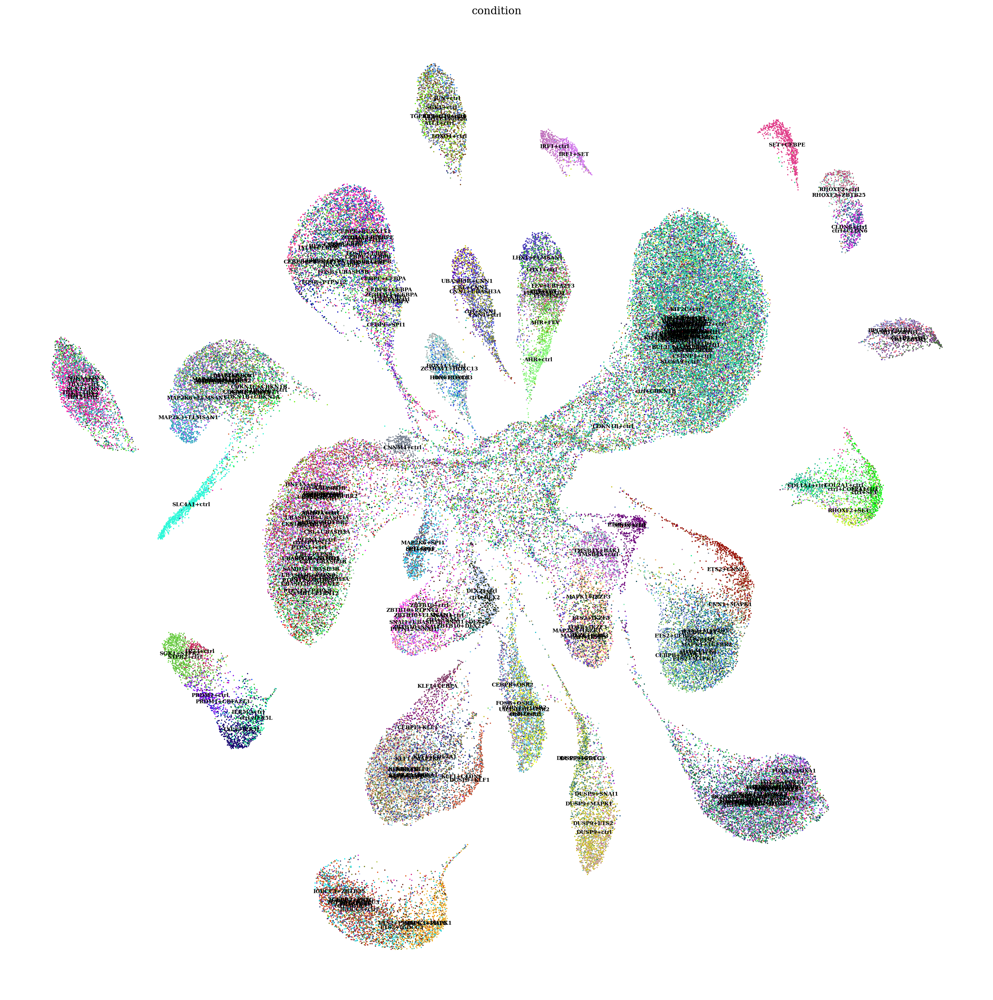

In [12]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()

In [13]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

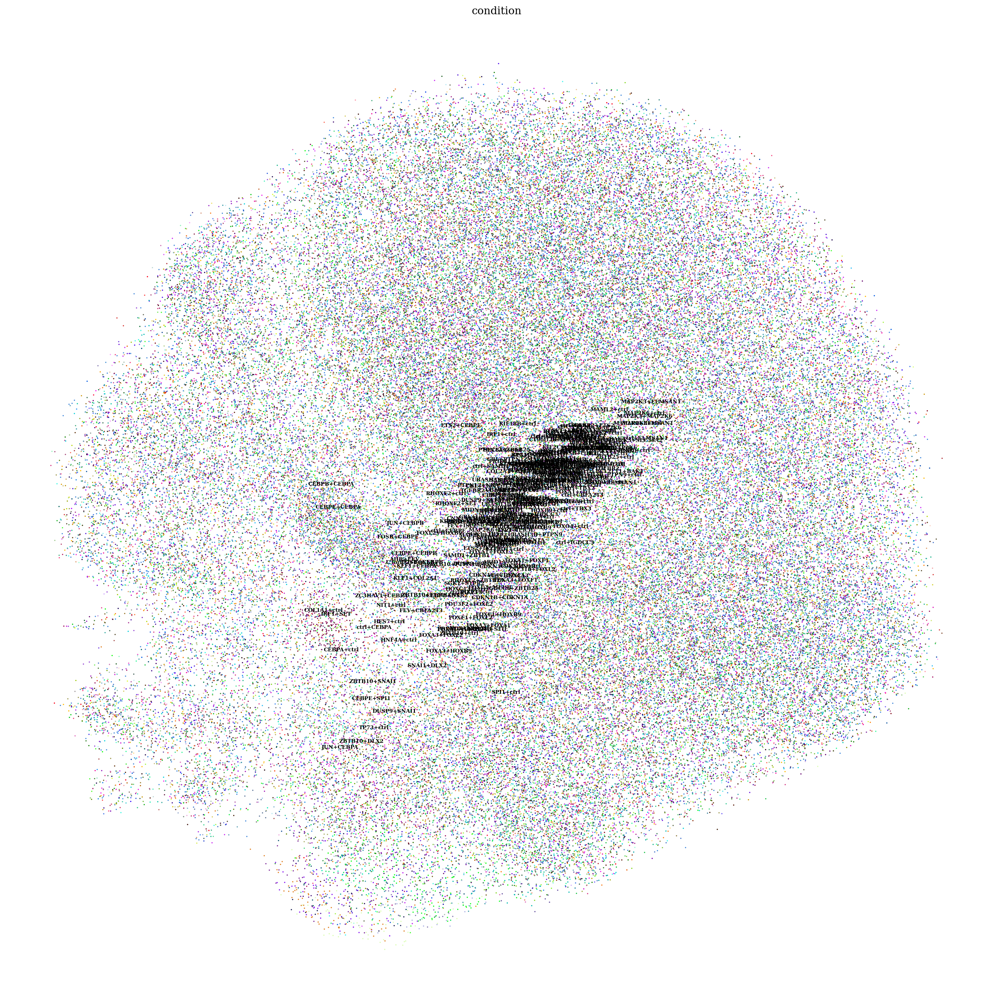

In [14]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()